## Machine Learning With Big Data Project

Agbola Iseoluwatobi : B00802526

Mahtab Sarvmaili : B00846513

## Imports

In [28]:
import re
import os
import xml.etree.ElementTree as et
import numpy as np
import pandas as pd
from nltk.corpus import stopwords
import nltk
from nltk.stem import WordNetLemmatizer
import matplotlib
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec
from keras.models import Model
from keras.regularizers import l1
from keras.optimizers import Adam
from keras.layers import Input
from keras import backend as K
from keras import regularizers
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras import optimizers
from keras import backend as K
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras import optimizers
import logging

## clustering
import random
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import OPTICS
from sklearn import mixture
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
## ending

## classification
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.manifold import TSNE
## ending

## ANN keras
from keras.layers import Input, Dense
from keras.models import Model
from keras.activations import softmax
## ending

## Train and Test
from sklearn.model_selection import train_test_split
## ending 
#downloading stop words
os.environ['TF_CPP_MIN_LOG_LEVEL']='2'

nltk.download('stopwords')
cachedStopWords = stopwords.words("english")
nltk.download('wordnet')
lemmatizer = WordNetLemmatizer()
glove_file = datapath(os.getcwd()+'/glove.6B.100d.txt')
result_file = 'results/'
result_path = 'results/'
extracted_data_path = 'extracted_data/'

[nltk_data] Downloading package stopwords to /home/nader/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/nader/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Data Extraction And Processing

In [1]:
def processing_data(extracted_data_path):
    
    #
    # Author Mahtab Sarvmaili
    #
        
    # reading the labels set and assign a number to each one of them
    label_set = {}
    f = open('topic_codes.txt','r')
    for i, line in enumerate(f):
        label_set[line.split()[0]] = i
    f.close()
    data = pd.DataFrame(columns=['filename', 'text', 'labels'])
    # reading our dataset and
    print('Processing text data and creating the DataFrame')
    print()
    list_of_files = os.listdir(extracted_data_path)
    print('The number of training data is : {}'.format(list_of_files.__len__()))
    n = int(input('Enter the number of instances for training: '))
    list_of_files = list_of_files[:n]
    for ff in list_of_files:
        try:
            b = {}
            b['filename'] = ff
            # reading the xml file
            tree = et.parse(extracted_data_path + ff)
            root = tree.getroot()
            # extracting data out of this tree
            for child in root.iter('text'):
                text = child.text

            # removing all digits from a string
            text = re.sub(r'\d+', '', text)

            # removing all special characters
            text = re.sub('[^0-9a-zA-Z\w.]', ' ' ,text)

            # Substituting multiple spaces with single space
            text = re.sub('\s+', ' ', text, flags=re.I)
            text = text.lower()

            # lemmatizing data
            # Remove single characters from the start
            text = ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in cachedStopWords and len(word)>2])
            b['text'] = text
        # finding all labels for each data
            labels = []
            for child in root.iter('codes'):
                if child.attrib['class'] == 'bip:topics:1.0':
                    for subchild in child.iter():
                        for sschild in subchild.iter():
                            if sschild.tag == 'code':
                                labels.append(label_set[sschild.attrib['code']])
            b['labels'] = labels
            data.loc[len(data)] = b
        except:
            print('Error happened during the processing of text data')
    return data

## Vectorize to TF-IDF

In [3]:
def data_to_tf_idf(data, max_features=1500):
    """
    Compute the TF-IDF for each documents after each document has been preprocessed.
    :param max_features: maximum number of features that should be considered for generating TF-IDF
    :return:
        a matrix of real value instances represents TF-IDF for each document
    """        
    # Author Mahtab Sarvmaili

    
    print()
    print('Calculating TF-IDF vectors')
    tfidfconverter = TfidfVectorizer(stop_words='english', max_features=max_features)
    tf_idf = tfidfconverter.fit_transform(data['text']).toarray()
    return tf_idf

## Mean Embedding Vectorizer Class

In [4]:
import numpy as np
import logging

class MeanEmbeddingVectorizer(object):
        
    #
    # Author Mahtab Sarvmaili
    #

    def __init__(self, word_model):
        self.word_model = word_model
        self.vector_size = word_model.wv.vector_size

    def fit(self):  # comply with scikit-learn transformer requirement
        return self

    def transform(self, docs):  # comply with scikit-learn transformer requirement
        doc_word_vector = self.word_average_list(docs)
        return doc_word_vector

    def word_average(self, sent):
        """
        Compute average word vector for a single doc/sentence.
        :param sent: list of sentence tokens
        :return:
        mean: float of averaging word vectors
        """
        mean = []
        for word in sent:
            if word in self.word_model.wv.vocab:
                mean.append(self.word_model.wv.get_vector(word))

        if not mean:  # empty words
            # If a text is empty, return a vector of zeros.
            logging.warning("cannot compute average owing to no vector for {}".format(sent))
            return np.zeros(self.vector_size)
        else:
            mean = np.array(mean).mean(axis=0)
            return mean


    def word_average_list(self, docs):
        """
        Compute average word vector for multiple docs, where docs had been tokenized.
        :param docs: list of sentence in list of separated tokens
        :return:
            array of average word vector in shape (len(docs),)
        """
        return np.vstack([self.word_average(sent) for sent in docs])

## Doc2Vec Vectorizer

In [5]:
def doc2vec(data):
    #
    # Author Mahtab Sarvmaili
    #
    word2vec_glove_file = get_tmpfile('glove.6B.100d.word2vec.txt')
    glove2word2vec(glove_file, word2vec_glove_file)
    model = KeyedVectors.load_word2vec_format(word2vec_glove_file)
    glove_mean_vec_tr = MeanEmbeddingVectorizer(model)
    glove_doc_vec = glove_mean_vec_tr.transform(data)
    return glove_doc_vec

## Plot Line

In [6]:
def plot_loss(loss_list,name):
    #
    # Author Mahtab Sarvmaili
    #
    t = list(range(1, len(loss_list)+1))
    s = loss_list
    fig, ax = plt.subplots()
    ax.plot(t, s)
    ax.set(xlabel='epochs', ylabel=name,
           title=''+name+' / epoch')
    ax.grid()
    plt.show()

## Plot 2 Lines

In [7]:
def plot_both_lines(list1,list2,name, save_fig_name):
    #
    # Author Mahtab Sarvmaili
    #
    t = list(range(1, len(list1)+1))
    s = list1
    z = list2
    fig, ax = plt.subplots()
    ax.plot(t, s)
    ax.plot(t, z)
    ax.set(xlabel='epochs', ylabel=name,
           title=''+name+' / epoch')
    ax.grid()
    plt.savefig(results+save_fig_name)
    plt.show()

# Silhoutte Plot

## Feature Extraction: Autoencoder

This Function implements a basic autoencoder based on the "Text feature extraction based on deep learning: a review" which is a feedforward network that can learn a compressed version of the data, reduce the dimensionality of the data can be used as feature extraction. it involves identical input and output layers with a code layer with a reduced dimension.The encoded layer is returned by the function as the extracted feature and plots the loss and validation loss during training. it was trained with the adam optimizer and the loss is the mean_squared_error function. the function was tested with many parameters and the current parameter state produced the best classification results.

In [8]:
def basic_autoencoder(train, test, full_data, cluster_num):
    #
    # Author Iseoluwatobi Agbola
    #
    
    # train, test = train.toarray(), test.toarray()
    encoding_dim = round(train.shape[1]/1.5)
    input_txt = Input(shape=(train.shape[1],))
    encoded = Dense(encoding_dim, activation='relu')(input_txt)
    decoded = Dense(train.shape[1], activation='relu')(encoded)
    autoencoder = Model(input_txt, decoded)
    encoder = Model(input_txt, encoded)
    encoded_input = Input(shape=(encoding_dim,))
    decoder_layer = autoencoder.layers[-1]
    decoder = Model(encoded_input, decoder_layer(encoded_input))
    autoencoder.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])
    x_train, x_test, full_data = train, test, full_data
    auto_model = autoencoder.fit(x_train, x_train,
                    epochs=100,
                    batch_size=256,
                    shuffle=True,
                    validation_data=(x_test, x_test))
    encoded_txt = encoder.predict(full_data)
    plot_both_lines(auto_model.history['loss'],auto_model.history['val_loss'],"epoch / Loss & val_loss",'relational_sparse_autoencoder_cluster_number_{}'.format(cluster_num))
    return encoded_txt

## Feature Extraction: Sparse Autoencoder

This Function Implements a Sparse Autoencoder based on this paper "Relational autoencoder for feature extraction" this involves attaching the L1 regularization penalty on the encoder activation function. This is combined with the basic autoencoder stucture in order to extract the features. this can aid in the removal of noise. The encoded layer is returned by the function as the extracted feature and plots the loss and validation loss during training.

In [9]:
def sparse_autoencoder(train, test, full_data, cluster_num):
    #
    # Author Iseoluwatobi Agbola
    #
    # train, test = train.toarray(), test.toarray()
    encoding_dim = round(train.shape[1]/1.5)
    input_txt = Input(shape=(train.shape[1],))
    encoded = Dense(encoding_dim, activation='relu',activity_regularizer=regularizers.l1(10e-5))(input_txt)
    decoded = Dense(train.shape[1], activation='relu')(encoded)
    autoencoder = Model(input_txt, decoded)
    encoder = Model(input_txt, encoded)
    encoded_input = Input(shape=(encoding_dim,))
    decoder_layer = autoencoder.layers[-1]
    decoder = Model(encoded_input, decoder_layer(encoded_input))
    autoencoder.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])
    x_train, x_test, full_data = train, test, full_data
    auto_model = autoencoder.fit(x_train, x_train,epochs=100,batch_size=256,shuffle=True,validation_data=(x_test, x_test))
    encoded_txt = encoder.predict(full_data)
    plot_both_lines(auto_model.history['loss'],auto_model.history['val_loss'],"epoch / Loss & val_loss",'relational_sparse_autoencoder_cluster_number_{}'.format(cluster_num))
    return encoded_txt

## Feature Extration: Relational Sparse Autoencoder

This Function Implements a Relational Sparse Autoencoder based on this paper "Relational autoencoder for feature extraction" this involves using the relational algorithm in the paper and combning it with the sparse regularization algorithm. This autoencoder extracts the features and it can aid in the removal of noise. The encoded layer is returned by the function as the extracted feature and plots the loss and validation loss during training.

In [10]:
def relational_sparse_autoencoder(train, test, full_data, cluster_num):
    #
    # Author Iseoluwatobi Agbola
    #
    # train, test, full_data = train.toarray(), test.toarray(), full_data.toarray()
    encoding_dim = round(train.shape[1]/1.5)
    input_txt = Input(shape=(train.shape[1],))
    encoded = Dense(encoding_dim, activation='relu',activity_regularizer=regularizers.l1(10e-5))(input_txt)
    decoded = Dense(train.shape[1], activation='relu')(encoded)
    autoencoder = Model(input_txt, decoded)
    encoder = Model(input_txt, encoded)
    encoded_input = Input(shape=(encoding_dim,))
    decoder_layer = autoencoder.layers[-1]
    decoder = Model(encoded_input, decoder_layer(encoded_input))
    sgd = optimizers.SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
    autoencoder.compile(optimizer=sgd, loss='mean_squared_error', metrics=['accuracy'])
    x_train, x_test, full_data = train, test, full_data
    auto_model = autoencoder.fit(x_train, x_train,
                    epochs=100,
                    batch_size=256,
                    shuffle=True,
                    validation_data=(x_test, x_test))
    encoded_txt = encoder.predict(full_data)
    plot_both_lines(auto_model.history['loss'],auto_model.history['val_loss'],"epoch / Loss & val_loss",'relational_sparse_autoencoder_cluster_number_{}'.format(cluster_num))
    return encoded_txt

## Feature Extraction: Process Autoencoders

We tried to use three different encoding algorithms to get the best encoding for our data. 
In order to find the best algorithm for enoding the data we implemented three Autoencoder 1- Simple Autoencoder, 
2- Relational Autoencoder 3- Sparse Autoencoder and then we classify the data based on these three encoding. 
Based on the obtained results from the classification part we can choose the best representation 

In [11]:
def data_encoder(tf_idf,cluster_num):
    """Trying to encoding the data withing in each cluster using three encoding approaches
    1- Simple AutoEncoder
    2- Relational Autoencoder
    3- Relational Sparse Autoencoder
    Parameters
    ----------
    tf_idf : np.array
        array of real valued numbers which represents tf-idf for docuemnt within a cluster.
    cluster_num: int
        number of that cluster
        
    Returns
    -------
    dict
        dictionary of encoded data for each cluster using three encoding methods

    """
    #
    # Author Mahtab Sarvmaili
    #
    X_train, X_test = train_test_split(tf_idf, test_size=0.3, random_state=42)
    encoded_data_relational_sparse = relational_sparse_autoencoder(X_train, X_test, tf_idf,cluster_num)
    encoded_data_sparse = sparse_autoencoder(X_train, X_test, tf_idf,cluster_num)
    encoded_data_basic = basic_autoencoder(X_train, X_test, tf_idf,cluster_num)
    return {
        'basic_AE': encoded_data_basic,
        'relational_sparse_AE':encoded_data_relational_sparse,
        'sparse_AE':encoded_data_sparse
    }

## Plot Data

In [12]:
def plot_data(data, hue=None, palette=None, title='', save=''):
    #
    # Author Mahtab Sarvmaili
    #
    tsne = TSNE(n_components=2, random_state=0)
    tsne_obj = tsne.fit_transform(data)
    tsne_df = pd.DataFrame({'X': tsne_obj[:, 0],'Y': tsne_obj[:, 1]})
    print(tsne_df.head())
    plt.figure()
    plt.title(title)
    sns.scatterplot(x="X", y="Y", data=tsne_df, hue=hue, palette=palette)
    plt.show()
    plt.savefig(save)

## Bar Chart

In [13]:
def bar_chart(x, y, title='', xlabel='', ylabel='', save='', num_bars=0):
    #
    # Author Mahtab Sarvmaili
    #
    all_colors = list(plt.cm.colors.cnames.keys())
    c = random.choices(all_colors, k=num_bars)
    plt.figure()
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.bar(x, y, color=c)
    plt.show()
    plt.savefig(result_path+save)

## Kmeans Cluster

In [14]:
def mkmeans(data):
    """Cluster Data using K-Means Algorithm and measure the silhoutte coefficient and Davis-Bouldin couefficient 
    for each one of clusters 
    
    Parameters
    ----------
    data 
        input data to be clustered


    Returns
    -------
    n 
        number of clusters
    kmeans_model
        the trained clustering model
    silhouette_score
        silhoutte score for this clustering 
    db_score
        Davis Bouldin score for this clustering.
    """

    # Author Mahtab Sarvmaili    
    scores = {}
    nclusters = [2,3,4,5,6,7,8,9,10]
    silhouette_score = {}
    db_score = {}
    kmeans_model = {}

    for i in nclusters:
        try:
            kmeans_model[i] = KMeans(n_clusters=i).fit(data)
            labels = kmeans_model[i].labels_
            scores[i] = kmeans_model[i].inertia_
            silhouette_score[i] = metrics.silhouette_score(data, labels)
            db_score[i] = metrics.davies_bouldin_score(data, labels)
        except Exception as e:
            print(e)
    plt.figure()
    plt.subplot(311)
    plt.ylabel('SSE')
    plt.plot(list(scores.keys()), list(scores.values()), color='blue')

    plt.subplot(312)
    plt.ylabel('Silhouette')
    plt.plot(list(silhouette_score.keys()), list(silhouette_score.values()), color='red')
    plt.xlabel('Number of Clusters')

    plt.subplot(313)
    plt.ylabel('Davis-Bouldin')
    plt.plot(list(db_score.keys()), list(db_score.values()), color='red')
    plt.xlabel('Number of Clusters')
    plt.show()
    plt.savefig(result_path+'kmeans_coefficient')
    print('the best number of clusters i')
    n = int(input('Choose the best number of clusters:'))
    plt.close()
    plot_data(data, hue=kmeans_model[n].labels_, palette="Set2", title='KMeans Clustered data', save='kmeans_result')
    return n, kmeans_model[n], silhouette_score[n], db_score[n]

## DBscan Clustering

In [15]:
def mdbscan(data):
    """Cluster Data using DB-SCAN Algorithm and measure the silhoutte coefficient and Davis-Bouldin couefficient 
    for each one of clusters 
    
    Parameters
    ----------
    data 
        input data to be clustered

    Returns
    -------
    n 
        number of clusters
    dbscan_model
        the trained clustering model
    silhouette_score
        silhoutte score for this clustering 
    db_score
        Davis Bouldin score for this clustering.
    """
    # Author Mahtab Sarvmaili
    eps = [10, 15, 20]
    silhouette_score = {}
    db_score = {}
    dbscan_model = {}
    distances = {}
    for i in eps:
        try:
            dbscan_model[i] = DBSCAN(eps=i, min_samples=100).fit(data)
            labels = dbscan_model[i].labels_
            silhouette_score[i] = metrics.silhouette_score(data, labels)
            db_score[i] = metrics.davies_bouldin_score(data, labels)
            nbrs = NearestNeighbors(n_neighbors=5).fit(data)
            distance, _ = nbrs.kneighbors(data)
            distances[i] = distance.mean()
        except Exception as e:
            print(e)

    plt.figure()
    plt.subplot(311)
    plt.ylabel('Silhouette')
    plt.plot(list(silhouette_score.keys()), list(silhouette_score.values()), color='red')

    plt.subplot(312)
    plt.ylabel('Davis-Bouldin')
    plt.plot(list(db_score.keys()), list(db_score.values()), color='blue')

    plt.subplot(313)
    plt.ylabel('Mean distance to Kth nearest neighbours')
    plt.plot(list(distances.keys()), list(distances.values()), color='green')
    plt.xlabel('Number of eps')


    plt.show()
    plt.savefig(result_path+'dbscan_coefficient')
    n = int(input('Choose the best number of eps:'))
    plt.close()
    plot_data(data, hue=dbscan_model[n].labels_, palette="Set2", title='DBSCAN Clustered data', save='dbscan_result')


    return n, dbscan_model[n], silhouette_score[n], db_score[n]

## Optics Clustering

In [16]:
def moptics(data):
    """Cluster Data using OPTICS Algorithm and measure the silhoutte coefficient and Davis-Bouldin couefficient 
    for each one of clusters 
    
    Parameters
    ----------
    data 
        input data to be clustered

    Returns
    -------
    n 
        number of clusters
    optic_models
        the trained clustering model
    silhouette_score
        silhoutte score for this clustering 
    db_score
        Davis Bouldin score for this clustering.
    """

    # Author Mahtab Sarvmaili
    min_samples = [2,3,4,5,6,7,8,9]
    silhouette_score = {}
    db_score = {}
    optic_models = {}
    for i in min_samples:
        try:
            optic_models[i] = OPTICS(min_samples=i,metric='cosine').fit(data)
            labels = optic_models[i].labels_
            silhouette_score[i] = metrics.silhouette_score(data, labels)
            db_score[i] = metrics.davies_bouldin_score(data, labels)
        except Exception as e:
            print(e)
    plt.figure()
    plt.subplot(211)
    plt.ylabel('Silhouette Coefficient')
    plt.plot(list(silhouette_score.keys()), list(silhouette_score.values()), color='red')
    plt.xlabel('Number of Clusters')

    plt.subplot(212)
    plt.ylabel('Davis-Bouldin Coefficient')
    plt.plot(list(db_score.keys()), list(db_score.values()), color='red')
    plt.xlabel('Number of Clusters')
    plt.show()
    plt.savefig(result_path+'optics_coefficient')
    n = int(input('Choose the best number for min_samples:'))
    plt.close()
    plot_data(data, hue=optic_models[n].labels_, palette="Set2", title='OPTICS Clustered data', save='optics_result')
    return n, optic_models[n], silhouette_score[n], db_score[n]

## Cluster Evaluation

In [17]:
def evaluate_clustering(data):
    """Calling clustering algorithms to cluster the data using those three methods,
    1- KMEANS
    2- DBSCAN
    3- OPTICS
    
    Author
    ----------
    Mahtab Sarvmaili
    
    Parameters
    ----------
    data 
        input data to be clustered
        

    Returns
    -------
    num-clusters 
        number of clusters
    clustering_algo
        the trained clustering model
    """


    silhouette = {}
    davis_bouldin = {}
    num_clusters = {}
    clustering = {}
    try:
        num_clusters['kmeans'], clustering['kmeans'], silhouette['kmeans'], davis_bouldin['kmeans'] = mkmeans(data)
    except Exception as e:
        print(e)
    try:
        num_clusters['dbscan'], clustering['dbscan'], silhouette['dbscan'], davis_bouldin['dbscan'] = mdbscan(data)
    except Exception as e:
        print(e)
    try:
        num_clusters['optics'], clustering['optics'], silhouette['optics'], davis_bouldin['optics'] = moptics(data)
    except Exception as e:
        print(e)
    bar_chart(
        silhouette.keys(),
        silhouette.values(),
        'Silhouette Coefficient Comparision',
        'Clustering Algorithms',
        'Silhouette Coefficient',
        'silhouette_comp',
        silhouette.__len__()
    )
    bar_chart(
        davis_bouldin.keys(),
        davis_bouldin.values(),
        'Davis-Bouldin Coefficient Comparision',
        'Clustering Algorithms',
        'Davis-Bouldin Coefficient',
        'db_comp',
        davis_bouldin.__len__()
    )
    print('The best clustering alggorithm based on Silhouette Coefficient is: ')
    i=np.argmax(list(silhouette.values()))
    algo = list(silhouette.keys())[i]
    print(algo)
    return num_clusters[algo], clustering[algo]

## Box Plot

In [18]:
def box_plot(algorithms_test_scores, encoder_name):
    # Author Mahtab Sarvmaili
    labels = ['random_forest','decision_tree','mlp','svm','logistic_regression']
    fig, ax = plt.subplots()
    ax.set_title('Hide Outlier Points')
    ax.boxplot(
        [algorithms_test_scores['random_forest'][encoder_name], algorithms_test_scores['decision_tree'][encoder_name],
         algorithms_test_scores['mlp'][encoder_name], algorithms_test_scores['svm'][encoder_name],
         algorithms_test_scores['logistic_regression'][encoder_name]],
        labels=labels,
        showfliers=False
    )
    ax.set_title('test')
    plt.savefig('box_plot_algorithm_comparison_{}'+encoder_name)
    plt.show()

## Classification

In [19]:
def classification(encoded_data, label, algorithm, params, algorithm_name='', save_dir=''):
    """Classifying input encoded_data using the input algorithms and trying to find the best parameter setting for 
    the classification algorithm using GridSearchCV
    
    Author
    ----------
    Mahtab Sarvmaili
    
    Parameters
    ----------
    encoded_data
        encoded data to train the classification model on it
    label
        label for the data
    algorithm
        classification algorithm on which we attempt to fit a model
            
    algorithm_name: str
        name of classification algorithm
    
    save_dir: str
        saving directory for charts
        

    Returns
    -------
    test_accuracy 
        the mean test accuracy 
    """

    
    scores = ['accuracy', 'precision_micro', 'recall_micro', 'f1_micro']

    # classification algorithm and parameter tuning based on 5-fold cross validation
    result = open(result_file+save_dir,'w')
    result.write('\n {} classification algorithm and parameter tuning based on 5-fold cross validation'.format(algorithm_name))
    print('{} classification algorithm and parameter tuning based on 5-fold cross validation'.format(algorithm_name))
    classifier_grid_search = GridSearchCV(
        estimator=algorithm,
        param_grid=params,
        scoring=scores,
        return_train_score=True,
        refit='f1_micro',
        cv=3
    )
    classifier_grid_search.fit(X=encoded_data, y=label)
    result.write(
        '\n{} Classifier best score for training data: {}'.format(algorithm_name, classifier_grid_search.best_score_))
    print('{} Classifier best score for training data:'.format(algorithm_name, classifier_grid_search.best_score_))
    result.write('\nBest parameters for {} Classifier algorithms are: {}'.format(algorithm_name, classifier_grid_search.best_params_))
    print('Best parameters for {} Classifier algorithms are: {}'.format(algorithm_name, classifier_grid_search.best_params_))
    print()
    result.write('\n\n')
    print()

    indecies = [i for i in classifier_grid_search.cv_results_.keys() if re.sub(r'\d+', '', i).__contains__('split_test_f_micro')]
    test_accuracy = np.asarray([classifier_grid_search.cv_results_[i].mean() for i in indecies])
    fig, ax = plt.subplots()
    ax.set_title('Mean of F1-Micro')
    ax.boxplot(test_accuracy, showfliers=False)
    plt.show()
    plt.savefig('mean_test_f1_micro_{}'.format(algorithm_name))
    return test_accuracy

## Keras ANN (Please Add to classification Function i do not want to cause errors during run time) 

In [20]:
## Takes in encoded Features and one hot encoded label or binarized label
## Convert output to int to get binary value
def classifier_ann(features,label):
    
    # Author Iseoluwatobi Agbola
    
    input_layers = features.shape[1]
    hidden_layers = round((features.shape[1]+label.shape[1])/2)
    output_layer = label.shape[1]
    X_train, X_test, y_train, y_test = train_test_split(features, label, test_size=0.8, random_state=42)
    classifier = Sequential()
    classifier.add(Dense(output_dim = hidden_layers, activation='relu', input_dim=input_layers))
    classifier.add(Dense(output_dim = hidden_layers, activation='relu'))
    classifier.add(Dense(output_dim = hidden_layers, activation='relu'))
    classifier.add(Dense(output_dim = hidden_layers, activation='relu'))
    classifier.add(Dense(output_dim = hidden_layers, activation='relu'))
    classifier.add(Dense(output_dim = hidden_layers, activation='relu'))
    classifier.add(Dense(output_dim = hidden_layers, activation='relu'))
    classifier.add(Dense(output_dim = hidden_layers, activation='relu'))
    classifier.add(Dense(output_dim = hidden_layers, activation='relu'))
    classifier.add(Dense(output_dim = hidden_layers, activation='relu'))
    classifier.add(Dense(output_dim = output_layer, activation='softmax'))
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['categorical_accuracy'])
    model_fit = classifier.fit(X_train, y_train, epochs=100,batch_size=80,)
    plot_loss(model_fit.history['categorical_accuracy'],"categorical_accuracy")
    plot_loss(model_fit.history['loss'],"loss")
    pred = classifier.predict(X_test)
    return pred

## Classification Evaluation

In [21]:
def classification_evaluation(num_clusters, encoded_data, labels, indicies_of_data_clusters):
    """Classifying input encoded_data using classification algorithms with the selected parameter 
    for each one of these algorithms
    
    Author
    ----------
    Mahtab Sarvmaili
    
    Parameters
    ----------
    num_clusters
        the number of clusters 
    encoded_data
        encoded data
    labels
        labels of input data
    indicies_of_data_clusters
        indicies of data which belong to the same cluster

    """

    # Author Mahtab Sarvmaili
    
    mlb = MultiLabelBinarizer()
    binarized_label = mlb.fit_transform(labels)
    algorithms = {
        'random_forest':RandomForestClassifier(),
        'decision_tree':DecisionTreeClassifier(),
        'mlp':MLPClassifier(),
        'svm': OneVsRestClassifier(SVC()),
        'logistic_regression':OneVsRestClassifier(LogisticRegression())
    }
    algorithms_test_scores = {
        'random_forest': {},
        'decision_tree': {},
        'mlp': {},
        'svm': {},
        'logistic_regression': {}
    }
    params = {
        'random_forest': {'n_estimators':[100], 'criterion':['gini', 'entropy']},
        'decision_tree': {'criterion':['gini', 'entropy'],'splitter':['best','random']},
        'logistic_regression': {'estimator__penalty': ['l2'], 'estimator__solver': ['newton-cg', 'sag', 'saga']},
        'mlp':{'hidden_layer_sizes':[100,200],'activation':['relu'],'solver':['adam'],'alpha':[0.001],'learning_rate':['adaptive']},
        'svm':{'estimator__kernel':['linear', 'rbf'], 'estimator__C': [1,2,4,8]},
    }
    encoders = ['basic_AE','relational_sparse_AE','sparse_AE']
    for algo in algorithms.keys():
        for i in range(num_clusters):
            for encoder in encoded_data[i].keys():

                a = algorithms[algo]
                print('Classification algorithms: {}, Cluster Number: {}, Encoding Algorithm: {}'.format(algo,i,encoder))
                test_accuracy = classification(
                    encoded_data[i][encoder], binarized_label[indicies_of_data_clusters[i]], a, params[algo], algo, '{}_{}_'.format(algo,encoder)
                )
                classifier_ann(encoded_data[i][encoder],binarized_label[indicies_of_data_clusters[i]])
                algorithms_test_scores[algo][encoder] = test_accuracy

    for en in encoders:
        box_plot(algorithms_test_scores, en)

## Data Processing

In [22]:
data = processing_data(extracted_data_path)
data

Processing text data and creating the DataFrame

The number of training data is : 48375
Enter the number of instances for training: 15000


,filename,text,labels
0,436734newsML.xmln,record million tourist visited miami area topp...,"[64, 65, 70, 90, 109, 64, 65, 70, 90, 109]"
1,460502newsML.xmln,dutch export certainly reach previously foreca...,"[64, 66, 70, 64, 66, 70]"
2,461450newsML.xmln,summary dutch first division soccer match play...,"[90, 108, 90, 108]"
3,469216newsML.xmln,opening manila coconut oil price reported unit...,"[119, 120, 123, 119, 120, 123]"
4,406206newsML.xmln,european parliament thursday approved european...,"[80, 88, 90, 93, 80, 88, 90, 93]"
...,...,...,...
14995,465203newsML.xmln,american stock exchange plan list option ameri...,"[14, 44, 14, 44]"
14996,435376newsML.xmln,shr primary shr diluted net rev avg shrs prima...,"[15, 16, 17, 44, 15, 16, 17, 44]"
14997,452054newsML.xmln,u.s. investment junk corporate bond spread wea...,"[115, 123, 115, 123]"
14998,471889newsML.xmln,troubled nippon credit bank ltd said thursday ...,"[11, 15, 16, 20, 44, 11, 15, 16, 20, 44]"


## TF_IDF

In [23]:
tf_idf = data_to_tf_idf(data)
tf_idf


Calculating TF-IDF vectors


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [24]:
tf_idf.shape

(15000, 1500)

## Plot Data

           X          Y
0  19.025330 -14.258909
1 -36.843708  22.197489
2 -59.395164  59.316875
3  70.346764  -2.348918
4 -20.922981  19.035040


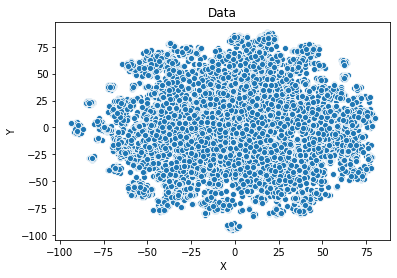

<Figure size 432x288 with 0 Axes>

In [25]:
plot_data(data=tf_idf, title='Data',save=result_path+'raw_data')

## Evaluate Cluster

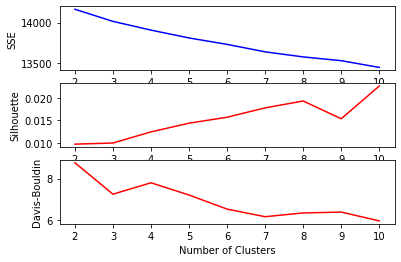

the best number of clusters i
Choose the best number of clusters:8
           X          Y
0  19.025330 -14.258909
1 -36.843708  22.197489
2 -59.395164  59.316875
3  70.346764  -2.348918
4 -20.922981  19.035040


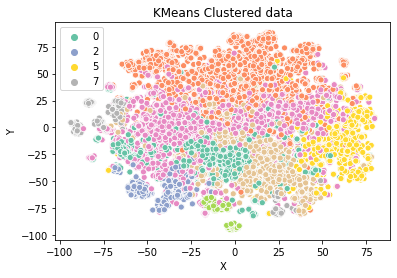

Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)
Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)


<Figure size 432x288 with 0 Axes>

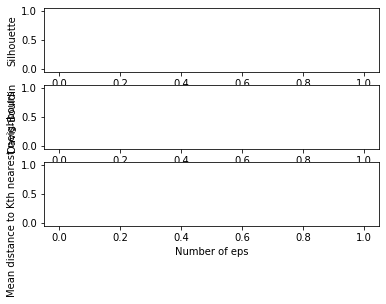

Choose the best number of eps:nan
invalid literal for int() with base 10: 'nan'


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/cluster/_optics.py:802: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/cluster/_optics.py:802: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/cluster/_optics.py:802: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/cluster/_optics.py:802: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/cluster/_optic

<Figure size 432x288 with 0 Axes>

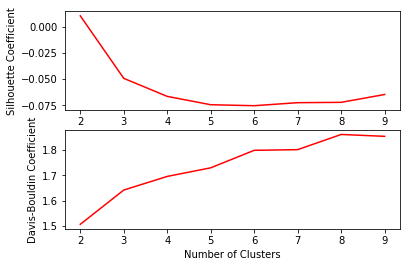

Choose the best number for min_samples:nan
invalid literal for int() with base 10: 'nan'


<Figure size 432x288 with 0 Axes>

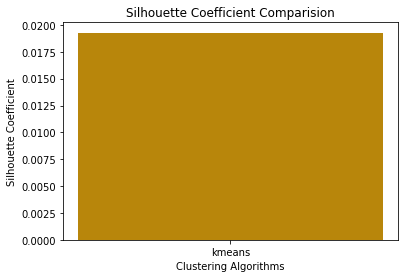

<Figure size 432x288 with 0 Axes>

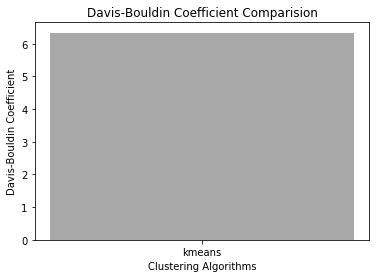

The best clustering alggorithm based on Silhouette Coefficient is: 
kmeans


<Figure size 432x288 with 0 Axes>

In [26]:
num_clusters, clustering_algorithm = evaluate_clustering(tf_idf)

## Run and Classify Clusters 

Train on 1131 samples, validate on 485 samples
Epoch 1/100
1131/1131 [==============================] - 0s 147us/step - loss: 0.2669 - accuracy: 0.0000e+00 - val_loss: 0.2475 - val_accuracy: 0.0000e+00
Epoch 2/100
1131/1131 [==============================] - 0s 95us/step - loss: 0.2323 - accuracy: 8.8417e-04 - val_loss: 0.2040 - val_accuracy: 0.0000e+00
Epoch 3/100
1131/1131 [==============================] - 0s 98us/step - loss: 0.1883 - accuracy: 0.0018 - val_loss: 0.1602 - val_accuracy: 0.0000e+00
Epoch 4/100
1131/1131 [==============================] - 0s 93us/step - loss: 0.1467 - accuracy: 0.0035 - val_loss: 0.1231 - val_accuracy: 0.0000e+00
Epoch 5/100
1131/1131 [==============================] - 0s 96us/step - loss: 0.1127 - accuracy: 0.0027 - val_loss: 0.0945 - val_accuracy: 0.0000e+00
Epoch 6/100
1131/1131 [==============================] - 0s 96us/step - loss: 0.0867 - accuracy: 8.8417e-04 - val_loss: 0.0735 - val_accuracy: 0.0000e+00
Epoch 7/100
1131/1131 [=================

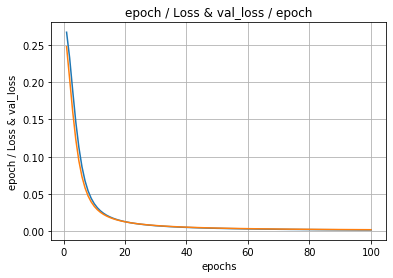

Train on 1131 samples, validate on 485 samples
Epoch 1/100
1131/1131 [==============================] - 0s 184us/step - loss: 0.1853 - accuracy: 8.8417e-04 - val_loss: 0.0587 - val_accuracy: 0.0186
Epoch 2/100
1131/1131 [==============================] - 0s 115us/step - loss: 0.0373 - accuracy: 0.0133 - val_loss: 0.0130 - val_accuracy: 0.0206
Epoch 3/100
1131/1131 [==============================] - 0s 112us/step - loss: 0.0085 - accuracy: 0.0221 - val_loss: 0.0042 - val_accuracy: 0.0351
Epoch 4/100
1131/1131 [==============================] - 0s 108us/step - loss: 0.0027 - accuracy: 0.0398 - val_loss: 0.0021 - val_accuracy: 0.0557
Epoch 5/100
1131/1131 [==============================] - 0s 107us/step - loss: 0.0014 - accuracy: 0.0575 - val_loss: 0.0014 - val_accuracy: 0.0742
Epoch 6/100
1131/1131 [==============================] - 0s 110us/step - loss: 9.6624e-04 - accuracy: 0.0637 - val_loss: 0.0011 - val_accuracy: 0.0763
Epoch 7/100
1131/1131 [==============================] - 0s 110

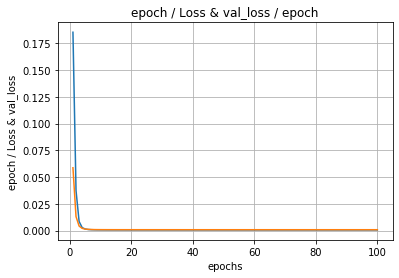

Train on 1131 samples, validate on 485 samples
Epoch 1/100
1131/1131 [==============================] - 0s 171us/step - loss: 7.3066e-04 - accuracy: 0.0035 - val_loss: 6.6639e-04 - val_accuracy: 0.0557
Epoch 2/100
1131/1131 [==============================] - 0s 107us/step - loss: 6.4598e-04 - accuracy: 0.0663 - val_loss: 6.1796e-04 - val_accuracy: 0.0804
Epoch 3/100
1131/1131 [==============================] - 0s 107us/step - loss: 6.0760e-04 - accuracy: 0.0734 - val_loss: 5.9295e-04 - val_accuracy: 0.0804
Epoch 4/100
1131/1131 [==============================] - 0s 108us/step - loss: 5.8598e-04 - accuracy: 0.0725 - val_loss: 5.7852e-04 - val_accuracy: 0.0804
Epoch 5/100
1131/1131 [==============================] - 0s 107us/step - loss: 5.7267e-04 - accuracy: 0.0725 - val_loss: 5.6871e-04 - val_accuracy: 0.0804
Epoch 6/100
1131/1131 [==============================] - 0s 109us/step - loss: 5.6163e-04 - accuracy: 0.0734 - val_loss: 5.5902e-04 - val_accuracy: 0.0887
Epoch 7/100
1131/1131 [

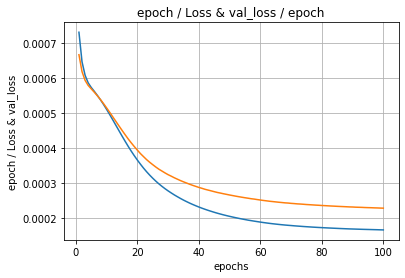

Train on 2804 samples, validate on 1203 samples
Epoch 1/100
2804/2804 [==============================] - 0s 113us/step - loss: 0.2616 - accuracy: 3.5663e-04 - val_loss: 0.2008 - val_accuracy: 0.0017
Epoch 2/100
2804/2804 [==============================] - 0s 92us/step - loss: 0.1658 - accuracy: 0.0000e+00 - val_loss: 0.1151 - val_accuracy: 8.3126e-04
Epoch 3/100
2804/2804 [==============================] - 0s 96us/step - loss: 0.0942 - accuracy: 3.5663e-04 - val_loss: 0.0668 - val_accuracy: 0.0017
Epoch 4/100
2804/2804 [==============================] - 0s 92us/step - loss: 0.0566 - accuracy: 7.1327e-04 - val_loss: 0.0427 - val_accuracy: 0.0017
Epoch 5/100
2804/2804 [==============================] - 0s 91us/step - loss: 0.0378 - accuracy: 3.5663e-04 - val_loss: 0.0302 - val_accuracy: 0.0017
Epoch 6/100
2804/2804 [==============================] - 0s 91us/step - loss: 0.0276 - accuracy: 3.5663e-04 - val_loss: 0.0230 - val_accuracy: 0.0017
Epoch 7/100
2804/2804 [========================

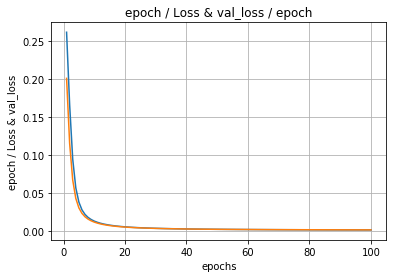

Train on 2804 samples, validate on 1203 samples
Epoch 1/100
2804/2804 [==============================] - 0s 142us/step - loss: 0.0939 - accuracy: 0.0014 - val_loss: 0.0094 - val_accuracy: 0.0075
Epoch 2/100
2804/2804 [==============================] - 0s 106us/step - loss: 0.0041 - accuracy: 0.0021 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/100
2804/2804 [==============================] - 0s 107us/step - loss: 0.0012 - accuracy: 0.0011 - val_loss: 0.0012 - val_accuracy: 0.0000e+00
Epoch 4/100
2804/2804 [==============================] - 0s 107us/step - loss: 8.4384e-04 - accuracy: 0.0011 - val_loss: 9.8239e-04 - val_accuracy: 0.0000e+00
Epoch 5/100
2804/2804 [==============================] - 0s 107us/step - loss: 7.3542e-04 - accuracy: 0.0011 - val_loss: 9.2469e-04 - val_accuracy: 0.0000e+00
Epoch 6/100
2804/2804 [==============================] - 0s 107us/step - loss: 6.8861e-04 - accuracy: 0.0011 - val_loss: 9.0062e-04 - val_accuracy: 0.0000e+00
Epoch 7/100
2804/2804 [===

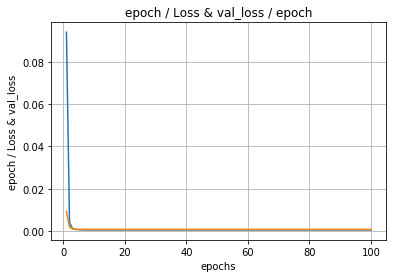

Train on 2804 samples, validate on 1203 samples
Epoch 1/100
2804/2804 [==============================] - 0s 131us/step - loss: 7.0046e-04 - accuracy: 0.0039 - val_loss: 6.5566e-04 - val_accuracy: 0.0058
Epoch 2/100
2804/2804 [==============================] - 0s 103us/step - loss: 6.4574e-04 - accuracy: 0.0032 - val_loss: 6.3953e-04 - val_accuracy: 0.0017
Epoch 3/100
2804/2804 [==============================] - 0s 102us/step - loss: 6.3243e-04 - accuracy: 0.0093 - val_loss: 6.2843e-04 - val_accuracy: 0.0183
Epoch 4/100
2804/2804 [==============================] - 0s 103us/step - loss: 6.1883e-04 - accuracy: 0.0464 - val_loss: 6.1537e-04 - val_accuracy: 0.0715
Epoch 5/100
2804/2804 [==============================] - 0s 103us/step - loss: 6.0249e-04 - accuracy: 0.1113 - val_loss: 5.9920e-04 - val_accuracy: 0.1272
Epoch 6/100
2804/2804 [==============================] - 0s 112us/step - loss: 5.8220e-04 - accuracy: 0.1690 - val_loss: 5.7912e-04 - val_accuracy: 0.1862
Epoch 7/100
2804/2804 

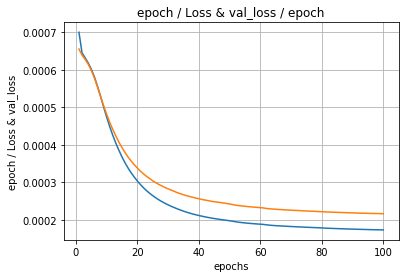

Train on 548 samples, validate on 236 samples
Epoch 1/100
548/548 [==============================] - 0s 226us/step - loss: 0.2675 - accuracy: 0.0000e+00 - val_loss: 0.2506 - val_accuracy: 0.0000e+00
Epoch 2/100
548/548 [==============================] - 0s 108us/step - loss: 0.2524 - accuracy: 0.0000e+00 - val_loss: 0.2304 - val_accuracy: 0.0000e+00
Epoch 3/100
548/548 [==============================] - 0s 107us/step - loss: 0.2310 - accuracy: 0.0000e+00 - val_loss: 0.2065 - val_accuracy: 0.0000e+00
Epoch 4/100
548/548 [==============================] - 0s 104us/step - loss: 0.2062 - accuracy: 0.0000e+00 - val_loss: 0.1816 - val_accuracy: 0.0000e+00
Epoch 5/100
548/548 [==============================] - 0s 103us/step - loss: 0.1808 - accuracy: 0.0000e+00 - val_loss: 0.1576 - val_accuracy: 0.0000e+00
Epoch 6/100
548/548 [==============================] - 0s 102us/step - loss: 0.1565 - accuracy: 0.0000e+00 - val_loss: 0.1355 - val_accuracy: 0.0000e+00
Epoch 7/100
548/548 [===============

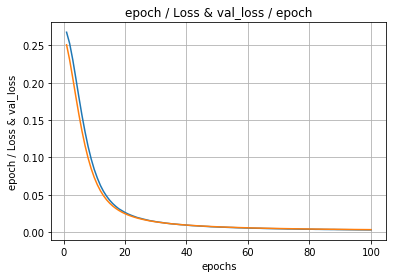

Train on 548 samples, validate on 236 samples
Epoch 1/100
548/548 [==============================] - 0s 262us/step - loss: 0.2457 - accuracy: 0.0018 - val_loss: 0.1348 - val_accuracy: 0.0085
Epoch 2/100
548/548 [==============================] - 0s 125us/step - loss: 0.1219 - accuracy: 0.0182 - val_loss: 0.0652 - val_accuracy: 0.0339
Epoch 3/100
548/548 [==============================] - 0s 123us/step - loss: 0.0573 - accuracy: 0.0292 - val_loss: 0.0300 - val_accuracy: 0.0339
Epoch 4/100
548/548 [==============================] - 0s 122us/step - loss: 0.0255 - accuracy: 0.0383 - val_loss: 0.0138 - val_accuracy: 0.0254
Epoch 5/100
548/548 [==============================] - 0s 122us/step - loss: 0.0116 - accuracy: 0.0474 - val_loss: 0.0068 - val_accuracy: 0.0254
Epoch 6/100
548/548 [==============================] - 0s 128us/step - loss: 0.0055 - accuracy: 0.0347 - val_loss: 0.0037 - val_accuracy: 0.0381
Epoch 7/100
548/548 [==============================] - 0s 125us/step - loss: 0.0028 

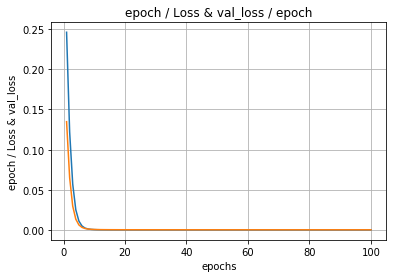

Train on 548 samples, validate on 236 samples
Epoch 1/100
548/548 [==============================] - 0s 255us/step - loss: 7.5992e-04 - accuracy: 0.0036 - val_loss: 6.7780e-04 - val_accuracy: 0.0424
Epoch 2/100
548/548 [==============================] - 0s 127us/step - loss: 6.5982e-04 - accuracy: 0.0858 - val_loss: 6.0640e-04 - val_accuracy: 0.1017
Epoch 3/100
548/548 [==============================] - 0s 125us/step - loss: 5.9172e-04 - accuracy: 0.1496 - val_loss: 5.5613e-04 - val_accuracy: 0.1314
Epoch 4/100
548/548 [==============================] - 0s 125us/step - loss: 5.4243e-04 - accuracy: 0.1752 - val_loss: 5.1693e-04 - val_accuracy: 0.1398
Epoch 5/100
548/548 [==============================] - 0s 127us/step - loss: 5.0412e-04 - accuracy: 0.1807 - val_loss: 4.8821e-04 - val_accuracy: 0.1356
Epoch 6/100
548/548 [==============================] - 0s 123us/step - loss: 4.7566e-04 - accuracy: 0.1843 - val_loss: 4.6740e-04 - val_accuracy: 0.1483
Epoch 7/100
548/548 [===============

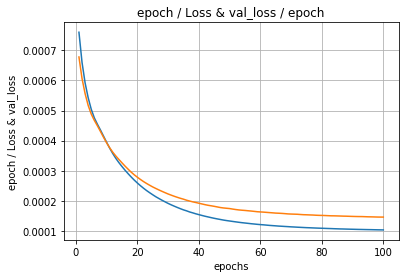

Train on 2804 samples, validate on 1202 samples
Epoch 1/100
2804/2804 [==============================] - 0s 113us/step - loss: 0.2626 - accuracy: 0.0014 - val_loss: 0.2009 - val_accuracy: 0.0000e+00
Epoch 2/100
2804/2804 [==============================] - 0s 91us/step - loss: 0.1654 - accuracy: 0.0018 - val_loss: 0.1142 - val_accuracy: 0.0000e+00
Epoch 3/100
2804/2804 [==============================] - 0s 91us/step - loss: 0.0933 - accuracy: 0.0018 - val_loss: 0.0659 - val_accuracy: 8.3195e-04
Epoch 4/100
2804/2804 [==============================] - 0s 90us/step - loss: 0.0559 - accuracy: 0.0011 - val_loss: 0.0421 - val_accuracy: 0.0017
Epoch 5/100
2804/2804 [==============================] - 0s 91us/step - loss: 0.0372 - accuracy: 3.5663e-04 - val_loss: 0.0298 - val_accuracy: 0.0017
Epoch 6/100
2804/2804 [==============================] - 0s 91us/step - loss: 0.0272 - accuracy: 3.5663e-04 - val_loss: 0.0228 - val_accuracy: 0.0017
Epoch 7/100
2804/2804 [==============================] 

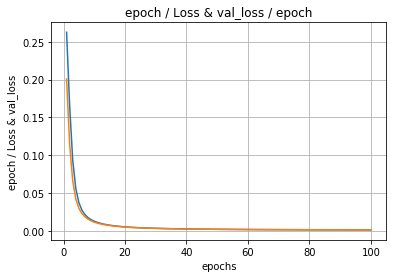

Train on 2804 samples, validate on 1202 samples
Epoch 1/100
2804/2804 [==============================] - 0s 136us/step - loss: 0.0966 - accuracy: 0.0025 - val_loss: 0.0100 - val_accuracy: 0.0033
Epoch 2/100
2804/2804 [==============================] - 0s 104us/step - loss: 0.0042 - accuracy: 0.0021 - val_loss: 0.0018 - val_accuracy: 0.0017
Epoch 3/100
2804/2804 [==============================] - 0s 105us/step - loss: 0.0011 - accuracy: 0.0018 - val_loss: 0.0011 - val_accuracy: 8.3195e-04
Epoch 4/100
2804/2804 [==============================] - 0s 105us/step - loss: 7.9944e-04 - accuracy: 7.1327e-04 - val_loss: 9.2554e-04 - val_accuracy: 8.3195e-04
Epoch 5/100
2804/2804 [==============================] - 0s 105us/step - loss: 7.1025e-04 - accuracy: 7.1327e-04 - val_loss: 8.7990e-04 - val_accuracy: 8.3195e-04
Epoch 6/100
2804/2804 [==============================] - 0s 105us/step - loss: 6.7362e-04 - accuracy: 7.1327e-04 - val_loss: 8.6246e-04 - val_accuracy: 8.3195e-04
Epoch 7/100
2804/2

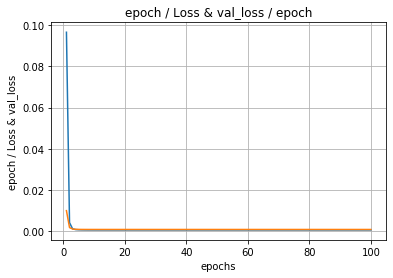

Train on 2804 samples, validate on 1202 samples
Epoch 1/100
2804/2804 [==============================] - 0s 136us/step - loss: 6.9574e-04 - accuracy: 0.0068 - val_loss: 6.5271e-04 - val_accuracy: 0.0100
Epoch 2/100
2804/2804 [==============================] - 0s 107us/step - loss: 6.4191e-04 - accuracy: 0.0125 - val_loss: 6.3616e-04 - val_accuracy: 0.0050
Epoch 3/100
2804/2804 [==============================] - 0s 106us/step - loss: 6.3010e-04 - accuracy: 0.0025 - val_loss: 6.2864e-04 - val_accuracy: 0.0017
Epoch 4/100
2804/2804 [==============================] - 0s 105us/step - loss: 6.2079e-04 - accuracy: 0.0029 - val_loss: 6.2038e-04 - val_accuracy: 0.0033
Epoch 5/100
2804/2804 [==============================] - 0s 104us/step - loss: 6.0994e-04 - accuracy: 0.0157 - val_loss: 6.1084e-04 - val_accuracy: 0.0216
Epoch 6/100
2804/2804 [==============================] - 0s 104us/step - loss: 5.9683e-04 - accuracy: 0.0410 - val_loss: 5.9906e-04 - val_accuracy: 0.0491
Epoch 7/100
2804/2804 

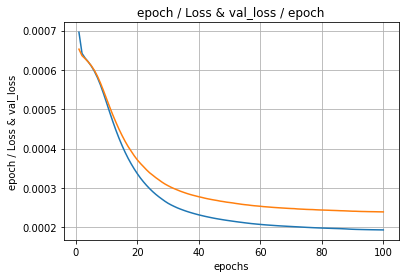

Train on 215 samples, validate on 93 samples
Epoch 1/100
215/215 [==============================] - 0s 409us/step - loss: 0.2497 - accuracy: 0.0000e+00 - val_loss: 0.1073 - val_accuracy: 0.0000e+00
Epoch 2/100
215/215 [==============================] - 0s 123us/step - loss: 0.2458 - accuracy: 0.0000e+00 - val_loss: 0.1050 - val_accuracy: 0.0000e+00
Epoch 3/100
215/215 [==============================] - 0s 105us/step - loss: 0.2403 - accuracy: 0.0000e+00 - val_loss: 0.1021 - val_accuracy: 0.0000e+00
Epoch 4/100
215/215 [==============================] - 0s 115us/step - loss: 0.2335 - accuracy: 0.0000e+00 - val_loss: 0.0987 - val_accuracy: 0.0000e+00
Epoch 5/100
215/215 [==============================] - 0s 109us/step - loss: 0.2255 - accuracy: 0.0000e+00 - val_loss: 0.0949 - val_accuracy: 0.0000e+00
Epoch 6/100
215/215 [==============================] - 0s 116us/step - loss: 0.2166 - accuracy: 0.0000e+00 - val_loss: 0.0908 - val_accuracy: 0.0000e+00
Epoch 7/100
215/215 [================

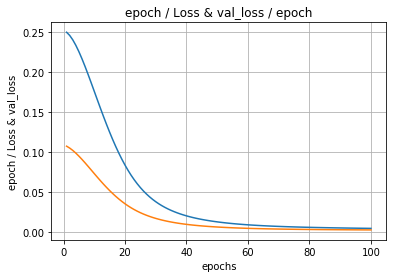

Train on 215 samples, validate on 93 samples
Epoch 1/100
215/215 [==============================] - 0s 503us/step - loss: 0.2554 - accuracy: 0.0000e+00 - val_loss: 0.0911 - val_accuracy: 0.0000e+00
Epoch 2/100
215/215 [==============================] - 0s 140us/step - loss: 0.2094 - accuracy: 0.0000e+00 - val_loss: 0.0743 - val_accuracy: 0.0000e+00
Epoch 3/100
215/215 [==============================] - 0s 124us/step - loss: 0.1692 - accuracy: 0.0000e+00 - val_loss: 0.0599 - val_accuracy: 0.0000e+00
Epoch 4/100
215/215 [==============================] - 0s 121us/step - loss: 0.1348 - accuracy: 0.0000e+00 - val_loss: 0.0477 - val_accuracy: 0.0108
Epoch 5/100
215/215 [==============================] - 0s 117us/step - loss: 0.1059 - accuracy: 0.0140 - val_loss: 0.0375 - val_accuracy: 0.0215
Epoch 6/100
215/215 [==============================] - 0s 124us/step - loss: 0.0820 - accuracy: 0.0186 - val_loss: 0.0292 - val_accuracy: 0.0215
Epoch 7/100
215/215 [==============================] - 0s

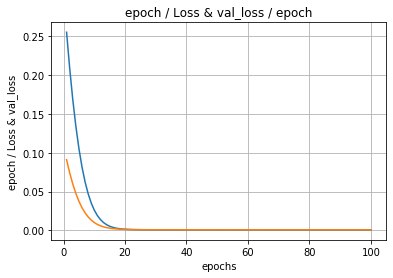

Train on 215 samples, validate on 93 samples
Epoch 1/100
215/215 [==============================] - 0s 479us/step - loss: 7.9246e-04 - accuracy: 0.0000e+00 - val_loss: 7.3784e-04 - val_accuracy: 0.0108
Epoch 2/100
215/215 [==============================] - 0s 129us/step - loss: 7.3453e-04 - accuracy: 0.0000e+00 - val_loss: 6.8627e-04 - val_accuracy: 0.2151
Epoch 3/100
215/215 [==============================] - 0s 115us/step - loss: 6.8053e-04 - accuracy: 0.2651 - val_loss: 6.4189e-04 - val_accuracy: 0.3763
Epoch 4/100
215/215 [==============================] - 0s 116us/step - loss: 6.3427e-04 - accuracy: 0.4326 - val_loss: 6.0432e-04 - val_accuracy: 0.4409
Epoch 5/100
215/215 [==============================] - 0s 118us/step - loss: 5.9522e-04 - accuracy: 0.4744 - val_loss: 5.7160e-04 - val_accuracy: 0.3656
Epoch 6/100
215/215 [==============================] - 0s 124us/step - loss: 5.6138e-04 - accuracy: 0.4326 - val_loss: 5.4207e-04 - val_accuracy: 0.3656
Epoch 7/100
215/215 [========

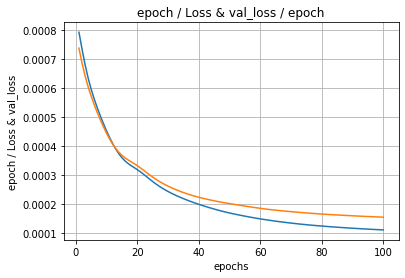

Train on 1119 samples, validate on 480 samples
Epoch 1/100
1119/1119 [==============================] - 0s 150us/step - loss: 0.2680 - accuracy: 8.9366e-04 - val_loss: 0.2462 - val_accuracy: 0.0000e+00
Epoch 2/100
1119/1119 [==============================] - 0s 94us/step - loss: 0.2357 - accuracy: 8.9366e-04 - val_loss: 0.2062 - val_accuracy: 0.0000e+00
Epoch 3/100
1119/1119 [==============================] - 0s 94us/step - loss: 0.1945 - accuracy: 8.9366e-04 - val_loss: 0.1652 - val_accuracy: 0.0000e+00
Epoch 4/100
1119/1119 [==============================] - 0s 93us/step - loss: 0.1545 - accuracy: 8.9366e-04 - val_loss: 0.1297 - val_accuracy: 0.0000e+00
Epoch 5/100
1119/1119 [==============================] - 0s 93us/step - loss: 0.1210 - accuracy: 8.9366e-04 - val_loss: 0.1015 - val_accuracy: 0.0000e+00
Epoch 6/100
1119/1119 [==============================] - 0s 93us/step - loss: 0.0949 - accuracy: 0.0000e+00 - val_loss: 0.0802 - val_accuracy: 0.0000e+00
Epoch 7/100
1119/1119 [=====

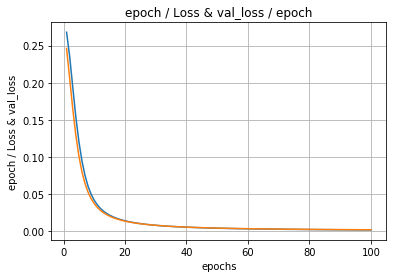

Train on 1119 samples, validate on 480 samples
Epoch 1/100
1119/1119 [==============================] - 0s 178us/step - loss: 0.1909 - accuracy: 0.0018 - val_loss: 0.0668 - val_accuracy: 0.0146
Epoch 2/100
1119/1119 [==============================] - 0s 111us/step - loss: 0.0465 - accuracy: 0.0170 - val_loss: 0.0168 - val_accuracy: 0.0250
Epoch 3/100
1119/1119 [==============================] - 0s 111us/step - loss: 0.0125 - accuracy: 0.0232 - val_loss: 0.0056 - val_accuracy: 0.0271
Epoch 4/100
1119/1119 [==============================] - 0s 109us/step - loss: 0.0044 - accuracy: 0.0250 - val_loss: 0.0026 - val_accuracy: 0.0312
Epoch 5/100
1119/1119 [==============================] - 0s 115us/step - loss: 0.0020 - accuracy: 0.0340 - val_loss: 0.0016 - val_accuracy: 0.0333
Epoch 6/100
1119/1119 [==============================] - 0s 121us/step - loss: 0.0013 - accuracy: 0.0500 - val_loss: 0.0012 - val_accuracy: 0.0396
Epoch 7/100
1119/1119 [==============================] - 0s 119us/step 

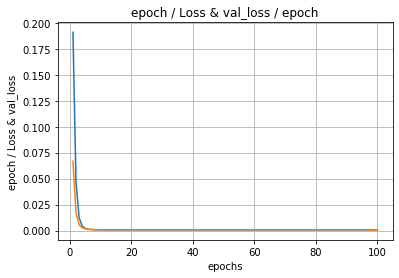

Train on 1119 samples, validate on 480 samples
Epoch 1/100
1119/1119 [==============================] - 0s 182us/step - loss: 7.3793e-04 - accuracy: 0.0027 - val_loss: 6.7717e-04 - val_accuracy: 0.0396
Epoch 2/100
1119/1119 [==============================] - 0s 119us/step - loss: 6.5911e-04 - accuracy: 0.0563 - val_loss: 6.3363e-04 - val_accuracy: 0.0875
Epoch 3/100
1119/1119 [==============================] - 0s 114us/step - loss: 6.2380e-04 - accuracy: 0.0965 - val_loss: 6.1336e-04 - val_accuracy: 0.0958
Epoch 4/100
1119/1119 [==============================] - 0s 117us/step - loss: 6.0481e-04 - accuracy: 0.1153 - val_loss: 6.0031e-04 - val_accuracy: 0.1187
Epoch 5/100
1119/1119 [==============================] - 0s 117us/step - loss: 5.9049e-04 - accuracy: 0.1421 - val_loss: 5.8825e-04 - val_accuracy: 0.1229
Epoch 6/100
1119/1119 [==============================] - 0s 118us/step - loss: 5.7581e-04 - accuracy: 0.1662 - val_loss: 5.7495e-04 - val_accuracy: 0.1500
Epoch 7/100
1119/1119 [

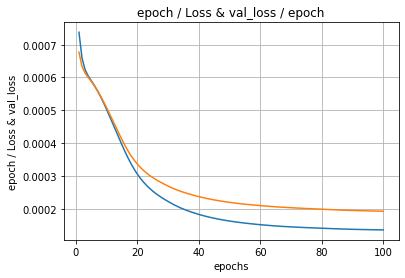

Train on 1472 samples, validate on 631 samples
Epoch 1/100
1472/1472 [==============================] - 0s 134us/step - loss: 0.2632 - accuracy: 0.0014 - val_loss: 0.2204 - val_accuracy: 0.0032
Epoch 2/100
1472/1472 [==============================] - 0s 91us/step - loss: 0.2170 - accuracy: 0.0014 - val_loss: 0.1699 - val_accuracy: 0.0032
Epoch 3/100
1472/1472 [==============================] - 0s 93us/step - loss: 0.1635 - accuracy: 0.0014 - val_loss: 0.1238 - val_accuracy: 0.0032
Epoch 4/100
1472/1472 [==============================] - 0s 94us/step - loss: 0.1184 - accuracy: 6.7935e-04 - val_loss: 0.0889 - val_accuracy: 0.0016
Epoch 5/100
1472/1472 [==============================] - 0s 94us/step - loss: 0.0856 - accuracy: 6.7935e-04 - val_loss: 0.0650 - val_accuracy: 0.0000e+00
Epoch 6/100
1472/1472 [==============================] - 0s 90us/step - loss: 0.0633 - accuracy: 6.7935e-04 - val_loss: 0.0490 - val_accuracy: 0.0000e+00
Epoch 7/100
1472/1472 [==============================] -

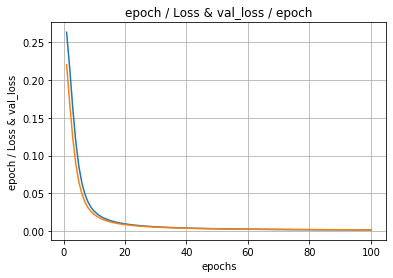

Train on 1472 samples, validate on 631 samples
Epoch 1/100
1472/1472 [==============================] - 0s 162us/step - loss: 0.1577 - accuracy: 0.0048 - val_loss: 0.0387 - val_accuracy: 0.0222
Epoch 2/100
1472/1472 [==============================] - 0s 107us/step - loss: 0.0246 - accuracy: 0.0279 - val_loss: 0.0071 - val_accuracy: 0.0333
Epoch 3/100
1472/1472 [==============================] - 0s 109us/step - loss: 0.0051 - accuracy: 0.0346 - val_loss: 0.0023 - val_accuracy: 0.0523
Epoch 4/100
1472/1472 [==============================] - 0s 107us/step - loss: 0.0018 - accuracy: 0.0408 - val_loss: 0.0013 - val_accuracy: 0.0460
Epoch 5/100
1472/1472 [==============================] - 0s 106us/step - loss: 9.9943e-04 - accuracy: 0.0408 - val_loss: 9.3525e-04 - val_accuracy: 0.0491
Epoch 6/100
1472/1472 [==============================] - 0s 106us/step - loss: 7.7487e-04 - accuracy: 0.0380 - val_loss: 8.1285e-04 - val_accuracy: 0.0475
Epoch 7/100
1472/1472 [==============================] 

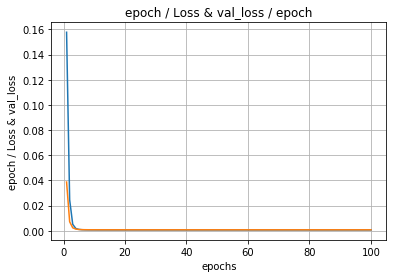

Train on 1472 samples, validate on 631 samples
Epoch 1/100
1472/1472 [==============================] - 0s 154us/step - loss: 7.2067e-04 - accuracy: 0.0292 - val_loss: 6.5841e-04 - val_accuracy: 0.0777
Epoch 2/100
1472/1472 [==============================] - 0s 105us/step - loss: 6.3510e-04 - accuracy: 0.0890 - val_loss: 6.1263e-04 - val_accuracy: 0.0840
Epoch 3/100
1472/1472 [==============================] - 0s 105us/step - loss: 5.9943e-04 - accuracy: 0.1019 - val_loss: 5.9118e-04 - val_accuracy: 0.1078
Epoch 4/100
1472/1472 [==============================] - 0s 103us/step - loss: 5.8068e-04 - accuracy: 0.1291 - val_loss: 5.7713e-04 - val_accuracy: 0.1268
Epoch 5/100
1472/1472 [==============================] - 0s 103us/step - loss: 5.6504e-04 - accuracy: 0.1556 - val_loss: 5.6276e-04 - val_accuracy: 0.1569
Epoch 6/100
1472/1472 [==============================] - 0s 104us/step - loss: 5.4770e-04 - accuracy: 0.1889 - val_loss: 5.4740e-04 - val_accuracy: 0.1838
Epoch 7/100
1472/1472 [

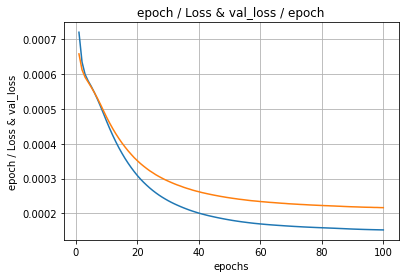

Train on 403 samples, validate on 174 samples
Epoch 1/100
403/403 [==============================] - 0s 267us/step - loss: 0.2445 - accuracy: 0.0000e+00 - val_loss: 0.1915 - val_accuracy: 0.0000e+00
Epoch 2/100
403/403 [==============================] - 0s 108us/step - loss: 0.2371 - accuracy: 0.0000e+00 - val_loss: 0.1829 - val_accuracy: 0.0000e+00
Epoch 3/100
403/403 [==============================] - 0s 103us/step - loss: 0.2258 - accuracy: 0.0000e+00 - val_loss: 0.1722 - val_accuracy: 0.0000e+00
Epoch 4/100
403/403 [==============================] - 0s 101us/step - loss: 0.2126 - accuracy: 0.0000e+00 - val_loss: 0.1601 - val_accuracy: 0.0000e+00
Epoch 5/100
403/403 [==============================] - 0s 103us/step - loss: 0.1978 - accuracy: 0.0000e+00 - val_loss: 0.1474 - val_accuracy: 0.0000e+00
Epoch 6/100
403/403 [==============================] - 0s 102us/step - loss: 0.1820 - accuracy: 0.0000e+00 - val_loss: 0.1347 - val_accuracy: 0.0000e+00
Epoch 7/100
403/403 [===============

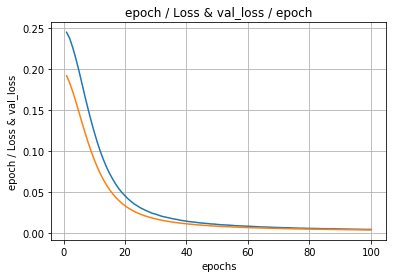

Train on 403 samples, validate on 174 samples
Epoch 1/100
403/403 [==============================] - 0s 324us/step - loss: 0.2329 - accuracy: 0.0000e+00 - val_loss: 0.1216 - val_accuracy: 0.0000e+00
Epoch 2/100
403/403 [==============================] - 0s 126us/step - loss: 0.1422 - accuracy: 0.0000e+00 - val_loss: 0.0709 - val_accuracy: 0.0057
Epoch 3/100
403/403 [==============================] - 0s 121us/step - loss: 0.0829 - accuracy: 0.0099 - val_loss: 0.0398 - val_accuracy: 0.0345
Epoch 4/100
403/403 [==============================] - 0s 118us/step - loss: 0.0463 - accuracy: 0.0323 - val_loss: 0.0218 - val_accuracy: 0.0460
Epoch 5/100
403/403 [==============================] - 0s 123us/step - loss: 0.0251 - accuracy: 0.0347 - val_loss: 0.0120 - val_accuracy: 0.0517
Epoch 6/100
403/403 [==============================] - 0s 119us/step - loss: 0.0138 - accuracy: 0.0397 - val_loss: 0.0069 - val_accuracy: 0.0345
Epoch 7/100
403/403 [==============================] - 0s 121us/step - l

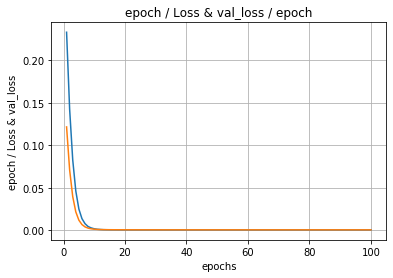

Train on 403 samples, validate on 174 samples
Epoch 1/100
403/403 [==============================] - 0s 306us/step - loss: 7.5781e-04 - accuracy: 0.0025 - val_loss: 7.0288e-04 - val_accuracy: 0.0575
Epoch 2/100
403/403 [==============================] - 0s 121us/step - loss: 6.9210e-04 - accuracy: 0.0918 - val_loss: 6.4623e-04 - val_accuracy: 0.1322
Epoch 3/100
403/403 [==============================] - 0s 120us/step - loss: 6.3723e-04 - accuracy: 0.1588 - val_loss: 6.0290e-04 - val_accuracy: 0.2126
Epoch 4/100
403/403 [==============================] - 0s 118us/step - loss: 5.9526e-04 - accuracy: 0.2109 - val_loss: 5.6904e-04 - val_accuracy: 0.2414
Epoch 5/100
403/403 [==============================] - 0s 123us/step - loss: 5.6254e-04 - accuracy: 0.2333 - val_loss: 5.4135e-04 - val_accuracy: 0.2644
Epoch 6/100
403/403 [==============================] - 0s 126us/step - loss: 5.3582e-04 - accuracy: 0.2481 - val_loss: 5.1843e-04 - val_accuracy: 0.2701
Epoch 7/100
403/403 [===============

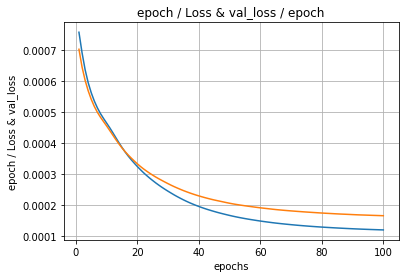

Classification algorithms: random_forest, Cluster Number: 0, Encoding Algorithm: basic_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'entropy', 'n_estimators': 100}




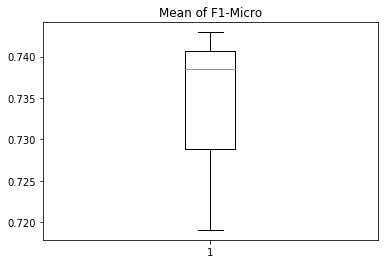

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 1ms/step - loss: 0.1337 - categorical_accuracy: 0.0000e+00
Epoch 2/100
323/323 [==============================] - 0s 239us/step - loss: 0.0934 - categorical_accuracy: 0.0991
Epoch 3/100
323/323 [==============================] - 0s 233us/step - loss: 0.0835 - categorical_accuracy: 0.0000e+00
Epoch 4/100
323/323 [==============================] - 0s 251us/step - loss: 0.0796 - categorical_accuracy: 0.2848
Epoch 5/100
323/323 [==============================] - 0s 236us/step - loss: 0.0784 - categorical_accuracy: 0.0836
Epoch 6/100
323/323 [==============================] - 0s 233us/step - loss: 0.0789 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 233us/step - loss: 0.0779 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 246us/step - loss: 0.0784 - categorical_accuracy: 0.3808
Epoch 9/100
323/323 [==============================] - 0s 232us/st

<Figure size 432x288 with 0 Axes>

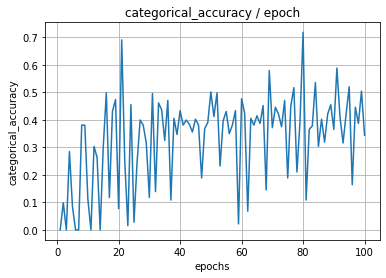

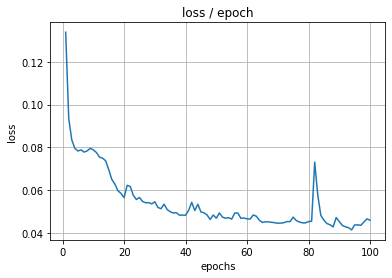

Classification algorithms: random_forest, Cluster Number: 0, Encoding Algorithm: relational_sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




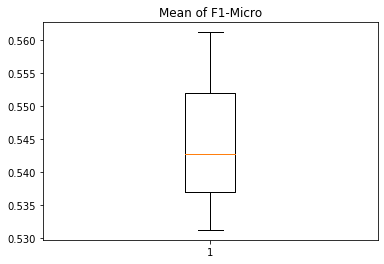

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 751us/step - loss: 0.1405 - categorical_accuracy: 0.0000e+00
Epoch 2/100
323/323 [==============================] - 0s 229us/step - loss: 0.1353 - categorical_accuracy: 0.0000e+00
Epoch 3/100
323/323 [==============================] - 0s 221us/step - loss: 0.0978 - categorical_accuracy: 0.1858
Epoch 4/100
323/323 [==============================] - 0s 218us/step - loss: 0.0966 - categorical_accuracy: 0.0991
Epoch 5/100
323/323 [==============================] - 0s 216us/step - loss: 0.0804 - categorical_accuracy: 0.2508
Epoch 6/100
323/323 [==============================] - 0s 213us/step - loss: 0.0808 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 214us/step - loss: 0.0789 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 218us/step - loss: 0.0775 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================] - 0s 21

<Figure size 432x288 with 0 Axes>

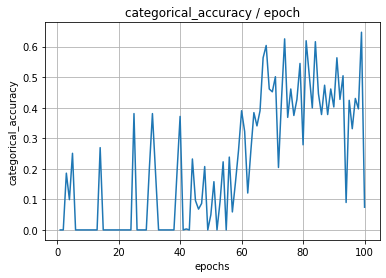

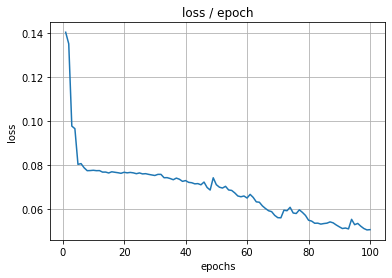

Classification algorithms: random_forest, Cluster Number: 0, Encoding Algorithm: sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'entropy', 'n_estimators': 100}




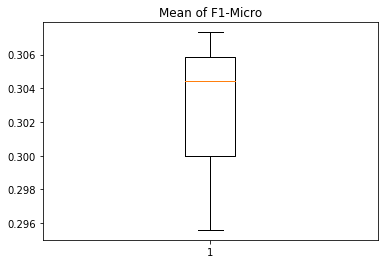

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 723us/step - loss: 0.1409 - categorical_accuracy: 0.0000e+00
Epoch 2/100
323/323 [==============================] - 0s 229us/step - loss: 0.1407 - categorical_accuracy: 0.2632
Epoch 3/100
323/323 [==============================] - 0s 225us/step - loss: 0.1404 - categorical_accuracy: 0.3808
Epoch 4/100
323/323 [==============================] - 0s 218us/step - loss: 0.1402 - categorical_accuracy: 0.0000e+00
Epoch 5/100
323/323 [==============================] - 0s 223us/step - loss: 0.1400 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 228us/step - loss: 0.1398 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 221us/step - loss: 0.1396 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 223us/step - loss: 0.1393 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================] - 0

<Figure size 432x288 with 0 Axes>

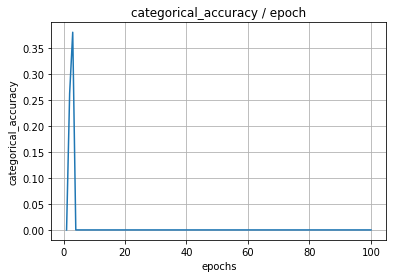

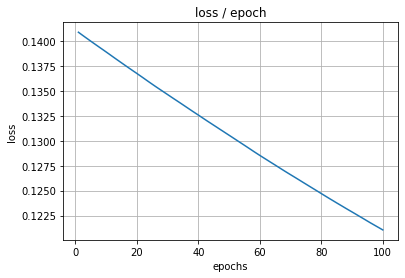

Classification algorithms: random_forest, Cluster Number: 1, Encoding Algorithm: basic_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




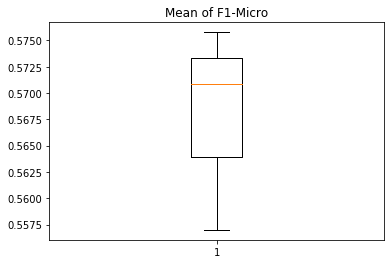

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 486us/step - loss: 0.1285 - categorical_accuracy: 0.6617
Epoch 2/100
801/801 [==============================] - 0s 221us/step - loss: 0.1059 - categorical_accuracy: 0.2197
Epoch 3/100
801/801 [==============================] - 0s 213us/step - loss: 0.0944 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 206us/step - loss: 0.0977 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 216us/step - loss: 0.0962 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 219us/step - loss: 0.0929 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 215us/step - loss: 0.0922 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 211us/step - loss: 0.0918 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 215us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

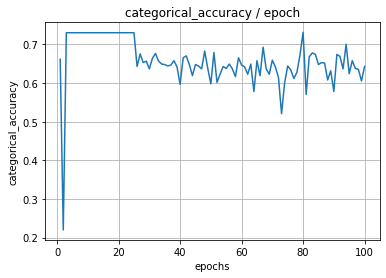

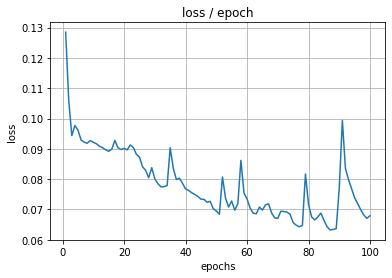

Classification algorithms: random_forest, Cluster Number: 1, Encoding Algorithm: relational_sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




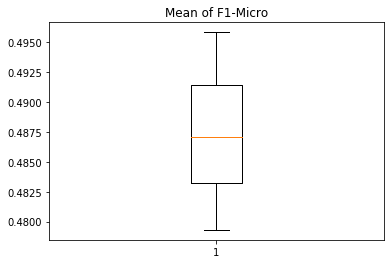

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 460us/step - loss: 0.1406 - categorical_accuracy: 0.6592
Epoch 2/100
801/801 [==============================] - 0s 213us/step - loss: 0.1032 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 217us/step - loss: 0.0954 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 222us/step - loss: 0.0948 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 213us/step - loss: 0.0935 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 212us/step - loss: 0.0934 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 211us/step - loss: 0.0942 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 211us/step - loss: 0.0959 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 211us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

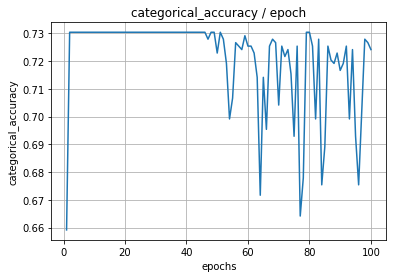

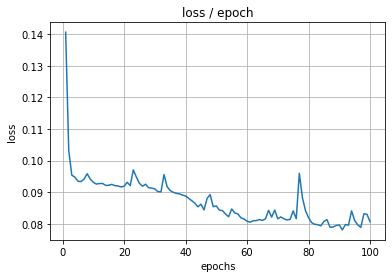

Classification algorithms: random_forest, Cluster Number: 1, Encoding Algorithm: sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




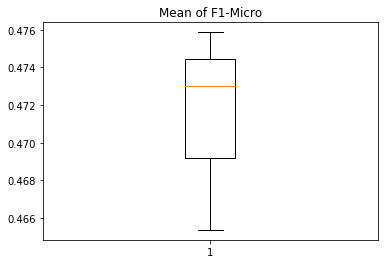

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 456us/step - loss: 0.1454 - categorical_accuracy: 0.2834
Epoch 2/100
801/801 [==============================] - 0s 215us/step - loss: 0.1450 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 224us/step - loss: 0.1446 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 212us/step - loss: 0.1442 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 210us/step - loss: 0.1438 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 210us/step - loss: 0.1434 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 209us/step - loss: 0.1430 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 207us/step - loss: 0.1426 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 211us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

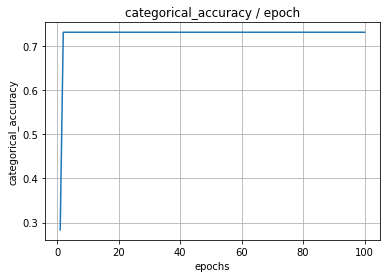

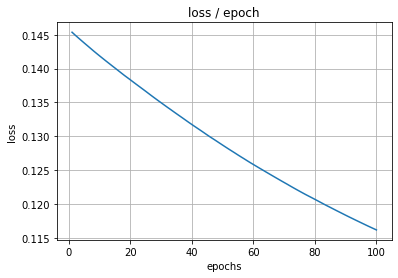

Classification algorithms: random_forest, Cluster Number: 2, Encoding Algorithm: basic_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




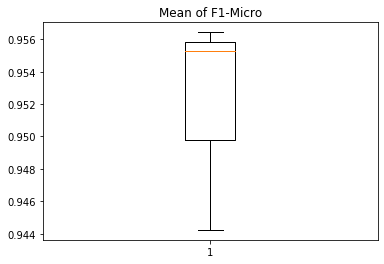

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1751 - categorical_accuracy: 0.0192
Epoch 2/100
156/156 [==============================] - 0s 218us/step - loss: 0.1471 - categorical_accuracy: 0.0000e+00
Epoch 3/100
156/156 [==============================] - 0s 231us/step - loss: 0.0718 - categorical_accuracy: 0.0000e+00
Epoch 4/100
156/156 [==============================] - 0s 233us/step - loss: 0.0677 - categorical_accuracy: 0.4679
Epoch 5/100
156/156 [==============================] - 0s 209us/step - loss: 0.0644 - categorical_accuracy: 0.0000e+00
Epoch 6/100
156/156 [==============================] - 0s 212us/step - loss: 0.0666 - categorical_accuracy: 0.4679
Epoch 7/100
156/156 [==============================] - 0s 208us/step - loss: 0.0655 - categorical_accuracy: 0.0000e+00
Epoch 8/100
156/156 [==============================] - 0s 204us/step - loss: 0.0601 - categorical_accuracy: 0.4679
Epoch 9/100
156/156 [==============================] - 0s 229us/st

<Figure size 432x288 with 0 Axes>

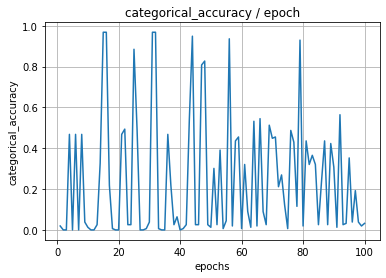

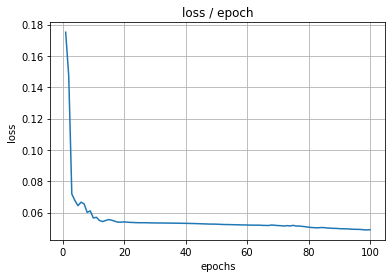

Classification algorithms: random_forest, Cluster Number: 2, Encoding Algorithm: relational_sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'entropy', 'n_estimators': 100}




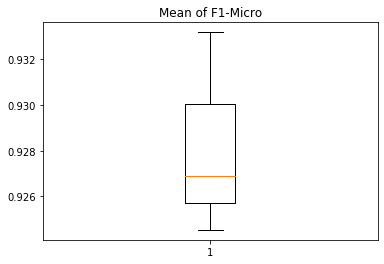

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1769 - categorical_accuracy: 0.0000e+00
Epoch 2/100
156/156 [==============================] - 0s 200us/step - loss: 0.1756 - categorical_accuracy: 0.0256
Epoch 3/100
156/156 [==============================] - 0s 201us/step - loss: 0.1726 - categorical_accuracy: 0.0256
Epoch 4/100
156/156 [==============================] - 0s 205us/step - loss: 0.1646 - categorical_accuracy: 0.0256
Epoch 5/100
156/156 [==============================] - 0s 223us/step - loss: 0.1426 - categorical_accuracy: 0.0256
Epoch 6/100
156/156 [==============================] - 0s 217us/step - loss: 0.0925 - categorical_accuracy: 0.0256
Epoch 7/100
156/156 [==============================] - 0s 216us/step - loss: 0.0657 - categorical_accuracy: 0.0256
Epoch 8/100
156/156 [==============================] - 0s 236us/step - loss: 0.0620 - categorical_accuracy: 0.4744
Epoch 9/100
156/156 [==============================] - 0s 210us/step - loss: 0

<Figure size 432x288 with 0 Axes>

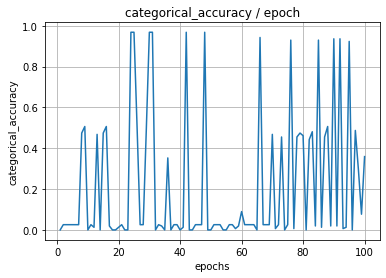

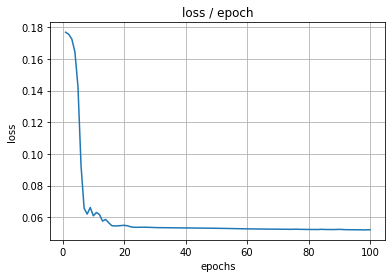

Classification algorithms: random_forest, Cluster Number: 2, Encoding Algorithm: sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




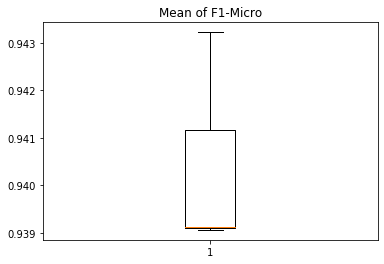

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1771 - categorical_accuracy: 0.4679
Epoch 2/100
156/156 [==============================] - 0s 214us/step - loss: 0.1770 - categorical_accuracy: 0.0256
Epoch 3/100
156/156 [==============================] - 0s 211us/step - loss: 0.1768 - categorical_accuracy: 0.0256
Epoch 4/100
156/156 [==============================] - 0s 209us/step - loss: 0.1767 - categorical_accuracy: 0.0256
Epoch 5/100
156/156 [==============================] - 0s 208us/step - loss: 0.1765 - categorical_accuracy: 0.0256
Epoch 6/100
156/156 [==============================] - 0s 219us/step - loss: 0.1764 - categorical_accuracy: 0.0256
Epoch 7/100
156/156 [==============================] - 0s 219us/step - loss: 0.1763 - categorical_accuracy: 0.0256
Epoch 8/100
156/156 [==============================] - 0s 206us/step - loss: 0.1761 - categorical_accuracy: 0.0256
Epoch 9/100
156/156 [==============================] - 0s 209us/step - loss: 0.176

<Figure size 432x288 with 0 Axes>

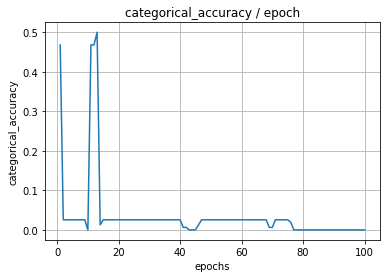

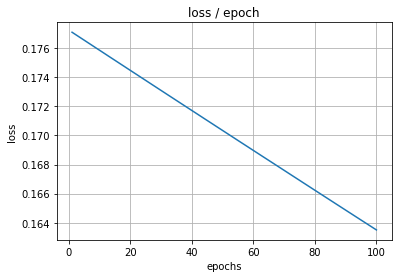

Classification algorithms: random_forest, Cluster Number: 3, Encoding Algorithm: basic_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




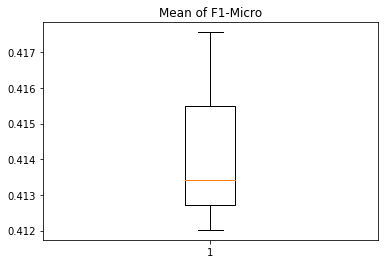

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 462us/step - loss: 0.1472 - categorical_accuracy: 0.0025
Epoch 2/100
801/801 [==============================] - 0s 217us/step - loss: 0.1298 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 218us/step - loss: 0.1263 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 209us/step - loss: 0.1255 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 211us/step - loss: 0.1247 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 213us/step - loss: 0.1252 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 212us/step - loss: 0.1246 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 210us/step - loss: 0.1242 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 207us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

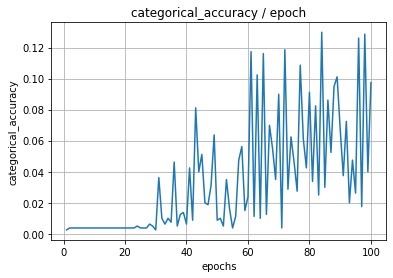

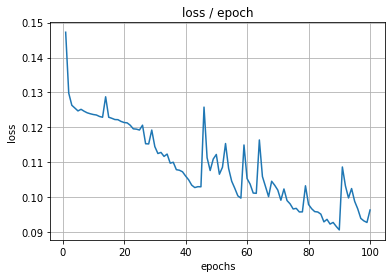

Classification algorithms: random_forest, Cluster Number: 3, Encoding Algorithm: relational_sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




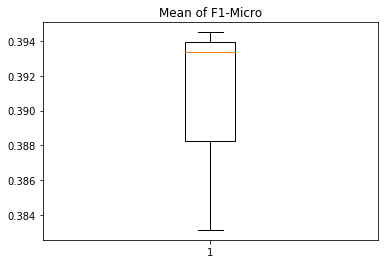

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 438us/step - loss: 0.1685 - categorical_accuracy: 0.0050
Epoch 2/100
801/801 [==============================] - 0s 217us/step - loss: 0.1361 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 225us/step - loss: 0.1271 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 223us/step - loss: 0.1252 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 222us/step - loss: 0.1250 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 218us/step - loss: 0.1248 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 211us/step - loss: 0.1251 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 213us/step - loss: 0.1249 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 210us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

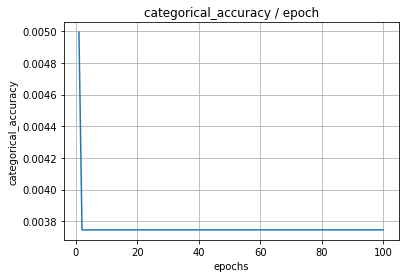

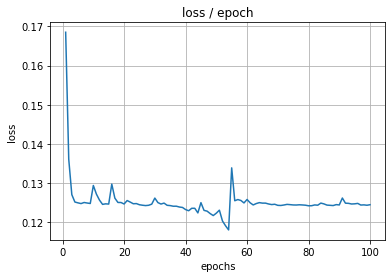

Classification algorithms: random_forest, Cluster Number: 3, Encoding Algorithm: sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




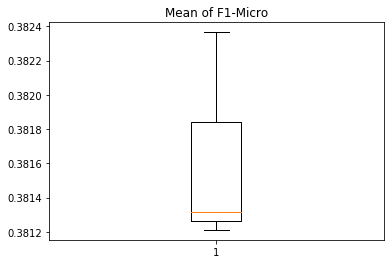

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 409us/step - loss: 0.1712 - categorical_accuracy: 0.0225
Epoch 2/100
801/801 [==============================] - 0s 211us/step - loss: 0.1708 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 223us/step - loss: 0.1704 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 211us/step - loss: 0.1699 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 227us/step - loss: 0.1695 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 217us/step - loss: 0.1691 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 219us/step - loss: 0.1687 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 212us/step - loss: 0.1684 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 220us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

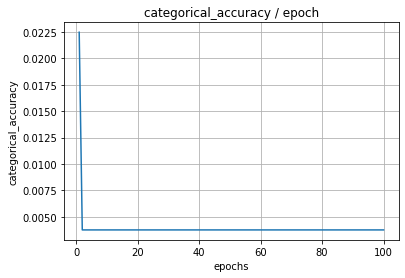

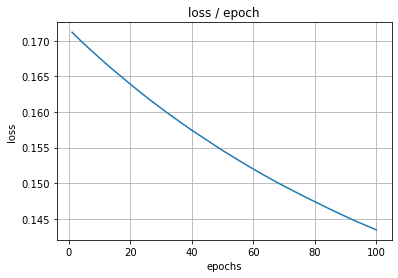

Classification algorithms: random_forest, Cluster Number: 4, Encoding Algorithm: basic_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




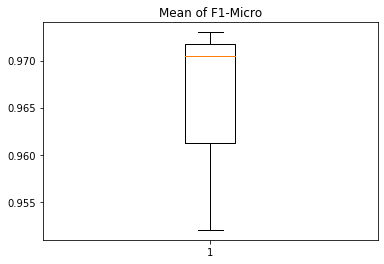

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 284us/step - loss: 0.1527 - categorical_accuracy: 0.9508
Epoch 3/100
61/61 [==============================] - 0s 261us/step - loss: 0.1492 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 273us/step - loss: 0.1402 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 267us/step - loss: 0.1195 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 259us/step - loss: 0.0825 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 268us/step - loss: 0.0787 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 258us/step - loss: 0.0776 - categorical_accuracy: 0.0000e+00
Epoch 9/100
61/61 [==============================] - 0s 246us/step - loss: 0.0638 - catego

<Figure size 432x288 with 0 Axes>

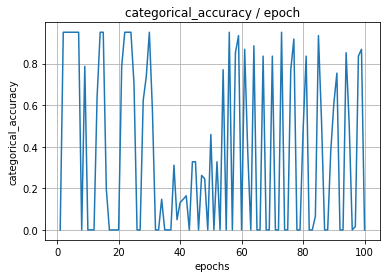

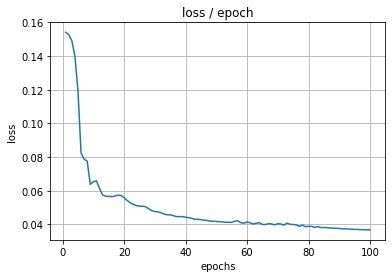

Classification algorithms: random_forest, Cluster Number: 4, Encoding Algorithm: relational_sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'entropy', 'n_estimators': 100}




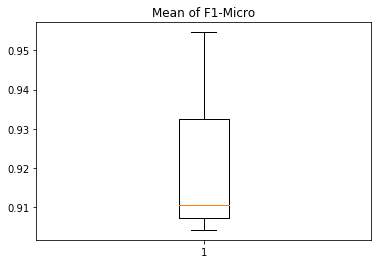

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 268us/step - loss: 0.1538 - categorical_accuracy: 0.9508
Epoch 3/100
61/61 [==============================] - 0s 256us/step - loss: 0.1533 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 248us/step - loss: 0.1526 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 258us/step - loss: 0.1514 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 250us/step - loss: 0.1496 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 260us/step - loss: 0.1466 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 259us/step - loss: 0.1415 - categorical_accuracy: 0.9508
Epoch 9/100
61/61 [==============================] - 0s 266us/step - loss: 0.1330 - categorica

<Figure size 432x288 with 0 Axes>

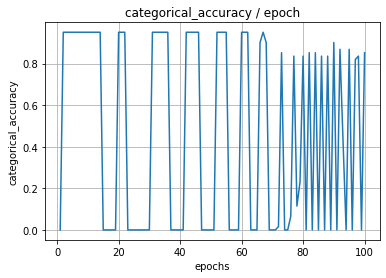

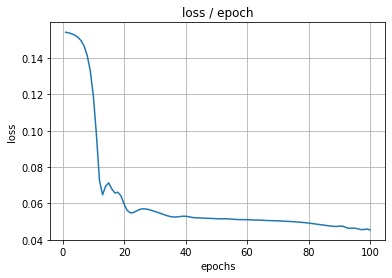

Classification algorithms: random_forest, Cluster Number: 4, Encoding Algorithm: sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




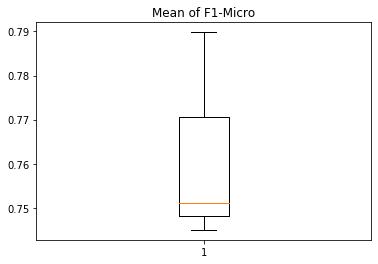

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 313us/step - loss: 0.1542 - categorical_accuracy: 0.9508
Epoch 3/100
61/61 [==============================] - 0s 268us/step - loss: 0.1541 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 248us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 246us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 250us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 259us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 289us/step - loss: 0.1538 - categorical_accuracy: 0.9508
Epoch 9/100
61/61 [==============================] - 0s 267us/step - loss: 0.1538 - categorica

<Figure size 432x288 with 0 Axes>

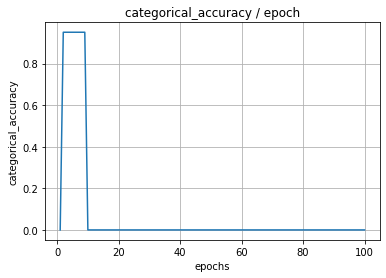

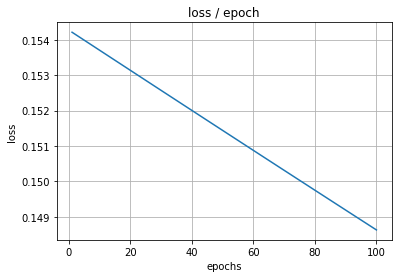

Classification algorithms: random_forest, Cluster Number: 5, Encoding Algorithm: basic_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




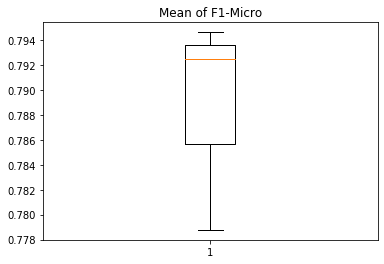

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 787us/step - loss: 0.1493 - categorical_accuracy: 0.1818
Epoch 2/100
319/319 [==============================] - 0s 209us/step - loss: 0.0983 - categorical_accuracy: 0.1787
Epoch 3/100
319/319 [==============================] - 0s 202us/step - loss: 0.0898 - categorical_accuracy: 0.0000e+00
Epoch 4/100
319/319 [==============================] - 0s 215us/step - loss: 0.0844 - categorical_accuracy: 0.3354
Epoch 5/100
319/319 [==============================] - 0s 216us/step - loss: 0.0826 - categorical_accuracy: 0.0000e+00
Epoch 6/100
319/319 [==============================] - 0s 201us/step - loss: 0.0815 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 209us/step - loss: 0.0804 - categorical_accuracy: 0.4232
Epoch 8/100
319/319 [==============================] - 0s 217us/step - loss: 0.0800 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================] - 0s 206us/

<Figure size 432x288 with 0 Axes>

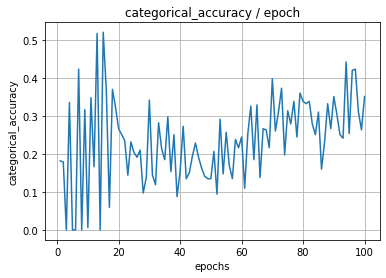

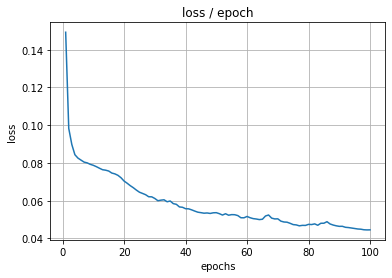

Classification algorithms: random_forest, Cluster Number: 5, Encoding Algorithm: relational_sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'entropy', 'n_estimators': 100}




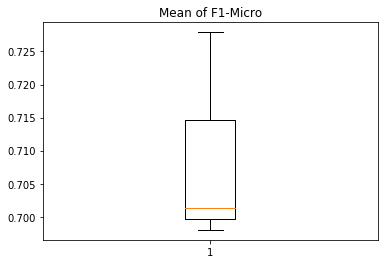

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 707us/step - loss: 0.1639 - categorical_accuracy: 0.5078
Epoch 2/100
319/319 [==============================] - 0s 205us/step - loss: 0.1581 - categorical_accuracy: 0.6928
Epoch 3/100
319/319 [==============================] - 0s 207us/step - loss: 0.1213 - categorical_accuracy: 0.6928
Epoch 4/100
319/319 [==============================] - 0s 202us/step - loss: 0.0999 - categorical_accuracy: 0.3574
Epoch 5/100
319/319 [==============================] - 0s 199us/step - loss: 0.0882 - categorical_accuracy: 0.0000e+00
Epoch 6/100
319/319 [==============================] - 0s 200us/step - loss: 0.0908 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 199us/step - loss: 0.0836 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 202us/step - loss: 0.0830 - categorical_accuracy: 0.5737
Epoch 9/100
319/319 [==============================] - 0s 203us/step

<Figure size 432x288 with 0 Axes>

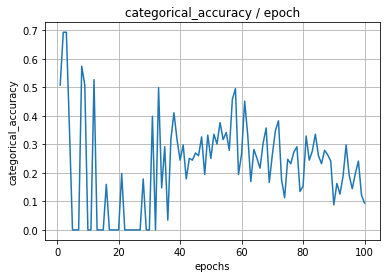

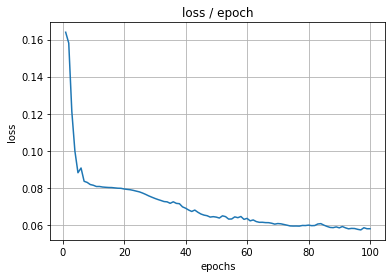

Classification algorithms: random_forest, Cluster Number: 5, Encoding Algorithm: sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'entropy', 'n_estimators': 100}




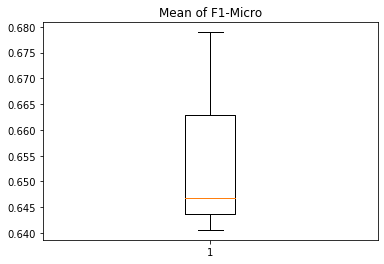

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 738us/step - loss: 0.1645 - categorical_accuracy: 0.3574
Epoch 2/100
319/319 [==============================] - 0s 201us/step - loss: 0.1643 - categorical_accuracy: 0.6928
Epoch 3/100
319/319 [==============================] - 0s 201us/step - loss: 0.1641 - categorical_accuracy: 0.6928
Epoch 4/100
319/319 [==============================] - 0s 202us/step - loss: 0.1639 - categorical_accuracy: 0.6928
Epoch 5/100
319/319 [==============================] - 0s 201us/step - loss: 0.1637 - categorical_accuracy: 0.6928
Epoch 6/100
319/319 [==============================] - 0s 198us/step - loss: 0.1634 - categorical_accuracy: 0.6928
Epoch 7/100
319/319 [==============================] - 0s 198us/step - loss: 0.1632 - categorical_accuracy: 0.6928
Epoch 8/100
319/319 [==============================] - 0s 200us/step - loss: 0.1630 - categorical_accuracy: 0.6928
Epoch 9/100
319/319 [==============================] - 0s 198us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

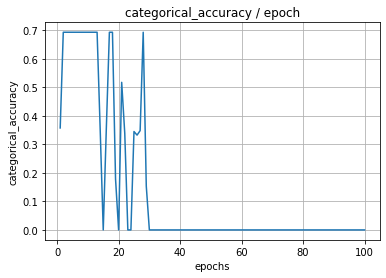

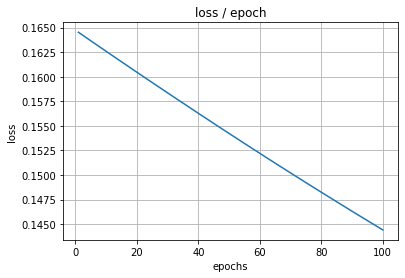

Classification algorithms: random_forest, Cluster Number: 6, Encoding Algorithm: basic_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'entropy', 'n_estimators': 100}




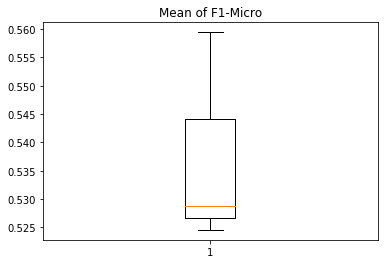

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 708us/step - loss: 0.1426 - categorical_accuracy: 0.0000e+00
Epoch 2/100
420/420 [==============================] - 0s 240us/step - loss: 0.1143 - categorical_accuracy: 0.2476
Epoch 3/100
420/420 [==============================] - 0s 240us/step - loss: 0.1071 - categorical_accuracy: 0.0571
Epoch 4/100
420/420 [==============================] - 0s 227us/step - loss: 0.1052 - categorical_accuracy: 0.1238
Epoch 5/100
420/420 [==============================] - 0s 227us/step - loss: 0.1028 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 226us/step - loss: 0.1008 - categorical_accuracy: 0.0810
Epoch 7/100
420/420 [==============================] - 0s 226us/step - loss: 0.0971 - categorical_accuracy: 0.0190
Epoch 8/100
420/420 [==============================] - 0s 225us/step - loss: 0.0950 - categorical_accuracy: 0.1429
Epoch 9/100
420/420 [==============================] - 0s 225us/step - l

<Figure size 432x288 with 0 Axes>

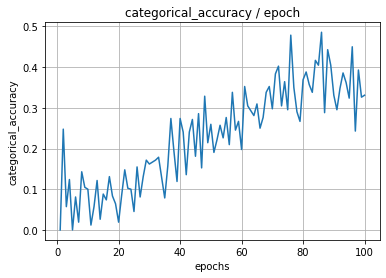

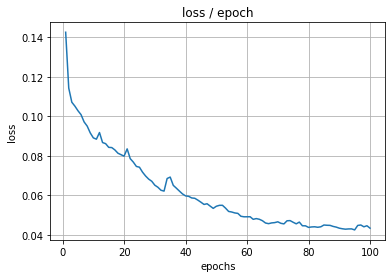

Classification algorithms: random_forest, Cluster Number: 6, Encoding Algorithm: relational_sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




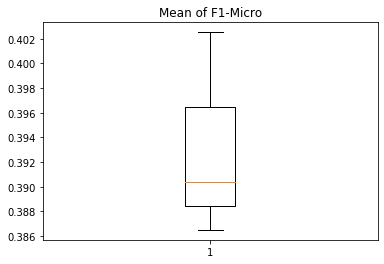

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 690us/step - loss: 0.1521 - categorical_accuracy: 0.0024
Epoch 2/100
420/420 [==============================] - 0s 233us/step - loss: 0.1426 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 232us/step - loss: 0.1136 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 226us/step - loss: 0.1094 - categorical_accuracy: 0.1905
Epoch 5/100
420/420 [==============================] - 0s 227us/step - loss: 0.1071 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 222us/step - loss: 0.1057 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 220us/step - loss: 0.1063 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 220us/step - loss: 0.1062 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [==============================] - 0

<Figure size 432x288 with 0 Axes>

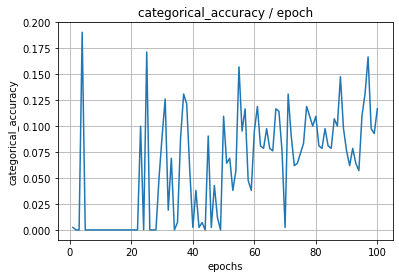

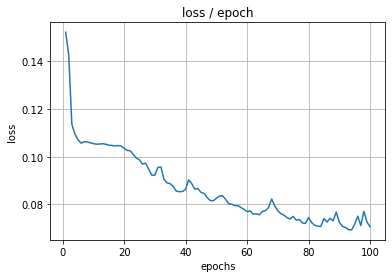

Classification algorithms: random_forest, Cluster Number: 6, Encoding Algorithm: sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'entropy', 'n_estimators': 100}




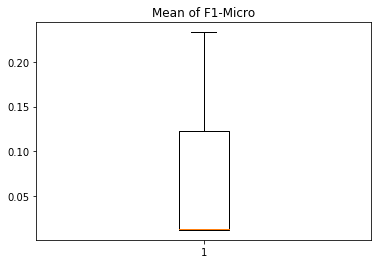

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 603us/step - loss: 0.1526 - categorical_accuracy: 0.0500
Epoch 2/100
420/420 [==============================] - 0s 219us/step - loss: 0.1524 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 217us/step - loss: 0.1522 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 220us/step - loss: 0.1519 - categorical_accuracy: 0.0548
Epoch 5/100
420/420 [==============================] - 0s 218us/step - loss: 0.1517 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 218us/step - loss: 0.1515 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 218us/step - loss: 0.1512 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 224us/step - loss: 0.1510 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [==============================] - 0

<Figure size 432x288 with 0 Axes>

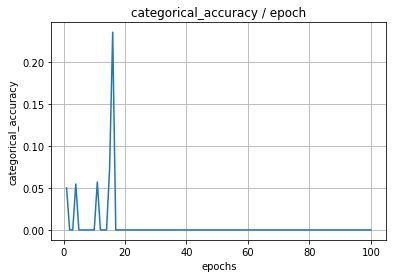

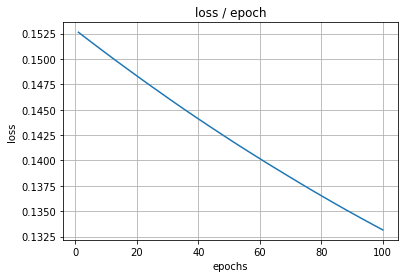

Classification algorithms: random_forest, Cluster Number: 7, Encoding Algorithm: basic_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




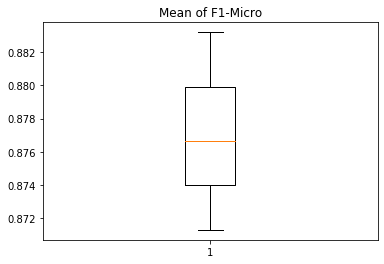

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1672 - categorical_accuracy: 0.2696
Epoch 2/100
115/115 [==============================] - 0s 274us/step - loss: 0.1572 - categorical_accuracy: 0.6087
Epoch 3/100
115/115 [==============================] - 0s 257us/step - loss: 0.1151 - categorical_accuracy: 0.6087
Epoch 4/100
115/115 [==============================] - 0s 256us/step - loss: 0.0980 - categorical_accuracy: 0.0000e+00
Epoch 5/100
115/115 [==============================] - 0s 262us/step - loss: 0.0864 - categorical_accuracy: 0.0000e+00
Epoch 6/100
115/115 [==============================] - 0s 255us/step - loss: 0.0881 - categorical_accuracy: 0.0000e+00
Epoch 7/100
115/115 [==============================] - 0s 258us/step - loss: 0.0828 - categorical_accuracy: 0.6087
Epoch 8/100
115/115 [==============================] - 0s 271us/step - loss: 0.0793 - categorical_accuracy: 0.4522
Epoch 9/100
115/115 [==============================] - 0s 266us/step -

<Figure size 432x288 with 0 Axes>

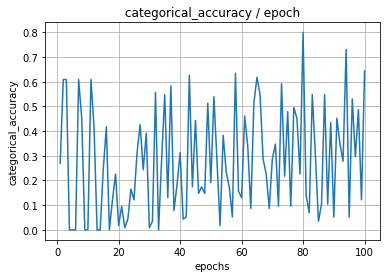

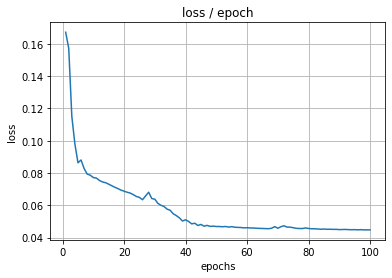

Classification algorithms: random_forest, Cluster Number: 7, Encoding Algorithm: relational_sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'gini', 'n_estimators': 100}




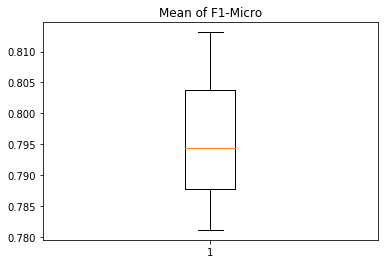

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1676 - categorical_accuracy: 0.1652
Epoch 2/100
115/115 [==============================] - 0s 301us/step - loss: 0.1666 - categorical_accuracy: 0.0000e+00
Epoch 3/100
115/115 [==============================] - 0s 280us/step - loss: 0.1641 - categorical_accuracy: 0.0000e+00
Epoch 4/100
115/115 [==============================] - 0s 287us/step - loss: 0.1571 - categorical_accuracy: 0.0000e+00
Epoch 5/100
115/115 [==============================] - 0s 295us/step - loss: 0.1371 - categorical_accuracy: 0.0000e+00
Epoch 6/100
115/115 [==============================] - 0s 291us/step - loss: 0.1011 - categorical_accuracy: 0.0000e+00
Epoch 7/100
115/115 [==============================] - 0s 283us/step - loss: 0.0963 - categorical_accuracy: 0.0000e+00
Epoch 8/100
115/115 [==============================] - 0s 286us/step - loss: 0.0886 - categorical_accuracy: 0.0000e+00
Epoch 9/100
115/115 [==============================] -

<Figure size 432x288 with 0 Axes>

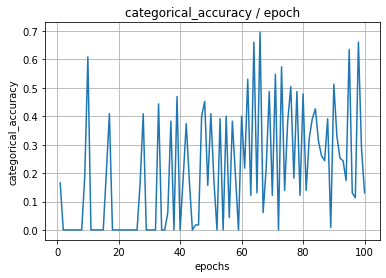

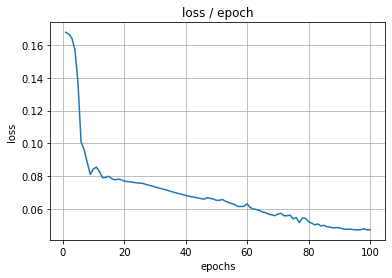

Classification algorithms: random_forest, Cluster Number: 7, Encoding Algorithm: sparse_AE
random_forest classification algorithm and parameter tuning based on 5-fold cross validation
random_forest Classifier best score for training data:
Best parameters for random_forest Classifier algorithms are: {'criterion': 'entropy', 'n_estimators': 100}




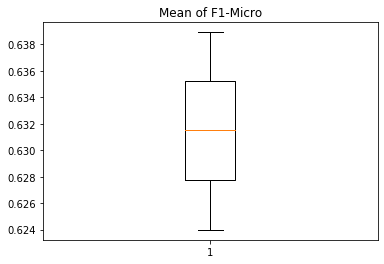

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1677 - categorical_accuracy: 0.1652
Epoch 2/100
115/115 [==============================] - 0s 266us/step - loss: 0.1676 - categorical_accuracy: 0.6087
Epoch 3/100
115/115 [==============================] - 0s 259us/step - loss: 0.1675 - categorical_accuracy: 0.6087
Epoch 4/100
115/115 [==============================] - 0s 267us/step - loss: 0.1674 - categorical_accuracy: 0.6087
Epoch 5/100
115/115 [==============================] - 0s 259us/step - loss: 0.1673 - categorical_accuracy: 0.6087
Epoch 6/100
115/115 [==============================] - 0s 273us/step - loss: 0.1671 - categorical_accuracy: 0.6087
Epoch 7/100
115/115 [==============================] - 0s 272us/step - loss: 0.1670 - categorical_accuracy: 0.6087
Epoch 8/100
115/115 [==============================] - 0s 263us/step - loss: 0.1669 - categorical_accuracy: 0.6087
Epoch 9/100
115/115 [==============================] - 0s 266us/step - loss: 0.166

<Figure size 432x288 with 0 Axes>

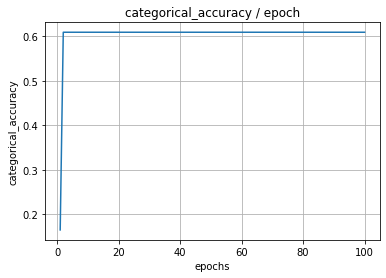

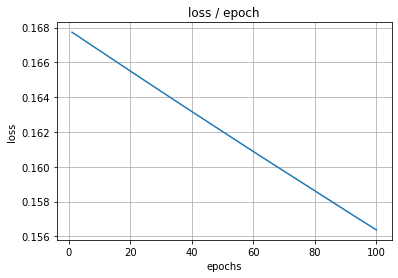

Classification algorithms: decision_tree, Cluster Number: 0, Encoding Algorithm: basic_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'best'}




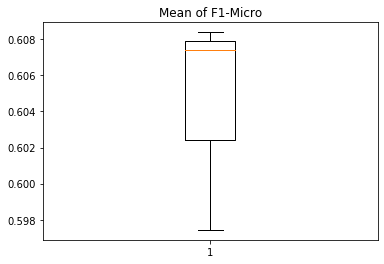

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 804us/step - loss: 0.1383 - categorical_accuracy: 0.0836
Epoch 2/100
323/323 [==============================] - 0s 268us/step - loss: 0.0942 - categorical_accuracy: 0.0805
Epoch 3/100
323/323 [==============================] - 0s 255us/step - loss: 0.0826 - categorical_accuracy: 0.2817
Epoch 4/100
323/323 [==============================] - 0s 248us/step - loss: 0.0811 - categorical_accuracy: 0.1022
Epoch 5/100
323/323 [==============================] - 0s 270us/step - loss: 0.0781 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 248us/step - loss: 0.0778 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 234us/step - loss: 0.0772 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 247us/step - loss: 0.0769 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================] - 0s 245us/

<Figure size 432x288 with 0 Axes>

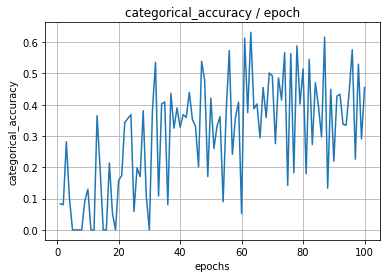

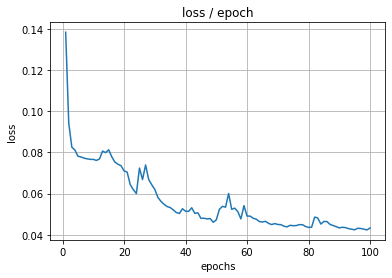

Classification algorithms: decision_tree, Cluster Number: 0, Encoding Algorithm: relational_sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'gini', 'splitter': 'random'}




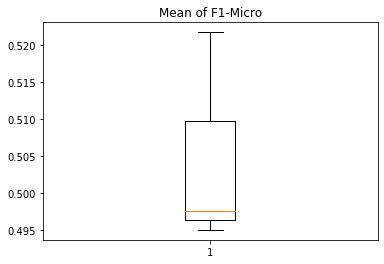

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 782us/step - loss: 0.1404 - categorical_accuracy: 0.1084
Epoch 2/100
323/323 [==============================] - 0s 231us/step - loss: 0.1330 - categorical_accuracy: 0.0000e+00
Epoch 3/100
323/323 [==============================] - 0s 228us/step - loss: 0.0929 - categorical_accuracy: 0.0000e+00
Epoch 4/100
323/323 [==============================] - 0s 231us/step - loss: 0.0837 - categorical_accuracy: 0.0000e+00
Epoch 5/100
323/323 [==============================] - 0s 223us/step - loss: 0.0813 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 222us/step - loss: 0.0786 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 227us/step - loss: 0.0783 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 231us/step - loss: 0.0780 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================]

<Figure size 432x288 with 0 Axes>

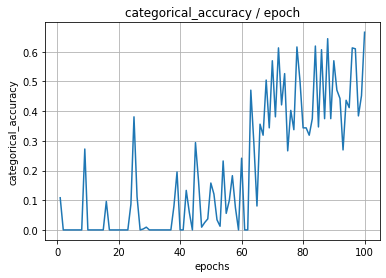

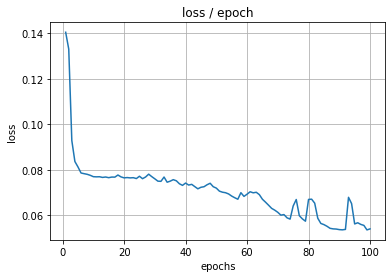

Classification algorithms: decision_tree, Cluster Number: 0, Encoding Algorithm: sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'gini', 'splitter': 'random'}




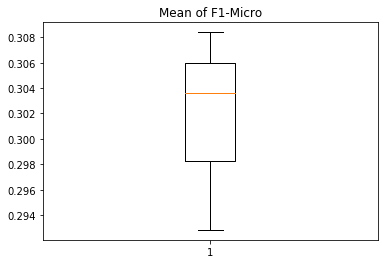

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 732us/step - loss: 0.1409 - categorical_accuracy: 0.1115
Epoch 2/100
323/323 [==============================] - 0s 233us/step - loss: 0.1406 - categorical_accuracy: 0.3808
Epoch 3/100
323/323 [==============================] - 0s 231us/step - loss: 0.1404 - categorical_accuracy: 0.1889
Epoch 4/100
323/323 [==============================] - 0s 227us/step - loss: 0.1402 - categorical_accuracy: 0.2848
Epoch 5/100
323/323 [==============================] - 0s 232us/step - loss: 0.1400 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 231us/step - loss: 0.1398 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 236us/step - loss: 0.1395 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 232us/step - loss: 0.1393 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================] - 0s 234us/

<Figure size 432x288 with 0 Axes>

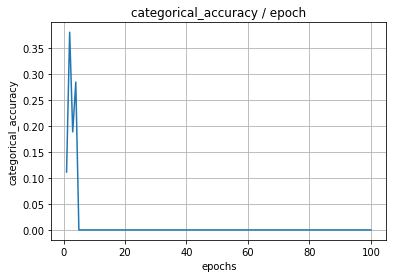

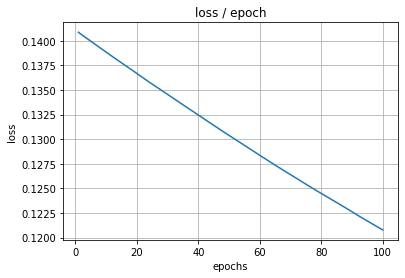

Classification algorithms: decision_tree, Cluster Number: 1, Encoding Algorithm: basic_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'best'}




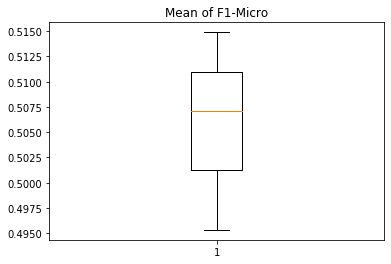

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 444us/step - loss: 0.1264 - categorical_accuracy: 0.6642
Epoch 2/100
801/801 [==============================] - 0s 217us/step - loss: 0.1004 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 221us/step - loss: 0.0943 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 218us/step - loss: 0.0921 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 214us/step - loss: 0.0922 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 213us/step - loss: 0.0920 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 216us/step - loss: 0.0909 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 215us/step - loss: 0.0912 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 214us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

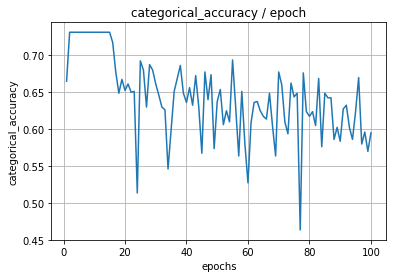

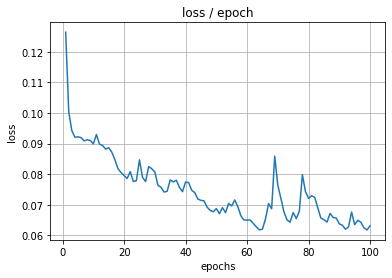

Classification algorithms: decision_tree, Cluster Number: 1, Encoding Algorithm: relational_sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'best'}




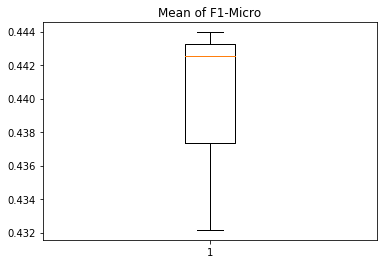

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 426us/step - loss: 0.1417 - categorical_accuracy: 0.6617
Epoch 2/100
801/801 [==============================] - 0s 214us/step - loss: 0.1023 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 214us/step - loss: 0.0953 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 217us/step - loss: 0.0931 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 209us/step - loss: 0.0931 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 214us/step - loss: 0.0929 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 213us/step - loss: 0.0928 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 215us/step - loss: 0.0928 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 214us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

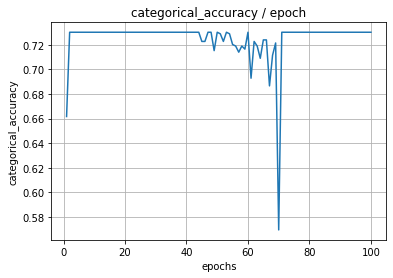

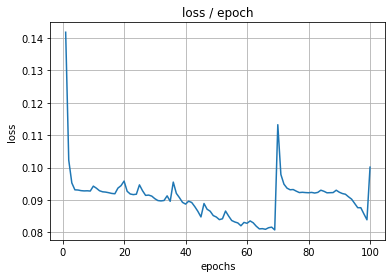

Classification algorithms: decision_tree, Cluster Number: 1, Encoding Algorithm: sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'gini', 'splitter': 'random'}




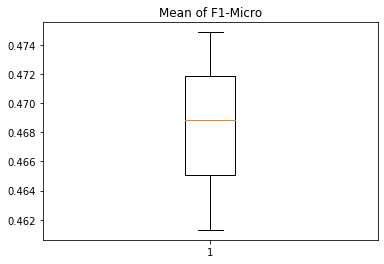

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 429us/step - loss: 0.1454 - categorical_accuracy: 0.4345
Epoch 2/100
801/801 [==============================] - 0s 212us/step - loss: 0.1450 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 206us/step - loss: 0.1446 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 211us/step - loss: 0.1442 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 210us/step - loss: 0.1438 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 209us/step - loss: 0.1434 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 220us/step - loss: 0.1430 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 215us/step - loss: 0.1426 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 210us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

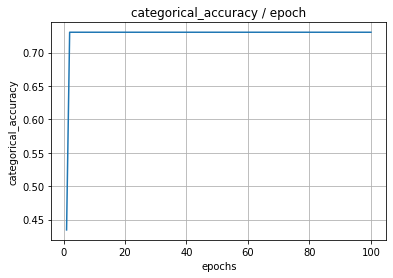

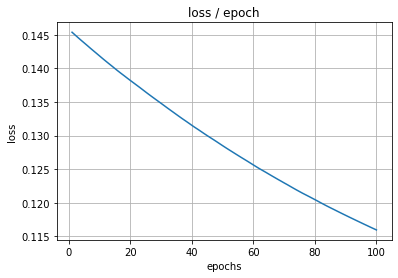

Classification algorithms: decision_tree, Cluster Number: 2, Encoding Algorithm: basic_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'best'}




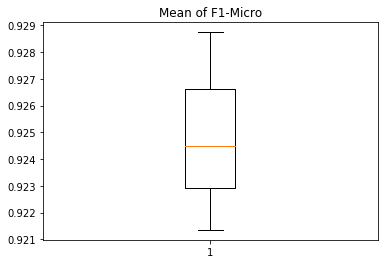

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1759 - categorical_accuracy: 0.0128
Epoch 2/100
156/156 [==============================] - 0s 216us/step - loss: 0.1570 - categorical_accuracy: 0.0256
Epoch 3/100
156/156 [==============================] - 0s 214us/step - loss: 0.0869 - categorical_accuracy: 0.0256
Epoch 4/100
156/156 [==============================] - 0s 214us/step - loss: 0.0655 - categorical_accuracy: 0.4615
Epoch 5/100
156/156 [==============================] - 0s 217us/step - loss: 0.0706 - categorical_accuracy: 0.0000e+00
Epoch 6/100
156/156 [==============================] - 0s 220us/step - loss: 0.0647 - categorical_accuracy: 0.0256
Epoch 7/100
156/156 [==============================] - 0s 220us/step - loss: 0.0651 - categorical_accuracy: 0.0000e+00
Epoch 8/100
156/156 [==============================] - 0s 220us/step - loss: 0.0568 - categorical_accuracy: 0.9679
Epoch 9/100
156/156 [==============================] - 0s 220us/step - los

<Figure size 432x288 with 0 Axes>

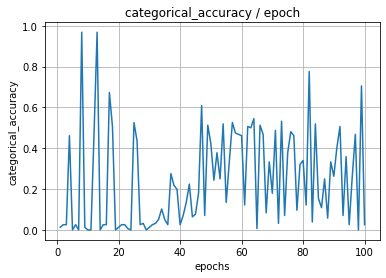

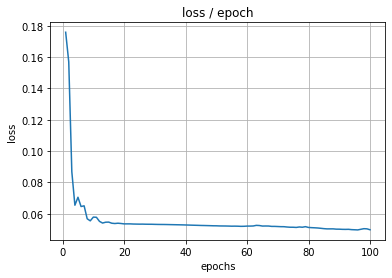

Classification algorithms: decision_tree, Cluster Number: 2, Encoding Algorithm: relational_sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'gini', 'splitter': 'random'}




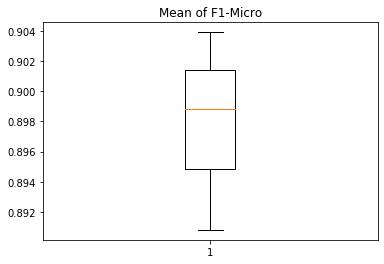

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1769 - categorical_accuracy: 0.0064
Epoch 2/100
156/156 [==============================] - 0s 216us/step - loss: 0.1756 - categorical_accuracy: 0.3205
Epoch 3/100
156/156 [==============================] - 0s 214us/step - loss: 0.1727 - categorical_accuracy: 0.0449
Epoch 4/100
156/156 [==============================] - 0s 227us/step - loss: 0.1647 - categorical_accuracy: 0.0256
Epoch 5/100
156/156 [==============================] - 0s 217us/step - loss: 0.1432 - categorical_accuracy: 0.0256
Epoch 6/100
156/156 [==============================] - 0s 245us/step - loss: 0.0933 - categorical_accuracy: 0.0256
Epoch 7/100
156/156 [==============================] - 0s 222us/step - loss: 0.0610 - categorical_accuracy: 0.0256
Epoch 8/100
156/156 [==============================] - 0s 224us/step - loss: 0.0610 - categorical_accuracy: 0.4936
Epoch 9/100
156/156 [==============================] - 0s 232us/step - loss: 0.062

<Figure size 432x288 with 0 Axes>

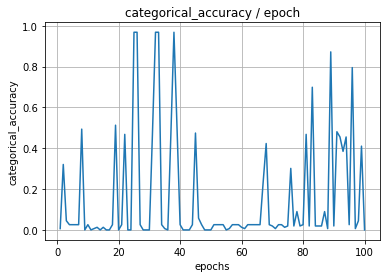

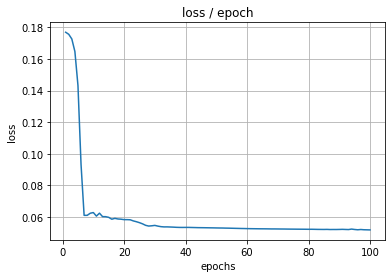

Classification algorithms: decision_tree, Cluster Number: 2, Encoding Algorithm: sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'random'}




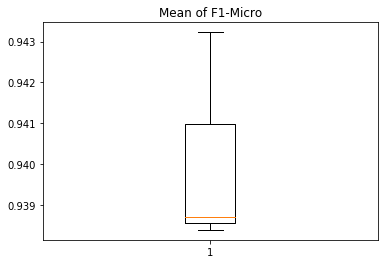

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1771 - categorical_accuracy: 0.4615
Epoch 2/100
156/156 [==============================] - 0s 210us/step - loss: 0.1770 - categorical_accuracy: 0.0000e+00
Epoch 3/100
156/156 [==============================] - 0s 208us/step - loss: 0.1768 - categorical_accuracy: 0.0256
Epoch 4/100
156/156 [==============================] - 0s 207us/step - loss: 0.1767 - categorical_accuracy: 0.0128
Epoch 5/100
156/156 [==============================] - 0s 205us/step - loss: 0.1765 - categorical_accuracy: 0.0000e+00
Epoch 6/100
156/156 [==============================] - 0s 203us/step - loss: 0.1764 - categorical_accuracy: 0.0256
Epoch 7/100
156/156 [==============================] - 0s 210us/step - loss: 0.1763 - categorical_accuracy: 0.0256
Epoch 8/100
156/156 [==============================] - 0s 210us/step - loss: 0.1761 - categorical_accuracy: 0.0192
Epoch 9/100
156/156 [==============================] - 0s 213us/step - los

<Figure size 432x288 with 0 Axes>

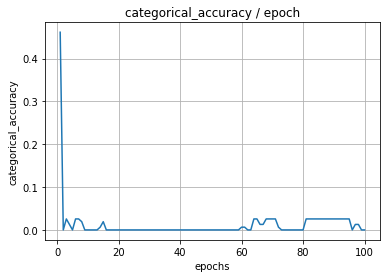

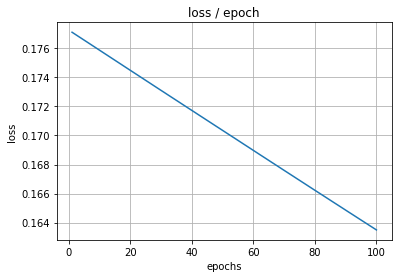

Classification algorithms: decision_tree, Cluster Number: 3, Encoding Algorithm: basic_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'best'}




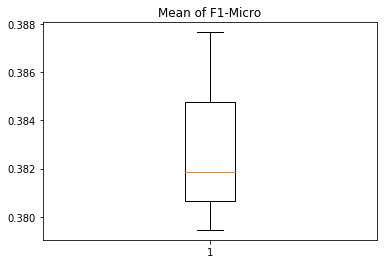

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 439us/step - loss: 0.1471 - categorical_accuracy: 0.0037
Epoch 2/100
801/801 [==============================] - 0s 216us/step - loss: 0.1267 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 219us/step - loss: 0.1271 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 220us/step - loss: 0.1249 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 225us/step - loss: 0.1253 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 210us/step - loss: 0.1243 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 211us/step - loss: 0.1241 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 208us/step - loss: 0.1238 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 212us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

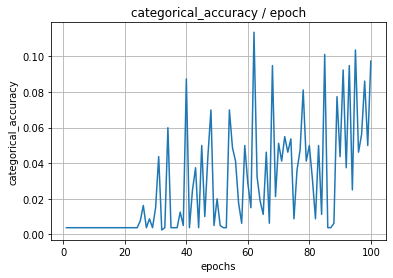

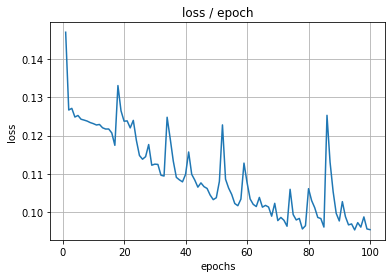

Classification algorithms: decision_tree, Cluster Number: 3, Encoding Algorithm: relational_sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'random'}




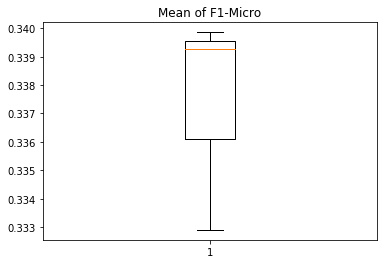

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 440us/step - loss: 0.1665 - categorical_accuracy: 0.0050
Epoch 2/100
801/801 [==============================] - 0s 223us/step - loss: 0.1349 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 214us/step - loss: 0.1260 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 215us/step - loss: 0.1256 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 212us/step - loss: 0.1249 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 212us/step - loss: 0.1252 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 214us/step - loss: 0.1251 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 211us/step - loss: 0.1246 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 210us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

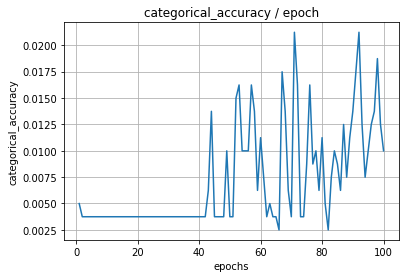

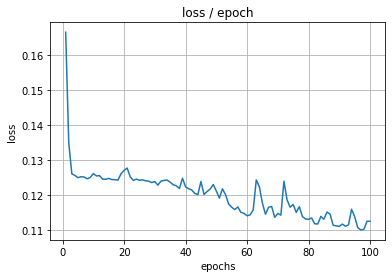

Classification algorithms: decision_tree, Cluster Number: 3, Encoding Algorithm: sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'random'}




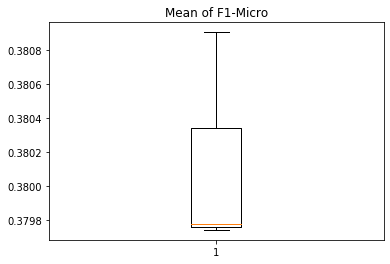

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 414us/step - loss: 0.1712 - categorical_accuracy: 0.0137
Epoch 2/100
801/801 [==============================] - 0s 213us/step - loss: 0.1708 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 210us/step - loss: 0.1704 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 212us/step - loss: 0.1699 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 211us/step - loss: 0.1695 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 213us/step - loss: 0.1691 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 211us/step - loss: 0.1688 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 214us/step - loss: 0.1684 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 210us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

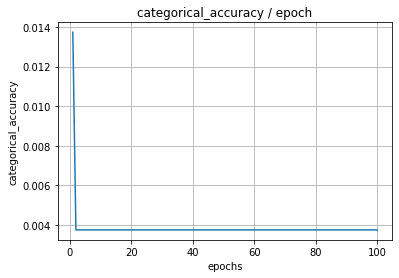

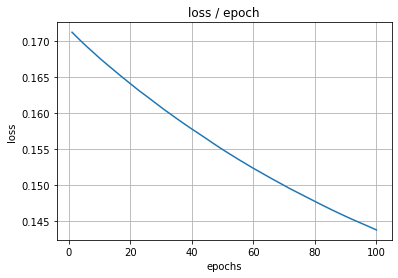

Classification algorithms: decision_tree, Cluster Number: 4, Encoding Algorithm: basic_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'best'}




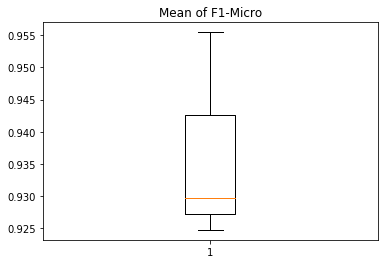

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 289us/step - loss: 0.1522 - categorical_accuracy: 0.9508
Epoch 3/100
61/61 [==============================] - 0s 265us/step - loss: 0.1473 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 261us/step - loss: 0.1347 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 242us/step - loss: 0.1063 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 243us/step - loss: 0.0673 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 260us/step - loss: 0.0713 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 255us/step - loss: 0.0762 - categorical_accuracy: 0.0000e+00
Epoch 9/100
61/61 [==============================] - 0s 269us/step - loss: 0.0670 - catego

<Figure size 432x288 with 0 Axes>

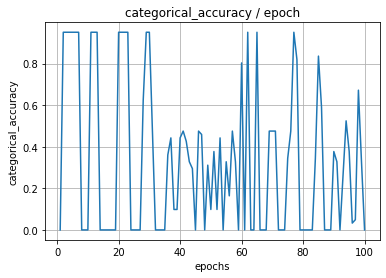

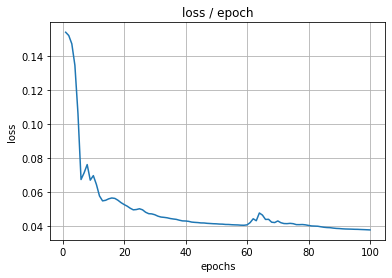

Classification algorithms: decision_tree, Cluster Number: 4, Encoding Algorithm: relational_sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'random'}




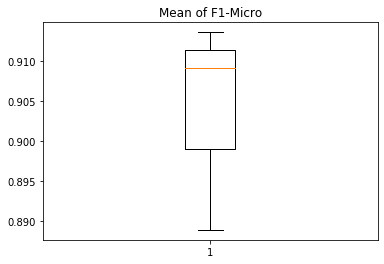

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 279us/step - loss: 0.1538 - categorical_accuracy: 0.8689
Epoch 3/100
61/61 [==============================] - 0s 273us/step - loss: 0.1533 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 269us/step - loss: 0.1525 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 246us/step - loss: 0.1513 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 245us/step - loss: 0.1493 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 247us/step - loss: 0.1459 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 245us/step - loss: 0.1401 - categorical_accuracy: 0.9508
Epoch 9/100
61/61 [==============================] - 0s 246us/step - loss: 0.1303 - categorica

<Figure size 432x288 with 0 Axes>

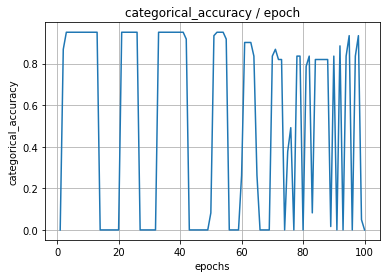

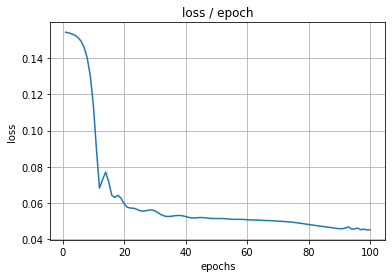

Classification algorithms: decision_tree, Cluster Number: 4, Encoding Algorithm: sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'gini', 'splitter': 'best'}




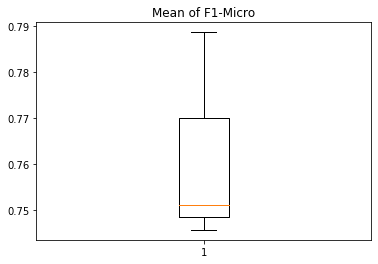

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 286us/step - loss: 0.1542 - categorical_accuracy: 0.9508
Epoch 3/100
61/61 [==============================] - 0s 254us/step - loss: 0.1541 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 239us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 244us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 251us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 242us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 257us/step - loss: 0.1538 - categorical_accuracy: 0.9508
Epoch 9/100
61/61 [==============================] - 0s 250us/step - loss: 0.1538 - categorica

<Figure size 432x288 with 0 Axes>

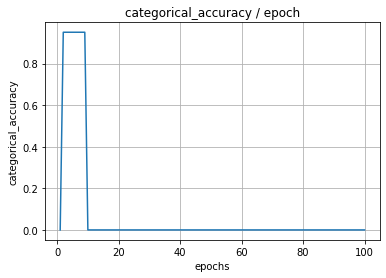

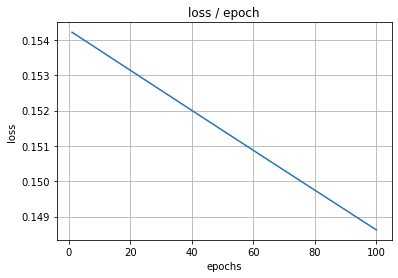

Classification algorithms: decision_tree, Cluster Number: 5, Encoding Algorithm: basic_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'best'}




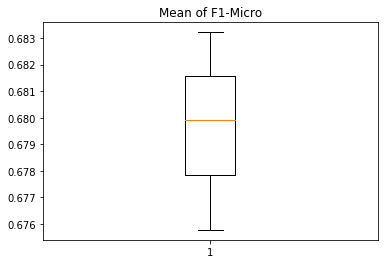

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 775us/step - loss: 0.1512 - categorical_accuracy: 0.0000e+00
Epoch 2/100
319/319 [==============================] - 0s 230us/step - loss: 0.1015 - categorical_accuracy: 0.1912
Epoch 3/100
319/319 [==============================] - 0s 213us/step - loss: 0.0898 - categorical_accuracy: 0.0000e+00
Epoch 4/100
319/319 [==============================] - 0s 211us/step - loss: 0.0853 - categorical_accuracy: 0.3448
Epoch 5/100
319/319 [==============================] - 0s 210us/step - loss: 0.0829 - categorical_accuracy: 0.1693
Epoch 6/100
319/319 [==============================] - 0s 212us/step - loss: 0.0818 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 215us/step - loss: 0.0809 - categorical_accuracy: 0.4890
Epoch 8/100
319/319 [==============================] - 0s 202us/step - loss: 0.0803 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================] - 0s 210us/

<Figure size 432x288 with 0 Axes>

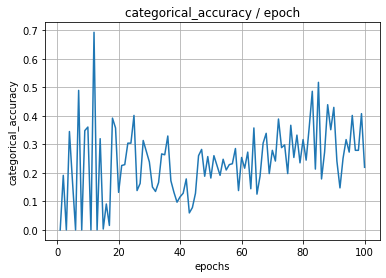

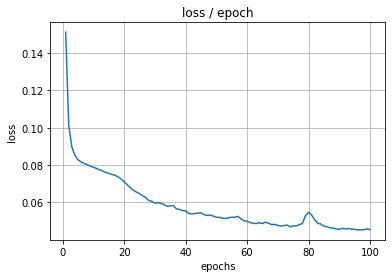

Classification algorithms: decision_tree, Cluster Number: 5, Encoding Algorithm: relational_sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'best'}




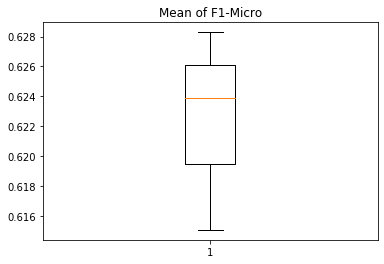

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 712us/step - loss: 0.1640 - categorical_accuracy: 0.4734
Epoch 2/100
319/319 [==============================] - 0s 198us/step - loss: 0.1586 - categorical_accuracy: 0.4702
Epoch 3/100
319/319 [==============================] - 0s 201us/step - loss: 0.1244 - categorical_accuracy: 0.0000e+00
Epoch 4/100
319/319 [==============================] - 0s 204us/step - loss: 0.0962 - categorical_accuracy: 0.0000e+00
Epoch 5/100
319/319 [==============================] - 0s 201us/step - loss: 0.0866 - categorical_accuracy: 0.0000e+00
Epoch 6/100
319/319 [==============================] - 0s 202us/step - loss: 0.0885 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 203us/step - loss: 0.0826 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 202us/step - loss: 0.0829 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================] - 0

<Figure size 432x288 with 0 Axes>

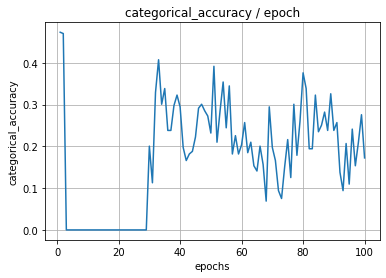

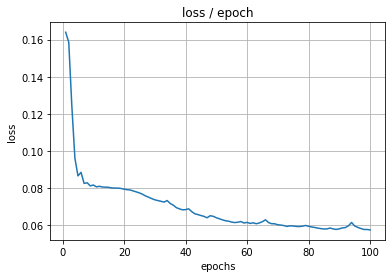

Classification algorithms: decision_tree, Cluster Number: 5, Encoding Algorithm: sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'random'}




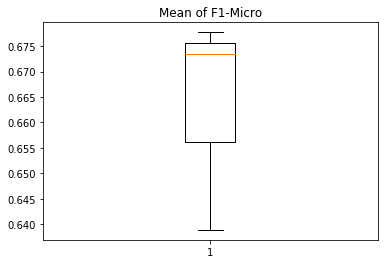

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 695us/step - loss: 0.1645 - categorical_accuracy: 0.1912
Epoch 2/100
319/319 [==============================] - 0s 197us/step - loss: 0.1643 - categorical_accuracy: 0.0000e+00
Epoch 3/100
319/319 [==============================] - 0s 197us/step - loss: 0.1641 - categorical_accuracy: 0.3605
Epoch 4/100
319/319 [==============================] - 0s 198us/step - loss: 0.1639 - categorical_accuracy: 0.1693
Epoch 5/100
319/319 [==============================] - 0s 205us/step - loss: 0.1637 - categorical_accuracy: 0.0000e+00
Epoch 6/100
319/319 [==============================] - 0s 206us/step - loss: 0.1634 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 205us/step - loss: 0.1632 - categorical_accuracy: 0.1567
Epoch 8/100
319/319 [==============================] - 0s 201us/step - loss: 0.1630 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================] - 0s 199us/

<Figure size 432x288 with 0 Axes>

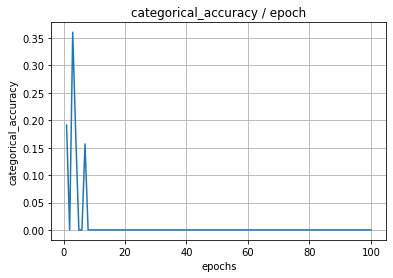

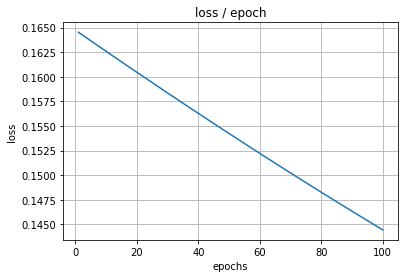

Classification algorithms: decision_tree, Cluster Number: 6, Encoding Algorithm: basic_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'best'}




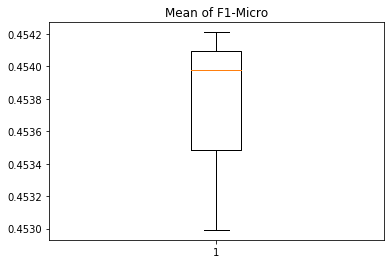

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 685us/step - loss: 0.1426 - categorical_accuracy: 0.0024
Epoch 2/100
420/420 [==============================] - 0s 237us/step - loss: 0.1131 - categorical_accuracy: 0.0786
Epoch 3/100
420/420 [==============================] - 0s 230us/step - loss: 0.1071 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 244us/step - loss: 0.1057 - categorical_accuracy: 0.0000e+00
Epoch 5/100
420/420 [==============================] - 0s 226us/step - loss: 0.1040 - categorical_accuracy: 0.1000
Epoch 6/100
420/420 [==============================] - 0s 226us/step - loss: 0.1026 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 226us/step - loss: 0.1011 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 223us/step - loss: 0.1000 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [==============================] - 0s 22

<Figure size 432x288 with 0 Axes>

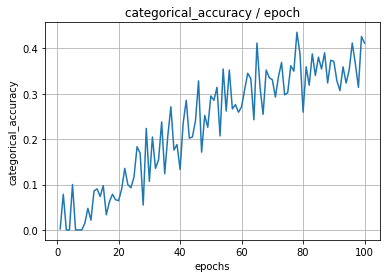

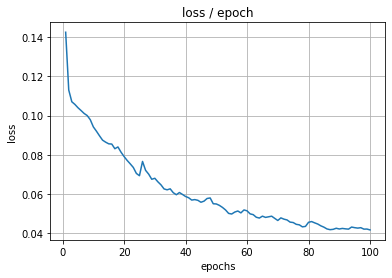

Classification algorithms: decision_tree, Cluster Number: 6, Encoding Algorithm: relational_sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'gini', 'splitter': 'best'}




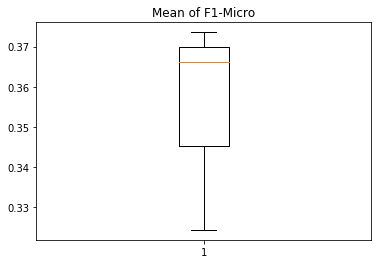

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 654us/step - loss: 0.1520 - categorical_accuracy: 0.0000e+00
Epoch 2/100
420/420 [==============================] - 0s 219us/step - loss: 0.1405 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 224us/step - loss: 0.1145 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 214us/step - loss: 0.1096 - categorical_accuracy: 0.0000e+00
Epoch 5/100
420/420 [==============================] - 0s 217us/step - loss: 0.1071 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 216us/step - loss: 0.1061 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 219us/step - loss: 0.1057 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 217us/step - loss: 0.1057 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [===========================

<Figure size 432x288 with 0 Axes>

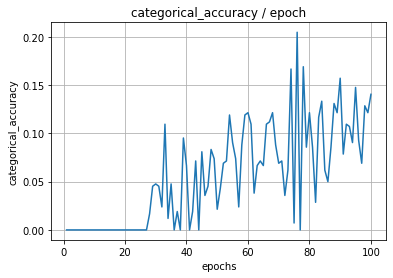

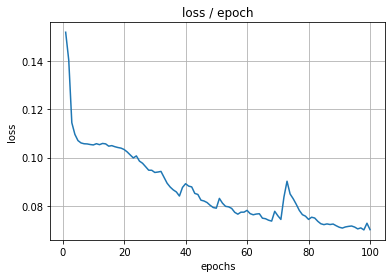

Classification algorithms: decision_tree, Cluster Number: 6, Encoding Algorithm: sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'random'}




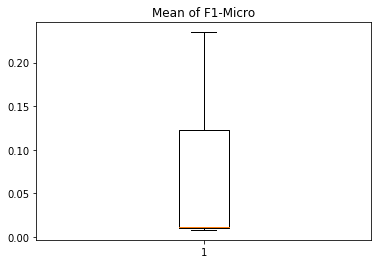

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 611us/step - loss: 0.1526 - categorical_accuracy: 0.0071
Epoch 2/100
420/420 [==============================] - 0s 219us/step - loss: 0.1524 - categorical_accuracy: 0.3190
Epoch 3/100
420/420 [==============================] - 0s 221us/step - loss: 0.1522 - categorical_accuracy: 0.3190
Epoch 4/100
420/420 [==============================] - 0s 221us/step - loss: 0.1519 - categorical_accuracy: 0.1738
Epoch 5/100
420/420 [==============================] - 0s 222us/step - loss: 0.1517 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 224us/step - loss: 0.1515 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 223us/step - loss: 0.1512 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 219us/step - loss: 0.1510 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [==============================] - 0s 220us/

<Figure size 432x288 with 0 Axes>

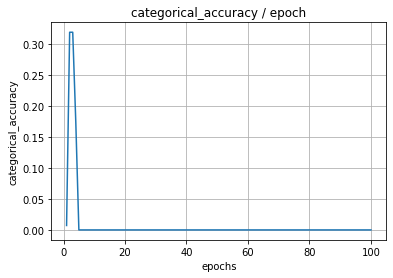

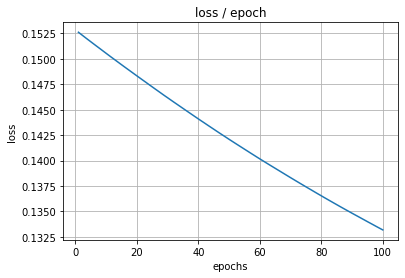

Classification algorithms: decision_tree, Cluster Number: 7, Encoding Algorithm: basic_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'gini', 'splitter': 'best'}




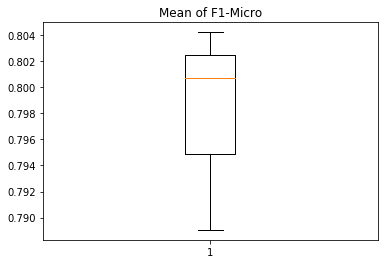

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1671 - categorical_accuracy: 0.0000e+00
Epoch 2/100
115/115 [==============================] - 0s 274us/step - loss: 0.1560 - categorical_accuracy: 0.0000e+00
Epoch 3/100
115/115 [==============================] - 0s 264us/step - loss: 0.1109 - categorical_accuracy: 0.0000e+00
Epoch 4/100
115/115 [==============================] - 0s 302us/step - loss: 0.0998 - categorical_accuracy: 0.1478
Epoch 5/100
115/115 [==============================] - 0s 278us/step - loss: 0.0837 - categorical_accuracy: 0.4000
Epoch 6/100
115/115 [==============================] - 0s 267us/step - loss: 0.0863 - categorical_accuracy: 0.0000e+00
Epoch 7/100
115/115 [==============================] - 0s 271us/step - loss: 0.0838 - categorical_accuracy: 0.0000e+00
Epoch 8/100
115/115 [==============================] - 0s 263us/step - loss: 0.0787 - categorical_accuracy: 0.0000e+00
Epoch 9/100
115/115 [==============================] - 0s 

<Figure size 432x288 with 0 Axes>

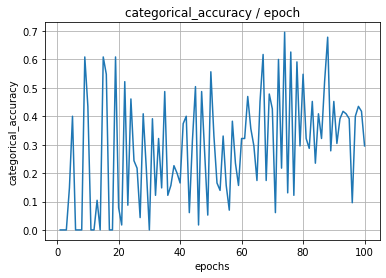

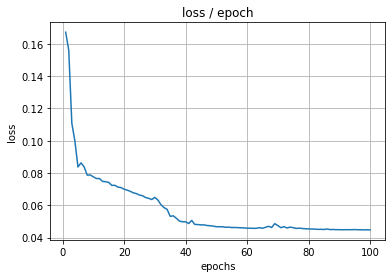

Classification algorithms: decision_tree, Cluster Number: 7, Encoding Algorithm: relational_sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'entropy', 'splitter': 'random'}




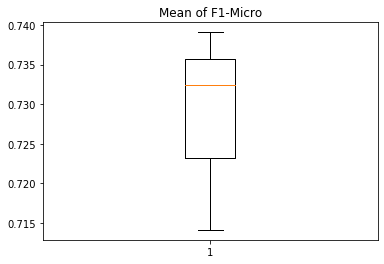

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1677 - categorical_accuracy: 0.2000
Epoch 2/100
115/115 [==============================] - 0s 277us/step - loss: 0.1668 - categorical_accuracy: 0.6087
Epoch 3/100
115/115 [==============================] - 0s 266us/step - loss: 0.1650 - categorical_accuracy: 0.6087
Epoch 4/100
115/115 [==============================] - 0s 287us/step - loss: 0.1603 - categorical_accuracy: 0.6087
Epoch 5/100
115/115 [==============================] - 0s 272us/step - loss: 0.1470 - categorical_accuracy: 0.6087
Epoch 6/100
115/115 [==============================] - 0s 263us/step - loss: 0.1144 - categorical_accuracy: 0.6087
Epoch 7/100
115/115 [==============================] - 0s 264us/step - loss: 0.0901 - categorical_accuracy: 0.6087
Epoch 8/100
115/115 [==============================] - 0s 265us/step - loss: 0.0964 - categorical_accuracy: 0.0000e+00
Epoch 9/100
115/115 [==============================] - 0s 302us/step - loss: 0

<Figure size 432x288 with 0 Axes>

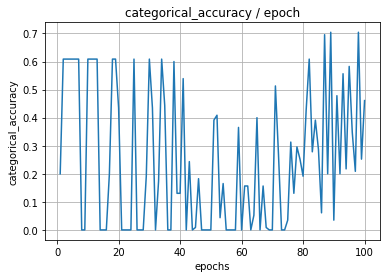

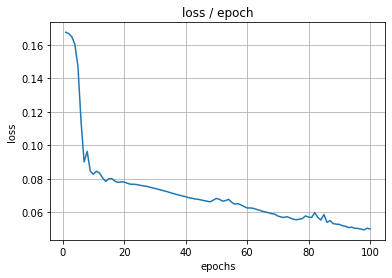

Classification algorithms: decision_tree, Cluster Number: 7, Encoding Algorithm: sparse_AE
decision_tree classification algorithm and parameter tuning based on 5-fold cross validation
decision_tree Classifier best score for training data:
Best parameters for decision_tree Classifier algorithms are: {'criterion': 'gini', 'splitter': 'random'}




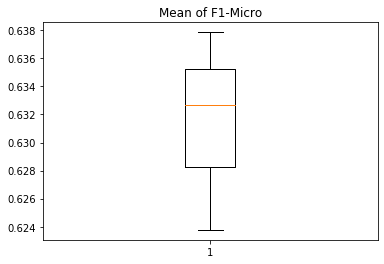

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1677 - categorical_accuracy: 0.1652
Epoch 2/100
115/115 [==============================] - 0s 277us/step - loss: 0.1676 - categorical_accuracy: 0.6087
Epoch 3/100
115/115 [==============================] - 0s 266us/step - loss: 0.1675 - categorical_accuracy: 0.6087
Epoch 4/100
115/115 [==============================] - 0s 253us/step - loss: 0.1674 - categorical_accuracy: 0.6087
Epoch 5/100
115/115 [==============================] - 0s 270us/step - loss: 0.1673 - categorical_accuracy: 0.6087
Epoch 6/100
115/115 [==============================] - 0s 257us/step - loss: 0.1671 - categorical_accuracy: 0.6087
Epoch 7/100
115/115 [==============================] - 0s 265us/step - loss: 0.1670 - categorical_accuracy: 0.6087
Epoch 8/100
115/115 [==============================] - 0s 271us/step - loss: 0.1669 - categorical_accuracy: 0.6087
Epoch 9/100
115/115 [==============================] - 0s 263us/step - loss: 0.166

<Figure size 432x288 with 0 Axes>

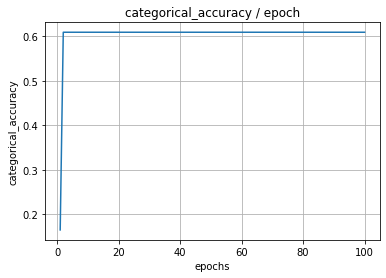

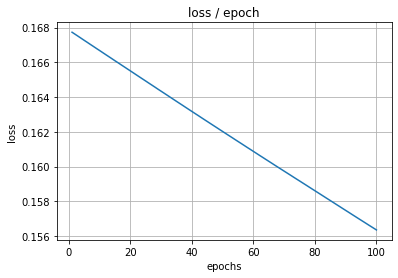

Classification algorithms: mlp, Cluster Number: 0, Encoding Algorithm: basic_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


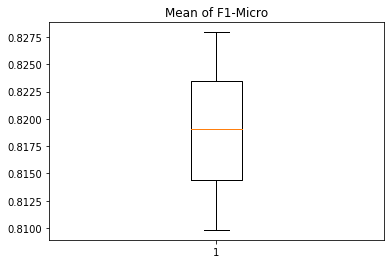

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 743us/step - loss: 0.1354 - categorical_accuracy: 0.0000e+00
Epoch 2/100
323/323 [==============================] - 0s 229us/step - loss: 0.0916 - categorical_accuracy: 0.1950
Epoch 3/100
323/323 [==============================] - 0s 230us/step - loss: 0.0821 - categorical_accuracy: 0.2786
Epoch 4/100
323/323 [==============================] - 0s 228us/step - loss: 0.0790 - categorical_accuracy: 0.0000e+00
Epoch 5/100
323/323 [==============================] - 0s 243us/step - loss: 0.0786 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 234us/step - loss: 0.0769 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 230us/step - loss: 0.0764 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 230us/step - loss: 0.0765 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================] - 0

<Figure size 432x288 with 0 Axes>

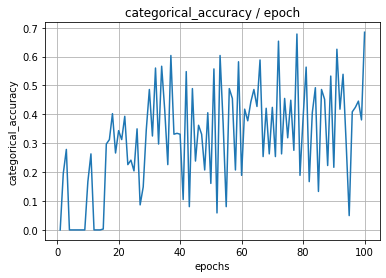

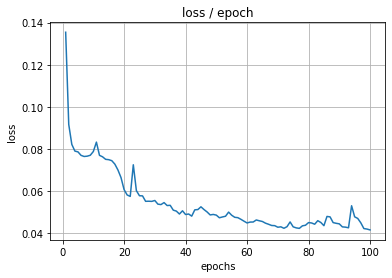

Classification algorithms: mlp, Cluster Number: 0, Encoding Algorithm: relational_sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


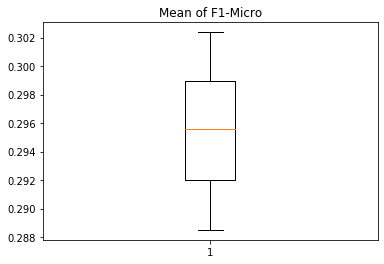

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 858us/step - loss: 0.1405 - categorical_accuracy: 0.0155
Epoch 2/100
323/323 [==============================] - 0s 267us/step - loss: 0.1343 - categorical_accuracy: 0.0000e+00
Epoch 3/100
323/323 [==============================] - 0s 243us/step - loss: 0.0947 - categorical_accuracy: 0.0000e+00
Epoch 4/100
323/323 [==============================] - 0s 237us/step - loss: 0.0854 - categorical_accuracy: 0.1858
Epoch 5/100
323/323 [==============================] - 0s 274us/step - loss: 0.0827 - categorical_accuracy: 0.0898
Epoch 6/100
323/323 [==============================] - 0s 257us/step - loss: 0.0785 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 257us/step - loss: 0.0793 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 257us/step - loss: 0.0773 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================] - 0s 24

<Figure size 432x288 with 0 Axes>

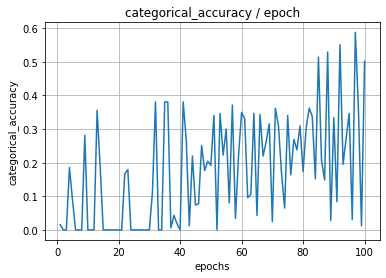

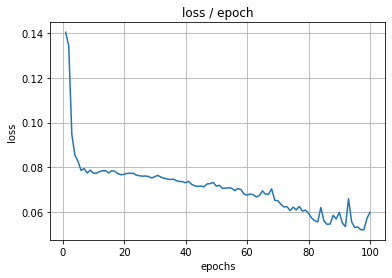

Classification algorithms: mlp, Cluster Number: 0, Encoding Algorithm: sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


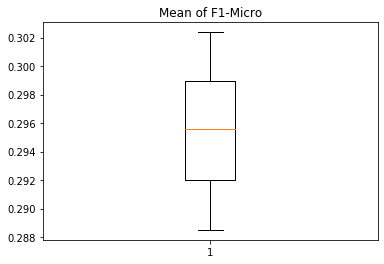

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 733us/step - loss: 0.1409 - categorical_accuracy: 0.0898
Epoch 2/100
323/323 [==============================] - 0s 233us/step - loss: 0.1406 - categorical_accuracy: 0.0000e+00
Epoch 3/100
323/323 [==============================] - 0s 229us/step - loss: 0.1404 - categorical_accuracy: 0.0000e+00
Epoch 4/100
323/323 [==============================] - 0s 227us/step - loss: 0.1402 - categorical_accuracy: 0.0000e+00
Epoch 5/100
323/323 [==============================] - 0s 231us/step - loss: 0.1400 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 227us/step - loss: 0.1397 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 242us/step - loss: 0.1395 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 239us/step - loss: 0.1393 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================]

<Figure size 432x288 with 0 Axes>

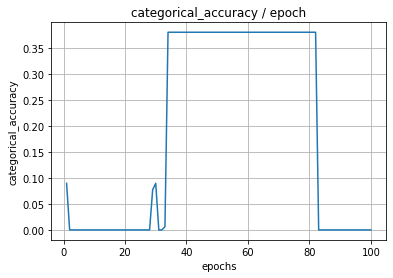

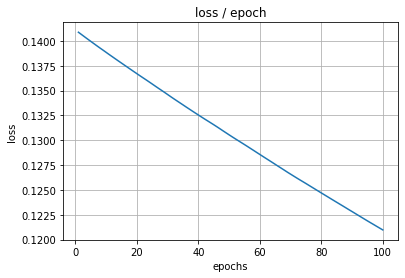

Classification algorithms: mlp, Cluster Number: 1, Encoding Algorithm: basic_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


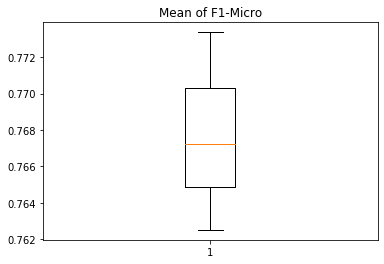

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 471us/step - loss: 0.1222 - categorical_accuracy: 0.6629
Epoch 2/100
801/801 [==============================] - 0s 228us/step - loss: 0.0973 - categorical_accuracy: 0.7104
Epoch 3/100
801/801 [==============================] - 0s 221us/step - loss: 0.0936 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 222us/step - loss: 0.0925 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 216us/step - loss: 0.0955 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 214us/step - loss: 0.0926 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 216us/step - loss: 0.0915 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 218us/step - loss: 0.0907 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 216us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

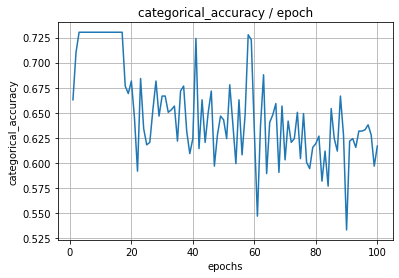

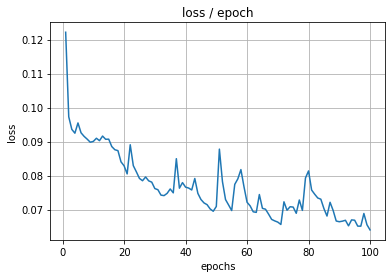

Classification algorithms: mlp, Cluster Number: 1, Encoding Algorithm: relational_sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


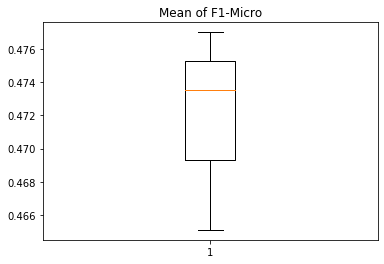

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 472us/step - loss: 0.1412 - categorical_accuracy: 0.6567
Epoch 2/100
801/801 [==============================] - 0s 230us/step - loss: 0.1011 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 224us/step - loss: 0.0942 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 214us/step - loss: 0.0935 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 221us/step - loss: 0.0927 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 215us/step - loss: 0.0931 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 215us/step - loss: 0.0925 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 217us/step - loss: 0.0929 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 213us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

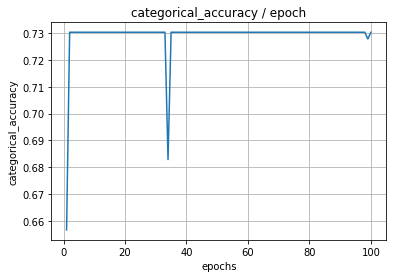

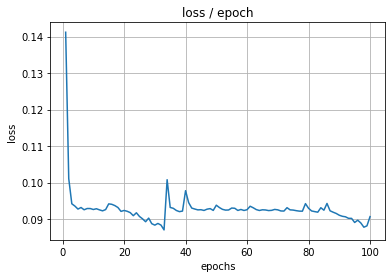

Classification algorithms: mlp, Cluster Number: 1, Encoding Algorithm: sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




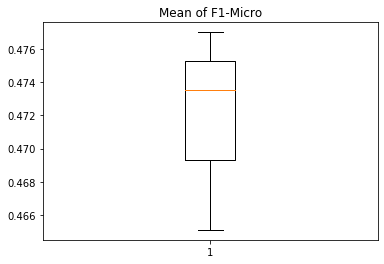

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 454us/step - loss: 0.1454 - categorical_accuracy: 0.6592
Epoch 2/100
801/801 [==============================] - 0s 229us/step - loss: 0.1450 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 223us/step - loss: 0.1446 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 227us/step - loss: 0.1442 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 226us/step - loss: 0.1438 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 221us/step - loss: 0.1434 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 221us/step - loss: 0.1430 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 228us/step - loss: 0.1426 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 220us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

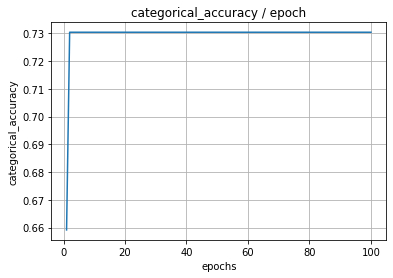

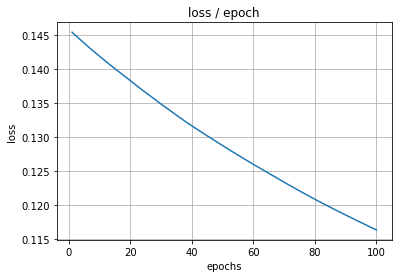

Classification algorithms: mlp, Cluster Number: 2, Encoding Algorithm: basic_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


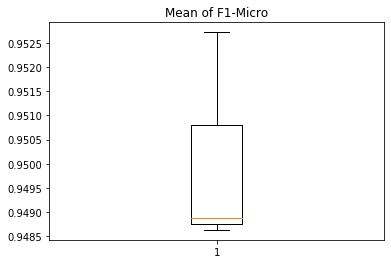

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1759 - categorical_accuracy: 0.2885
Epoch 2/100
156/156 [==============================] - 0s 252us/step - loss: 0.1558 - categorical_accuracy: 0.9679
Epoch 3/100
156/156 [==============================] - 0s 232us/step - loss: 0.0817 - categorical_accuracy: 0.9679
Epoch 4/100
156/156 [==============================] - 0s 235us/step - loss: 0.0627 - categorical_accuracy: 0.0192
Epoch 5/100
156/156 [==============================] - 0s 219us/step - loss: 0.0736 - categorical_accuracy: 0.5256
Epoch 6/100
156/156 [==============================] - 0s 224us/step - loss: 0.0758 - categorical_accuracy: 0.4744
Epoch 7/100
156/156 [==============================] - 0s 219us/step - loss: 0.0672 - categorical_accuracy: 0.0000e+00
Epoch 8/100
156/156 [==============================] - 0s 215us/step - loss: 0.0637 - categorical_accuracy: 0.0256
Epoch 9/100
156/156 [==============================] - 0s 235us/step - loss: 0

<Figure size 432x288 with 0 Axes>

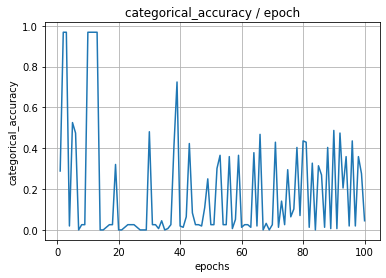

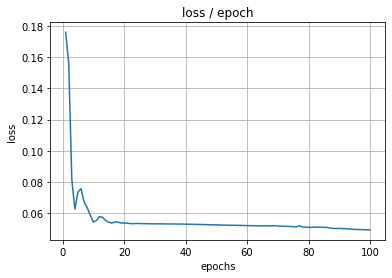

Classification algorithms: mlp, Cluster Number: 2, Encoding Algorithm: relational_sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


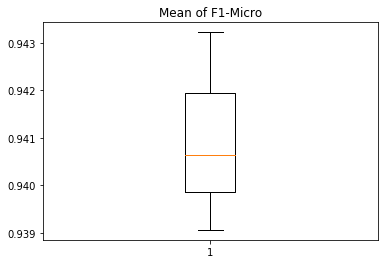

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1769 - categorical_accuracy: 0.0128
Epoch 2/100
156/156 [==============================] - 0s 216us/step - loss: 0.1757 - categorical_accuracy: 0.9359
Epoch 3/100
156/156 [==============================] - 0s 219us/step - loss: 0.1728 - categorical_accuracy: 0.9679
Epoch 4/100
156/156 [==============================] - 0s 223us/step - loss: 0.1653 - categorical_accuracy: 0.9679
Epoch 5/100
156/156 [==============================] - 0s 230us/step - loss: 0.1445 - categorical_accuracy: 0.9679
Epoch 6/100
156/156 [==============================] - 0s 231us/step - loss: 0.0957 - categorical_accuracy: 0.9679
Epoch 7/100
156/156 [==============================] - 0s 222us/step - loss: 0.0573 - categorical_accuracy: 0.9679
Epoch 8/100
156/156 [==============================] - 0s 223us/step - loss: 0.0588 - categorical_accuracy: 0.0000e+00
Epoch 9/100
156/156 [==============================] - 0s 221us/step - loss: 0

<Figure size 432x288 with 0 Axes>

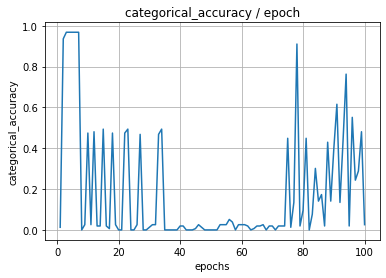

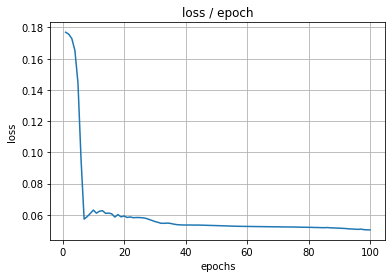

Classification algorithms: mlp, Cluster Number: 2, Encoding Algorithm: sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


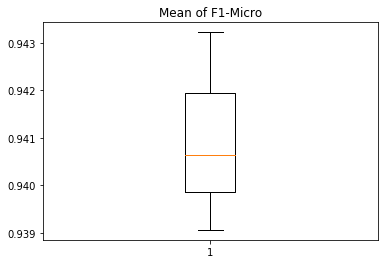

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1771 - categorical_accuracy: 0.4679
Epoch 2/100
156/156 [==============================] - 0s 219us/step - loss: 0.1770 - categorical_accuracy: 0.0000e+00
Epoch 3/100
156/156 [==============================] - 0s 213us/step - loss: 0.1768 - categorical_accuracy: 0.0000e+00
Epoch 4/100
156/156 [==============================] - 0s 224us/step - loss: 0.1767 - categorical_accuracy: 0.4808
Epoch 5/100
156/156 [==============================] - 0s 213us/step - loss: 0.1765 - categorical_accuracy: 0.9679
Epoch 6/100
156/156 [==============================] - 0s 213us/step - loss: 0.1764 - categorical_accuracy: 0.9679
Epoch 7/100
156/156 [==============================] - 0s 215us/step - loss: 0.1763 - categorical_accuracy: 0.9679
Epoch 8/100
156/156 [==============================] - 0s 217us/step - loss: 0.1761 - categorical_accuracy: 0.4744
Epoch 9/100
156/156 [==============================] - 0s 214us/step - los

<Figure size 432x288 with 0 Axes>

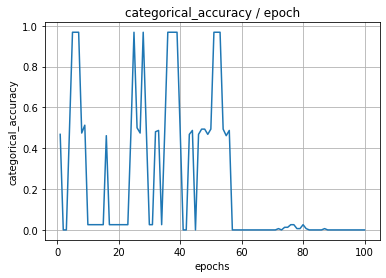

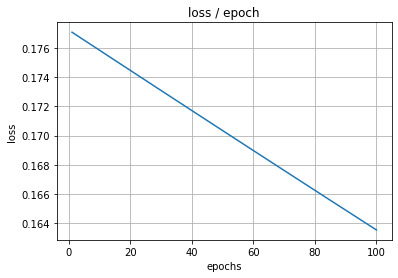

Classification algorithms: mlp, Cluster Number: 3, Encoding Algorithm: basic_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


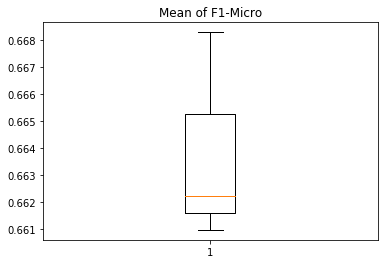

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 445us/step - loss: 0.1475 - categorical_accuracy: 0.0037
Epoch 2/100
801/801 [==============================] - 0s 219us/step - loss: 0.1286 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 215us/step - loss: 0.1270 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 213us/step - loss: 0.1311 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 213us/step - loss: 0.1268 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 217us/step - loss: 0.1252 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 212us/step - loss: 0.1245 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 212us/step - loss: 0.1249 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 212us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

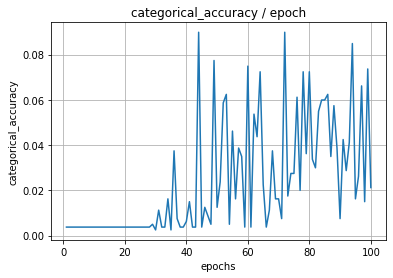

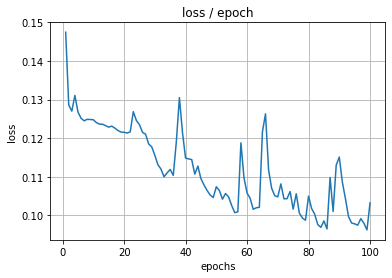

Classification algorithms: mlp, Cluster Number: 3, Encoding Algorithm: relational_sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




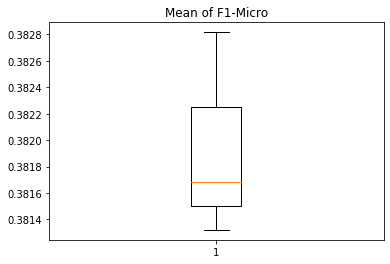

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 444us/step - loss: 0.1675 - categorical_accuracy: 0.0025
Epoch 2/100
801/801 [==============================] - 0s 222us/step - loss: 0.1331 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 217us/step - loss: 0.1273 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 216us/step - loss: 0.1258 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 216us/step - loss: 0.1259 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 213us/step - loss: 0.1251 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 217us/step - loss: 0.1248 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 217us/step - loss: 0.1247 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 216us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

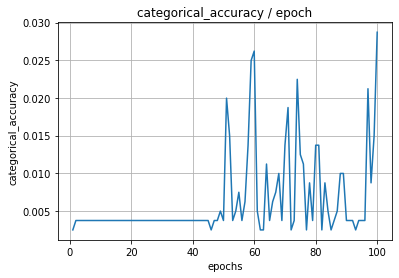

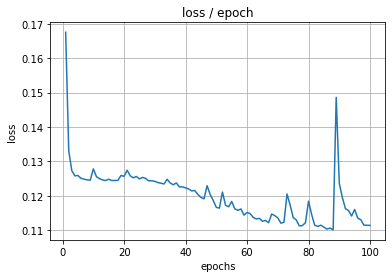

Classification algorithms: mlp, Cluster Number: 3, Encoding Algorithm: sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




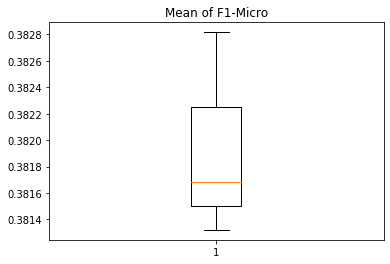

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 469us/step - loss: 0.1712 - categorical_accuracy: 0.0150
Epoch 2/100
801/801 [==============================] - 0s 223us/step - loss: 0.1708 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 224us/step - loss: 0.1704 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 225us/step - loss: 0.1700 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 222us/step - loss: 0.1696 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 224us/step - loss: 0.1692 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 223us/step - loss: 0.1688 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 217us/step - loss: 0.1684 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 221us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

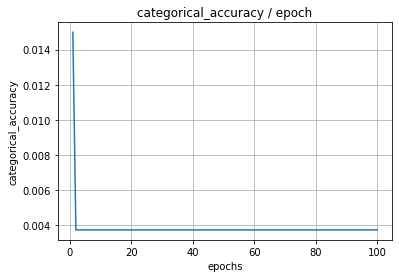

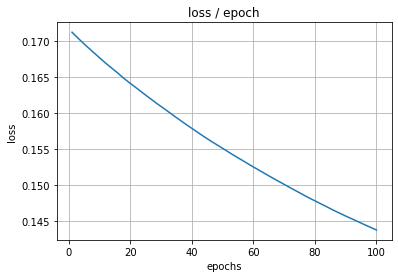

Classification algorithms: mlp, Cluster Number: 4, Encoding Algorithm: basic_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


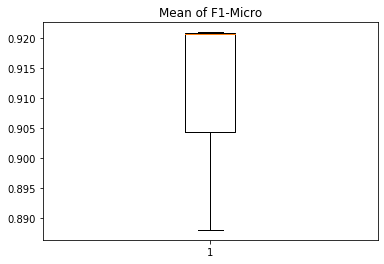

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1543 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 281us/step - loss: 0.1527 - categorical_accuracy: 0.9508
Epoch 3/100
61/61 [==============================] - 0s 261us/step - loss: 0.1492 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 249us/step - loss: 0.1405 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 242us/step - loss: 0.1204 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 255us/step - loss: 0.0834 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 261us/step - loss: 0.0705 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 275us/step - loss: 0.0749 - categorical_accuracy: 0.0000e+00
Epoch 9/100
61/61 [==============================] - 0s 251us/step - loss: 0.0658 - catego

<Figure size 432x288 with 0 Axes>

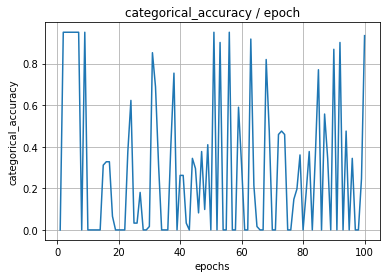

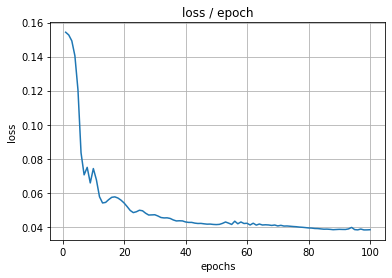

Classification algorithms: mlp, Cluster Number: 4, Encoding Algorithm: relational_sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


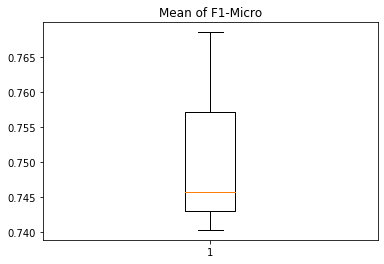

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 265us/step - loss: 0.1539 - categorical_accuracy: 0.0000e+00
Epoch 3/100
61/61 [==============================] - 0s 256us/step - loss: 0.1534 - categorical_accuracy: 0.0000e+00
Epoch 4/100
61/61 [==============================] - 0s 240us/step - loss: 0.1528 - categorical_accuracy: 0.0000e+00
Epoch 5/100
61/61 [==============================] - 0s 246us/step - loss: 0.1518 - categorical_accuracy: 0.0000e+00
Epoch 6/100
61/61 [==============================] - 0s 256us/step - loss: 0.1503 - categorical_accuracy: 0.0000e+00
Epoch 7/100
61/61 [==============================] - 0s 274us/step - loss: 0.1478 - categorical_accuracy: 0.0000e+00
Epoch 8/100
61/61 [==============================] - 0s 278us/step - loss: 0.1437 - categorical_accuracy: 0.0000e+00
Epoch 9/100
61/61 [==============================] - 0s 249us/step

<Figure size 432x288 with 0 Axes>

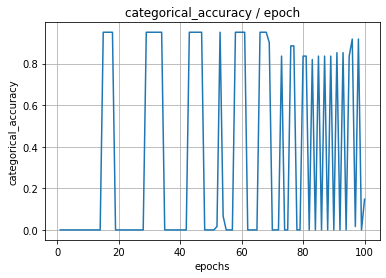

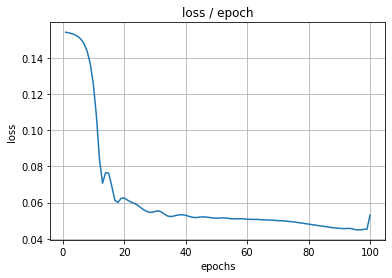

Classification algorithms: mlp, Cluster Number: 4, Encoding Algorithm: sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


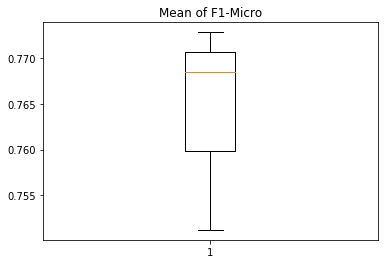

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 284us/step - loss: 0.1542 - categorical_accuracy: 0.9508
Epoch 3/100
61/61 [==============================] - 0s 261us/step - loss: 0.1541 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 273us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 246us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 246us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 250us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 251us/step - loss: 0.1538 - categorical_accuracy: 0.9508
Epoch 9/100
61/61 [==============================] - 0s 238us/step - loss: 0.1538 - categorica

<Figure size 432x288 with 0 Axes>

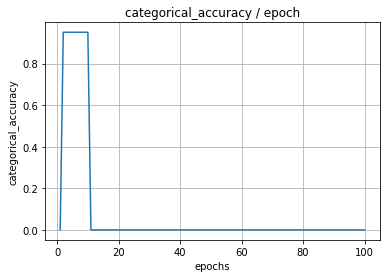

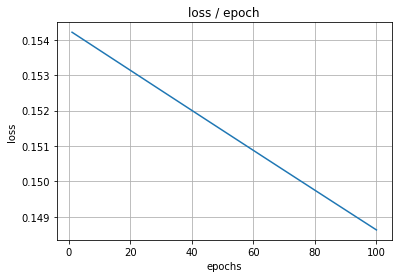

Classification algorithms: mlp, Cluster Number: 5, Encoding Algorithm: basic_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


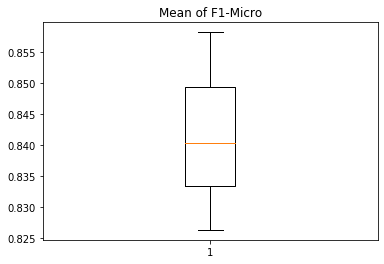

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 738us/step - loss: 0.1541 - categorical_accuracy: 0.5078
Epoch 2/100
319/319 [==============================] - 0s 207us/step - loss: 0.1090 - categorical_accuracy: 0.3605
Epoch 3/100
319/319 [==============================] - 0s 206us/step - loss: 0.0947 - categorical_accuracy: 0.1661
Epoch 4/100
319/319 [==============================] - 0s 202us/step - loss: 0.0866 - categorical_accuracy: 0.5172
Epoch 5/100
319/319 [==============================] - 0s 203us/step - loss: 0.0843 - categorical_accuracy: 0.1724
Epoch 6/100
319/319 [==============================] - 0s 202us/step - loss: 0.0824 - categorical_accuracy: 0.3887
Epoch 7/100
319/319 [==============================] - 0s 202us/step - loss: 0.0810 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 203us/step - loss: 0.0810 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================] - 0s 202us/step - l

<Figure size 432x288 with 0 Axes>

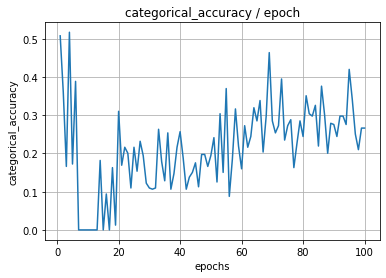

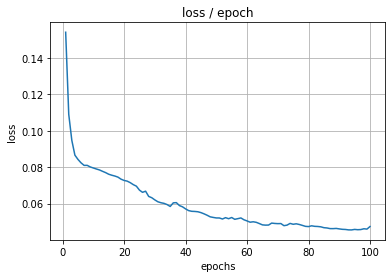

Classification algorithms: mlp, Cluster Number: 5, Encoding Algorithm: relational_sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


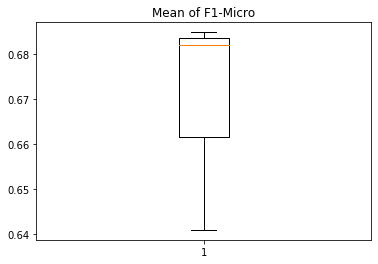

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 761us/step - loss: 0.1639 - categorical_accuracy: 0.5298
Epoch 2/100
319/319 [==============================] - 0s 216us/step - loss: 0.1582 - categorical_accuracy: 0.6928
Epoch 3/100
319/319 [==============================] - 0s 220us/step - loss: 0.1233 - categorical_accuracy: 0.6928
Epoch 4/100
319/319 [==============================] - 0s 206us/step - loss: 0.0975 - categorical_accuracy: 0.1567
Epoch 5/100
319/319 [==============================] - 0s 214us/step - loss: 0.0865 - categorical_accuracy: 0.0000e+00
Epoch 6/100
319/319 [==============================] - 0s 208us/step - loss: 0.0863 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 208us/step - loss: 0.0827 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 206us/step - loss: 0.0824 - categorical_accuracy: 0.5172
Epoch 9/100
319/319 [==============================] - 0s 209us/step

<Figure size 432x288 with 0 Axes>

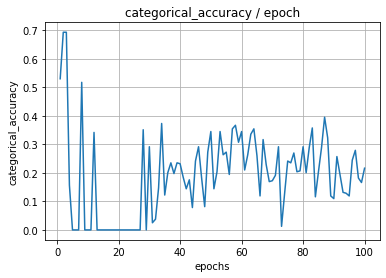

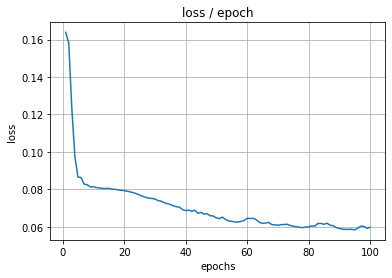

Classification algorithms: mlp, Cluster Number: 5, Encoding Algorithm: sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


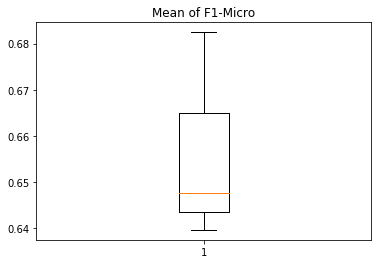

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 720us/step - loss: 0.1645 - categorical_accuracy: 0.3386
Epoch 2/100
319/319 [==============================] - 0s 203us/step - loss: 0.1643 - categorical_accuracy: 0.0000e+00
Epoch 3/100
319/319 [==============================] - 0s 203us/step - loss: 0.1641 - categorical_accuracy: 0.0000e+00
Epoch 4/100
319/319 [==============================] - 0s 205us/step - loss: 0.1639 - categorical_accuracy: 0.0000e+00
Epoch 5/100
319/319 [==============================] - 0s 203us/step - loss: 0.1637 - categorical_accuracy: 0.0000e+00
Epoch 6/100
319/319 [==============================] - 0s 201us/step - loss: 0.1634 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 205us/step - loss: 0.1632 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 210us/step - loss: 0.1630 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================]

<Figure size 432x288 with 0 Axes>

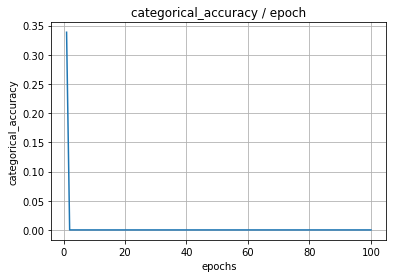

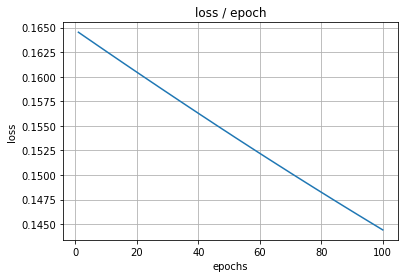

Classification algorithms: mlp, Cluster Number: 6, Encoding Algorithm: basic_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


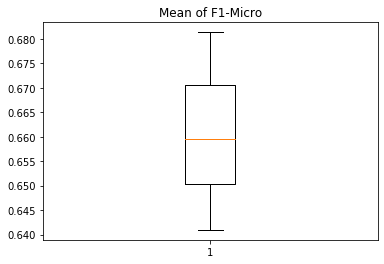

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 630us/step - loss: 0.1420 - categorical_accuracy: 0.0000e+00
Epoch 2/100
420/420 [==============================] - 0s 231us/step - loss: 0.1121 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 231us/step - loss: 0.1072 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 224us/step - loss: 0.1055 - categorical_accuracy: 0.0000e+00
Epoch 5/100
420/420 [==============================] - 0s 224us/step - loss: 0.1036 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 229us/step - loss: 0.1015 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 231us/step - loss: 0.0998 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 236us/step - loss: 0.0988 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [===========================

<Figure size 432x288 with 0 Axes>

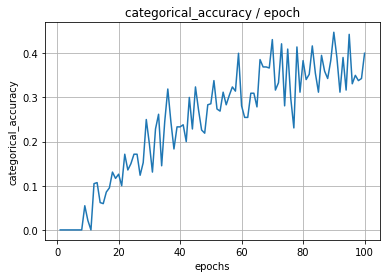

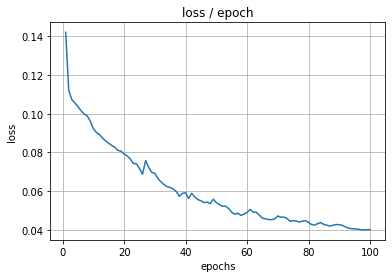

Classification algorithms: mlp, Cluster Number: 6, Encoding Algorithm: relational_sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1268: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/metrics

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


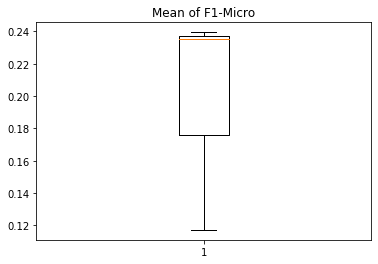

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 620us/step - loss: 0.1521 - categorical_accuracy: 0.0595
Epoch 2/100
420/420 [==============================] - 0s 235us/step - loss: 0.1412 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 229us/step - loss: 0.1136 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 225us/step - loss: 0.1117 - categorical_accuracy: 0.0000e+00
Epoch 5/100
420/420 [==============================] - 0s 228us/step - loss: 0.1078 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 235us/step - loss: 0.1064 - categorical_accuracy: 0.0452
Epoch 7/100
420/420 [==============================] - 0s 230us/step - loss: 0.1061 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 225us/step - loss: 0.1058 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [==============================] - 0

<Figure size 432x288 with 0 Axes>

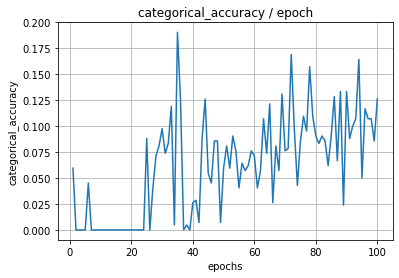

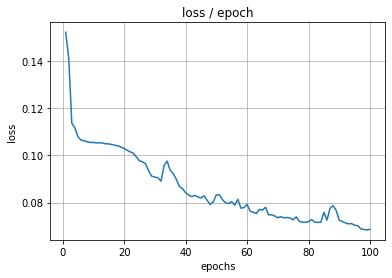

Classification algorithms: mlp, Cluster Number: 6, Encoding Algorithm: sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1268: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1268: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/storage/homefolders/nader/workspace/projects/env/lib

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




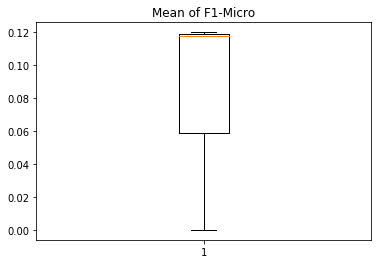

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 747us/step - loss: 0.1526 - categorical_accuracy: 0.0643
Epoch 2/100
420/420 [==============================] - 0s 245us/step - loss: 0.1524 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 229us/step - loss: 0.1522 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 233us/step - loss: 0.1519 - categorical_accuracy: 0.0000e+00
Epoch 5/100
420/420 [==============================] - 0s 235us/step - loss: 0.1517 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 229us/step - loss: 0.1515 - categorical_accuracy: 0.2548
Epoch 7/100
420/420 [==============================] - 0s 224us/step - loss: 0.1512 - categorical_accuracy: 0.3190
Epoch 8/100
420/420 [==============================] - 0s 231us/step - loss: 0.1510 - categorical_accuracy: 0.3190
Epoch 9/100
420/420 [==============================] - 0s 227us/

<Figure size 432x288 with 0 Axes>

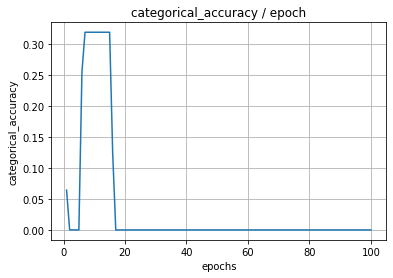

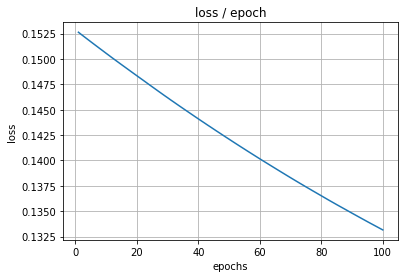

Classification algorithms: mlp, Cluster Number: 7, Encoding Algorithm: basic_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 200, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


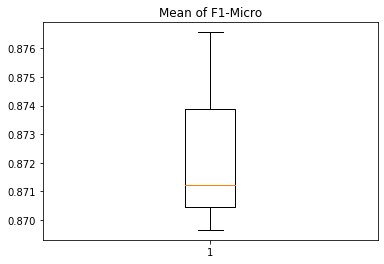

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1669 - categorical_accuracy: 0.0000e+00
Epoch 2/100
115/115 [==============================] - 0s 277us/step - loss: 0.1545 - categorical_accuracy: 0.0000e+00
Epoch 3/100
115/115 [==============================] - 0s 277us/step - loss: 0.1103 - categorical_accuracy: 0.0000e+00
Epoch 4/100
115/115 [==============================] - 0s 270us/step - loss: 0.0965 - categorical_accuracy: 0.4261
Epoch 5/100
115/115 [==============================] - 0s 265us/step - loss: 0.0876 - categorical_accuracy: 0.0000e+00
Epoch 6/100
115/115 [==============================] - 0s 266us/step - loss: 0.0881 - categorical_accuracy: 0.1739
Epoch 7/100
115/115 [==============================] - 0s 265us/step - loss: 0.0822 - categorical_accuracy: 0.6087
Epoch 8/100
115/115 [==============================] - 0s 266us/step - loss: 0.0789 - categorical_accuracy: 0.0000e+00
Epoch 9/100
115/115 [==============================] - 0s 264u

<Figure size 432x288 with 0 Axes>

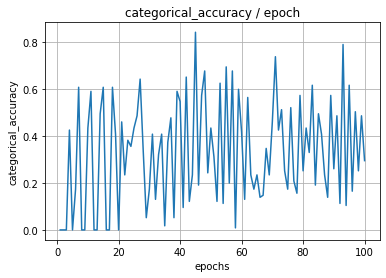

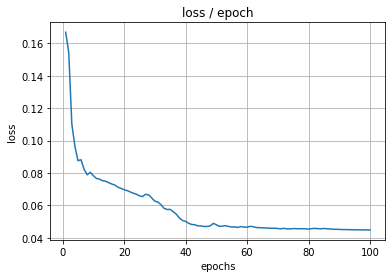

Classification algorithms: mlp, Cluster Number: 7, Encoding Algorithm: relational_sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


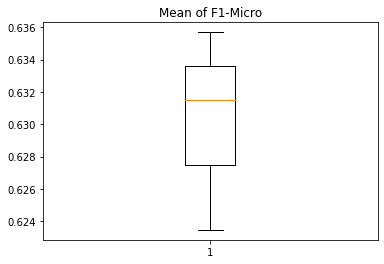

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1677 - categorical_accuracy: 0.0000e+00
Epoch 2/100
115/115 [==============================] - 0s 275us/step - loss: 0.1667 - categorical_accuracy: 0.0000e+00
Epoch 3/100
115/115 [==============================] - 0s 262us/step - loss: 0.1645 - categorical_accuracy: 0.0000e+00
Epoch 4/100
115/115 [==============================] - 0s 267us/step - loss: 0.1587 - categorical_accuracy: 0.0000e+00
Epoch 5/100
115/115 [==============================] - 0s 274us/step - loss: 0.1430 - categorical_accuracy: 0.0000e+00
Epoch 6/100
115/115 [==============================] - 0s 263us/step - loss: 0.1060 - categorical_accuracy: 0.0000e+00
Epoch 7/100
115/115 [==============================] - 0s 264us/step - loss: 0.0975 - categorical_accuracy: 0.1913
Epoch 8/100
115/115 [==============================] - 0s 268us/step - loss: 0.0965 - categorical_accuracy: 0.6087
Epoch 9/100
115/115 [==============================] - 0s 

<Figure size 432x288 with 0 Axes>

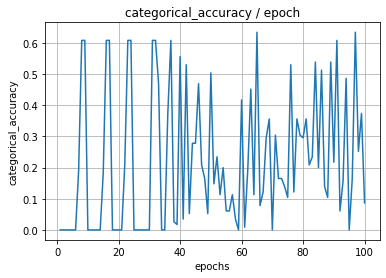

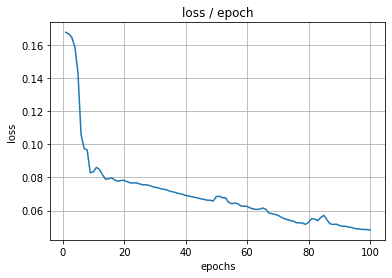

Classification algorithms: mlp, Cluster Number: 7, Encoding Algorithm: sparse_AE
mlp classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: C

mlp Classifier best score for training data:
Best parameters for mlp Classifier algorithms are: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'adaptive', 'solver': 'adam'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


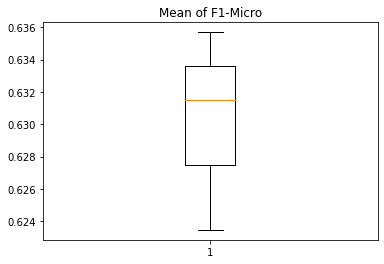

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1677 - categorical_accuracy: 0.1826
Epoch 2/100
115/115 [==============================] - 0s 261us/step - loss: 0.1676 - categorical_accuracy: 0.4261
Epoch 3/100
115/115 [==============================] - 0s 260us/step - loss: 0.1675 - categorical_accuracy: 0.6087
Epoch 4/100
115/115 [==============================] - 0s 256us/step - loss: 0.1674 - categorical_accuracy: 0.6087
Epoch 5/100
115/115 [==============================] - 0s 254us/step - loss: 0.1673 - categorical_accuracy: 0.6087
Epoch 6/100
115/115 [==============================] - 0s 252us/step - loss: 0.1671 - categorical_accuracy: 0.6087
Epoch 7/100
115/115 [==============================] - 0s 262us/step - loss: 0.1670 - categorical_accuracy: 0.6087
Epoch 8/100
115/115 [==============================] - 0s 263us/step - loss: 0.1669 - categorical_accuracy: 0.6087
Epoch 9/100
115/115 [==============================] - 0s 265us/step - loss: 0.166

<Figure size 432x288 with 0 Axes>

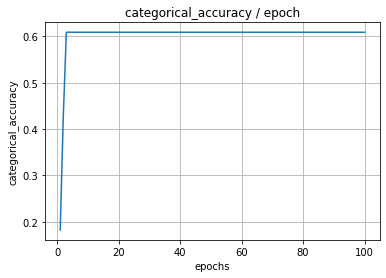

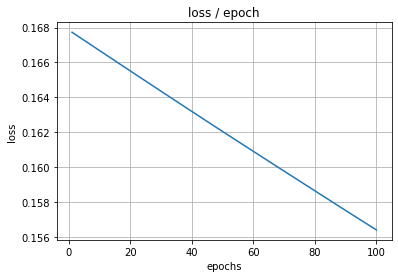

Classification algorithms: svm, Cluster Number: 0, Encoding Algorithm: basic_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 20 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 23 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 24 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 4, 'estimator__kernel': 'rbf'}




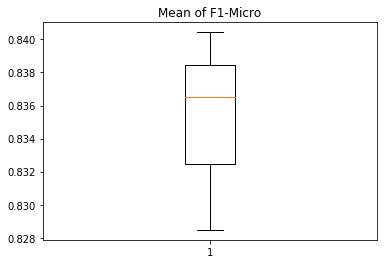

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 803us/step - loss: 0.1374 - categorical_accuracy: 0.0000e+00
Epoch 2/100
323/323 [==============================] - 0s 256us/step - loss: 0.0957 - categorical_accuracy: 0.0433
Epoch 3/100
323/323 [==============================] - 0s 247us/step - loss: 0.0880 - categorical_accuracy: 0.3529
Epoch 4/100
323/323 [==============================] - 0s 232us/step - loss: 0.0820 - categorical_accuracy: 0.2663
Epoch 5/100
323/323 [==============================] - 0s 236us/step - loss: 0.0793 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 251us/step - loss: 0.0807 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 248us/step - loss: 0.0795 - categorical_accuracy: 0.1207
Epoch 8/100
323/323 [==============================] - 0s 240us/step - loss: 0.0779 - categorical_accuracy: 0.0588
Epoch 9/100
323/323 [==============================] - 0s 237us/step

<Figure size 432x288 with 0 Axes>

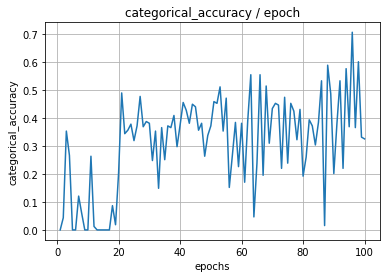

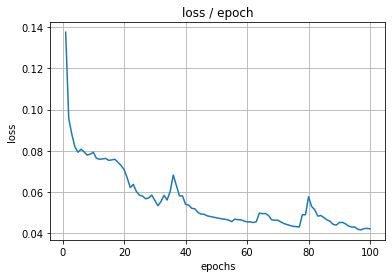

Classification algorithms: svm, Cluster Number: 0, Encoding Algorithm: relational_sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 20 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 23 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 24 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 8, 'estimator__kernel': 'rbf'}




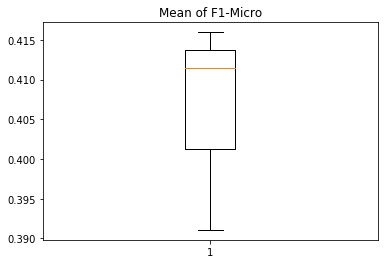

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 802us/step - loss: 0.1405 - categorical_accuracy: 0.0000e+00
Epoch 2/100
323/323 [==============================] - 0s 270us/step - loss: 0.1354 - categorical_accuracy: 0.0000e+00
Epoch 3/100
323/323 [==============================] - 0s 246us/step - loss: 0.0968 - categorical_accuracy: 0.0000e+00
Epoch 4/100
323/323 [==============================] - 0s 246us/step - loss: 0.0874 - categorical_accuracy: 0.0898
Epoch 5/100
323/323 [==============================] - 0s 235us/step - loss: 0.0841 - categorical_accuracy: 0.3808
Epoch 6/100
323/323 [==============================] - 0s 241us/step - loss: 0.0810 - categorical_accuracy: 0.2817
Epoch 7/100
323/323 [==============================] - 0s 246us/step - loss: 0.0791 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 250us/step - loss: 0.0779 - categorical_accuracy: 0.0867
Epoch 9/100
323/323 [==============================] - 0s 254us/

<Figure size 432x288 with 0 Axes>

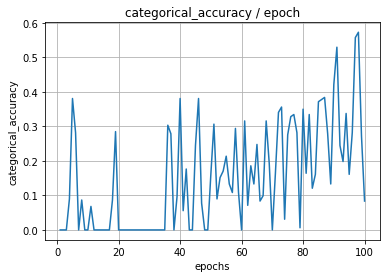

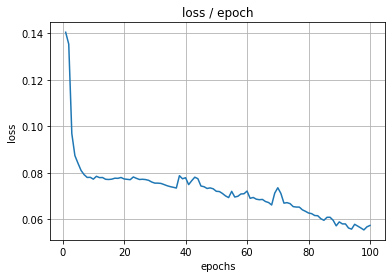

Classification algorithms: svm, Cluster Number: 0, Encoding Algorithm: sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 20 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 23 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 24 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 8, 'estimator__kernel': 'rbf'}




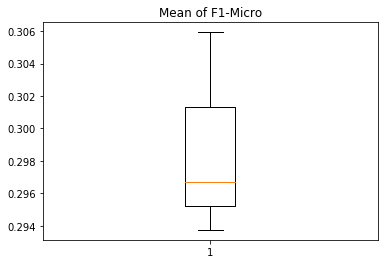

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 750us/step - loss: 0.1409 - categorical_accuracy: 0.0062
Epoch 2/100
323/323 [==============================] - 0s 242us/step - loss: 0.1406 - categorical_accuracy: 0.0000e+00
Epoch 3/100
323/323 [==============================] - 0s 234us/step - loss: 0.1404 - categorical_accuracy: 0.1115
Epoch 4/100
323/323 [==============================] - 0s 238us/step - loss: 0.1402 - categorical_accuracy: 0.0000e+00
Epoch 5/100
323/323 [==============================] - 0s 245us/step - loss: 0.1400 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 246us/step - loss: 0.1398 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 243us/step - loss: 0.1395 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 249us/step - loss: 0.1393 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================] - 0

<Figure size 432x288 with 0 Axes>

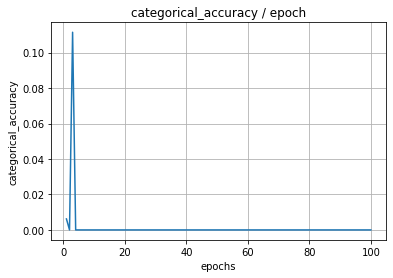

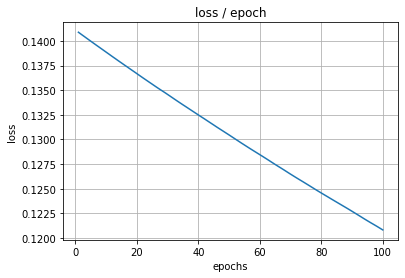

Classification algorithms: svm, Cluster Number: 1, Encoding Algorithm: basic_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 10 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 36 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-pa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 4, 'estimator__kernel': 'rbf'}




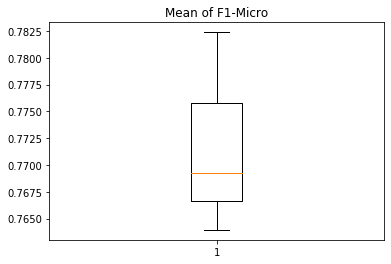

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 442us/step - loss: 0.1152 - categorical_accuracy: 0.6617
Epoch 2/100
801/801 [==============================] - 0s 217us/step - loss: 0.0947 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 220us/step - loss: 0.0921 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 216us/step - loss: 0.0910 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 215us/step - loss: 0.0908 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 214us/step - loss: 0.0915 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 211us/step - loss: 0.0899 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 205us/step - loss: 0.0890 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 208us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

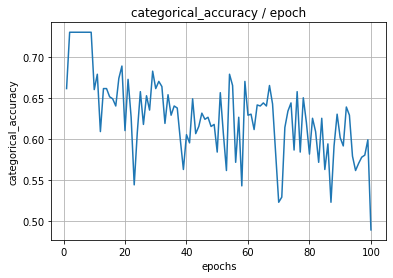

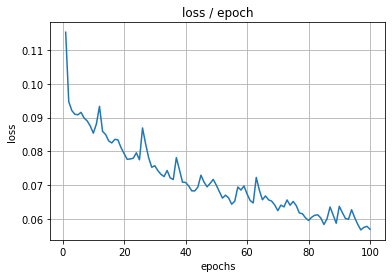

Classification algorithms: svm, Cluster Number: 1, Encoding Algorithm: relational_sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 10 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 36 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-pa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 2, 'estimator__kernel': 'rbf'}




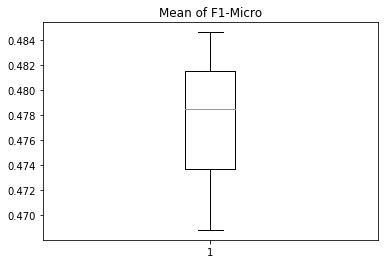

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 472us/step - loss: 0.1402 - categorical_accuracy: 0.6567
Epoch 2/100
801/801 [==============================] - 0s 230us/step - loss: 0.1033 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 222us/step - loss: 0.0957 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 218us/step - loss: 0.0964 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 216us/step - loss: 0.0934 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 218us/step - loss: 0.0930 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 216us/step - loss: 0.0929 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 217us/step - loss: 0.0929 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 217us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

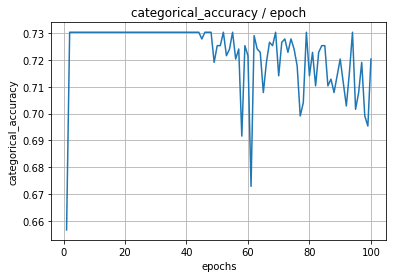

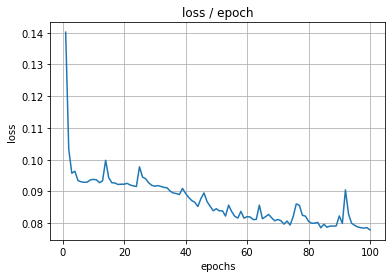

Classification algorithms: svm, Cluster Number: 1, Encoding Algorithm: sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 10 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 36 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-pa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 2, 'estimator__kernel': 'rbf'}




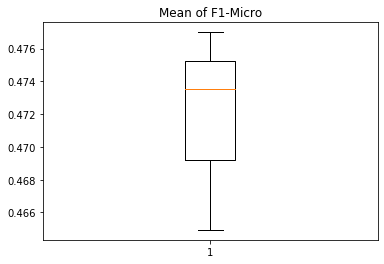

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 448us/step - loss: 0.1454 - categorical_accuracy: 0.1473
Epoch 2/100
801/801 [==============================] - 0s 221us/step - loss: 0.1450 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 214us/step - loss: 0.1445 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 220us/step - loss: 0.1441 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 209us/step - loss: 0.1437 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 207us/step - loss: 0.1433 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 212us/step - loss: 0.1429 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 209us/step - loss: 0.1426 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 212us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

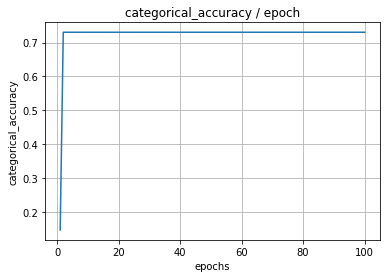

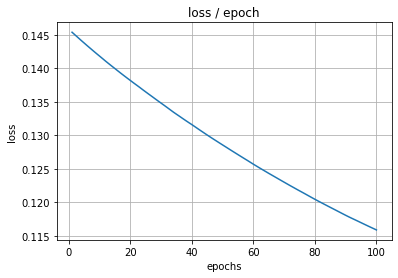

Classification algorithms: svm, Cluster Number: 2, Encoding Algorithm: basic_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 0 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 1, 'estimator__kernel': 'rbf'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 34 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 35 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 36 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 37 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 38 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

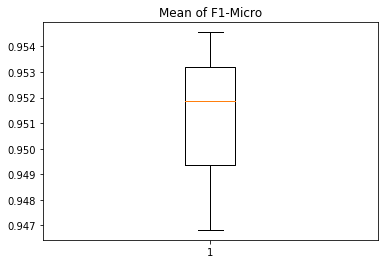

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1759 - categorical_accuracy: 0.0064
Epoch 2/100
156/156 [==============================] - 0s 233us/step - loss: 0.1576 - categorical_accuracy: 0.0128
Epoch 3/100
156/156 [==============================] - 0s 241us/step - loss: 0.0834 - categorical_accuracy: 0.0256
Epoch 4/100
156/156 [==============================] - 0s 245us/step - loss: 0.0603 - categorical_accuracy: 0.5064
Epoch 5/100
156/156 [==============================] - 0s 238us/step - loss: 0.0855 - categorical_accuracy: 0.4744
Epoch 6/100
156/156 [==============================] - 0s 217us/step - loss: 0.0820 - categorical_accuracy: 0.0000e+00
Epoch 7/100
156/156 [==============================] - 0s 226us/step - loss: 0.0665 - categorical_accuracy: 0.5000
Epoch 8/100
156/156 [==============================] - 0s 222us/step - loss: 0.0596 - categorical_accuracy: 0.4936
Epoch 9/100
156/156 [==============================] - 0s 232us/step - loss: 0

<Figure size 432x288 with 0 Axes>

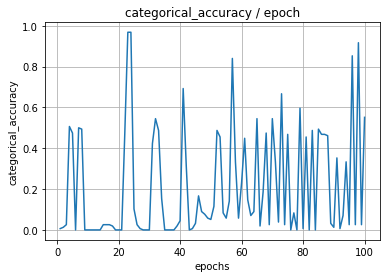

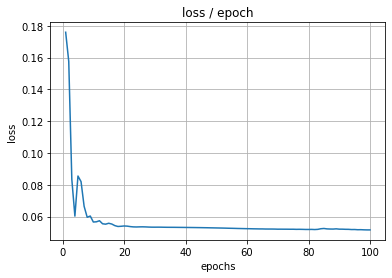

Classification algorithms: svm, Cluster Number: 2, Encoding Algorithm: relational_sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 0 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 1, 'estimator__kernel': 'linear'}




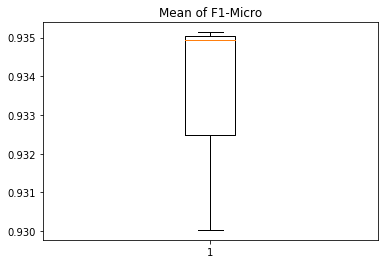

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1769 - categorical_accuracy: 0.0192
Epoch 2/100
156/156 [==============================] - 0s 230us/step - loss: 0.1753 - categorical_accuracy: 0.0256
Epoch 3/100
156/156 [==============================] - 0s 230us/step - loss: 0.1711 - categorical_accuracy: 0.0256
Epoch 4/100
156/156 [==============================] - 0s 241us/step - loss: 0.1587 - categorical_accuracy: 0.0256
Epoch 5/100
156/156 [==============================] - 0s 226us/step - loss: 0.1236 - categorical_accuracy: 0.0256
Epoch 6/100
156/156 [==============================] - 0s 229us/step - loss: 0.0690 - categorical_accuracy: 0.0256
Epoch 7/100
156/156 [==============================] - 0s 230us/step - loss: 0.0590 - categorical_accuracy: 0.0128
Epoch 8/100
156/156 [==============================] - 0s 227us/step - loss: 0.0652 - categorical_accuracy: 0.9679
Epoch 9/100
156/156 [==============================] - 0s 220us/step - loss: 0.062

<Figure size 432x288 with 0 Axes>

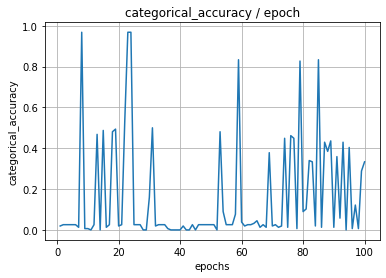

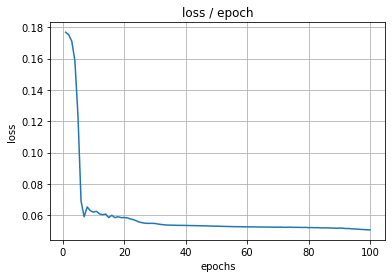

Classification algorithms: svm, Cluster Number: 2, Encoding Algorithm: sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 0 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 1, 'estimator__kernel': 'linear'}




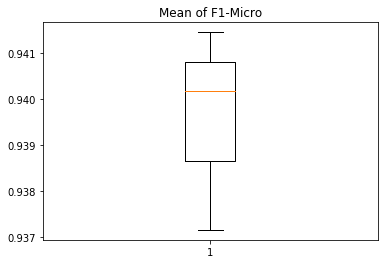

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1771 - categorical_accuracy: 0.4679
Epoch 2/100
156/156 [==============================] - 0s 334us/step - loss: 0.1770 - categorical_accuracy: 0.5000
Epoch 3/100
156/156 [==============================] - 0s 214us/step - loss: 0.1768 - categorical_accuracy: 0.9679
Epoch 4/100
156/156 [==============================] - 0s 215us/step - loss: 0.1767 - categorical_accuracy: 0.9679
Epoch 5/100
156/156 [==============================] - 0s 223us/step - loss: 0.1765 - categorical_accuracy: 0.9679
Epoch 6/100
156/156 [==============================] - 0s 219us/step - loss: 0.1764 - categorical_accuracy: 0.9679
Epoch 7/100
156/156 [==============================] - 0s 215us/step - loss: 0.1763 - categorical_accuracy: 0.9679
Epoch 8/100
156/156 [==============================] - 0s 211us/step - loss: 0.1761 - categorical_accuracy: 0.9679
Epoch 9/100
156/156 [==============================] - 0s 217us/step - loss: 0.176

<Figure size 432x288 with 0 Axes>

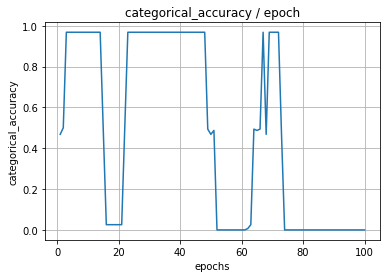

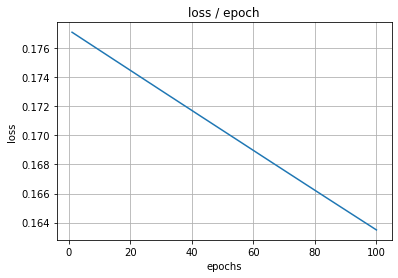

Classification algorithms: svm, Cluster Number: 3, Encoding Algorithm: basic_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 36 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 39 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 42 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 49 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 50 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 4, 'estimator__kernel': 'rbf'}




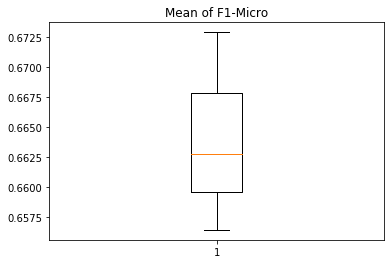

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 453us/step - loss: 0.1481 - categorical_accuracy: 0.0050
Epoch 2/100
801/801 [==============================] - 0s 226us/step - loss: 0.1301 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 221us/step - loss: 0.1267 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 221us/step - loss: 0.1255 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 219us/step - loss: 0.1246 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 217us/step - loss: 0.1250 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 223us/step - loss: 0.1244 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 220us/step - loss: 0.1245 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 218us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

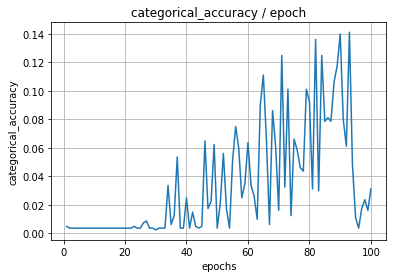

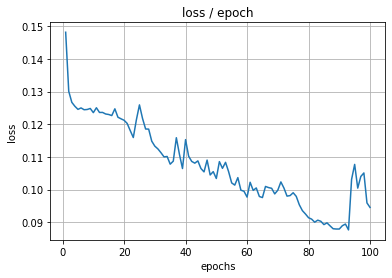

Classification algorithms: svm, Cluster Number: 3, Encoding Algorithm: relational_sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 36 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 39 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 42 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 49 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 50 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 2, 'estimator__kernel': 'rbf'}




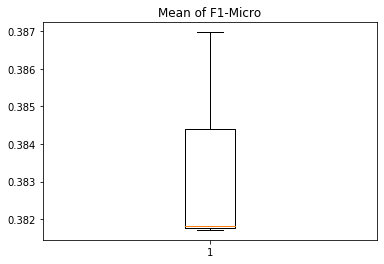

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 458us/step - loss: 0.1660 - categorical_accuracy: 0.0037
Epoch 2/100
801/801 [==============================] - 0s 226us/step - loss: 0.1347 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 225us/step - loss: 0.1274 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 216us/step - loss: 0.1258 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 216us/step - loss: 0.1255 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 216us/step - loss: 0.1264 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 217us/step - loss: 0.1257 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 214us/step - loss: 0.1253 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 218us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

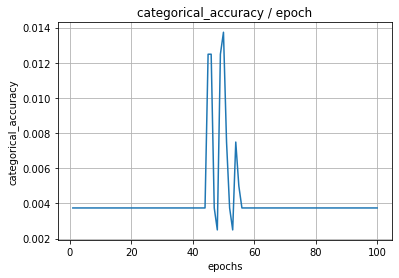

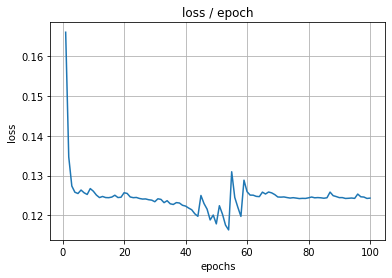

Classification algorithms: svm, Cluster Number: 3, Encoding Algorithm: sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 36 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 39 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 42 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 49 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 50 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 8, 'estimator__kernel': 'rbf'}




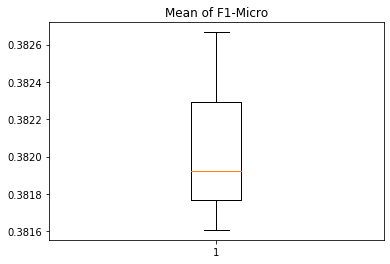

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 449us/step - loss: 0.1712 - categorical_accuracy: 0.0250
Epoch 2/100
801/801 [==============================] - 0s 229us/step - loss: 0.1708 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 229us/step - loss: 0.1703 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 220us/step - loss: 0.1699 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 219us/step - loss: 0.1695 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 220us/step - loss: 0.1691 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 221us/step - loss: 0.1687 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 217us/step - loss: 0.1683 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 220us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

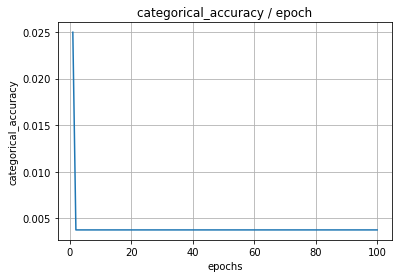

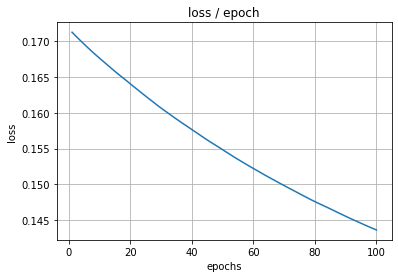

Classification algorithms: svm, Cluster Number: 4, Encoding Algorithm: basic_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 10 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 8, 'estimator__kernel': 'linear'}




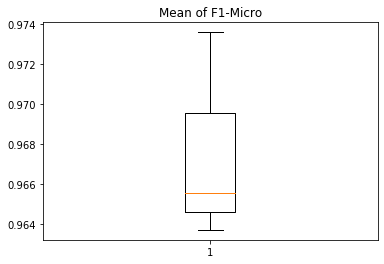

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1540 - categorical_accuracy: 0.0492
Epoch 2/100
61/61 [==============================] - 0s 261us/step - loss: 0.1519 - categorical_accuracy: 0.1967
Epoch 3/100
61/61 [==============================] - 0s 265us/step - loss: 0.1461 - categorical_accuracy: 0.0000e+00
Epoch 4/100
61/61 [==============================] - 0s 258us/step - loss: 0.1312 - categorical_accuracy: 0.0000e+00
Epoch 5/100
61/61 [==============================] - 0s 256us/step - loss: 0.0985 - categorical_accuracy: 0.0000e+00
Epoch 6/100
61/61 [==============================] - 0s 276us/step - loss: 0.0673 - categorical_accuracy: 0.0000e+00
Epoch 7/100
61/61 [==============================] - 0s 271us/step - loss: 0.0760 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 262us/step - loss: 0.0653 - categorical_accuracy: 0.0000e+00
Epoch 9/100
61/61 [==============================] - 0s 264us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

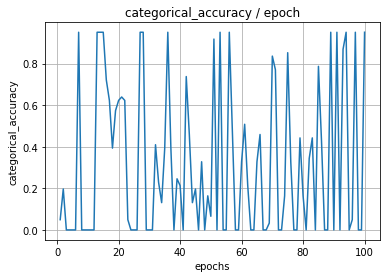

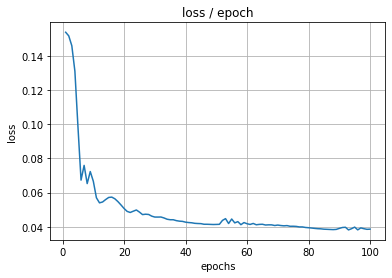

Classification algorithms: svm, Cluster Number: 4, Encoding Algorithm: relational_sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 10 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 8, 'estimator__kernel': 'rbf'}




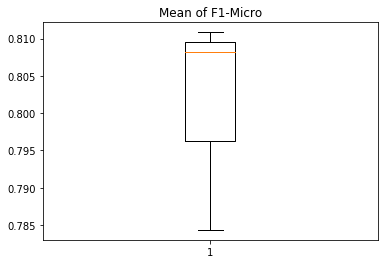

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 302us/step - loss: 0.1539 - categorical_accuracy: 0.2295
Epoch 3/100
61/61 [==============================] - 0s 260us/step - loss: 0.1533 - categorical_accuracy: 0.0000e+00
Epoch 4/100
61/61 [==============================] - 0s 263us/step - loss: 0.1526 - categorical_accuracy: 0.0000e+00
Epoch 5/100
61/61 [==============================] - 0s 270us/step - loss: 0.1514 - categorical_accuracy: 0.0000e+00
Epoch 6/100
61/61 [==============================] - 0s 262us/step - loss: 0.1495 - categorical_accuracy: 0.0000e+00
Epoch 7/100
61/61 [==============================] - 0s 246us/step - loss: 0.1464 - categorical_accuracy: 0.0000e+00
Epoch 8/100
61/61 [==============================] - 0s 262us/step - loss: 0.1411 - categorical_accuracy: 0.0000e+00
Epoch 9/100
61/61 [==============================] - 0s 254us/step - l

<Figure size 432x288 with 0 Axes>

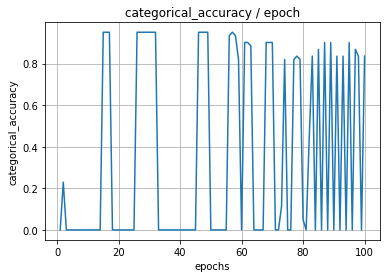

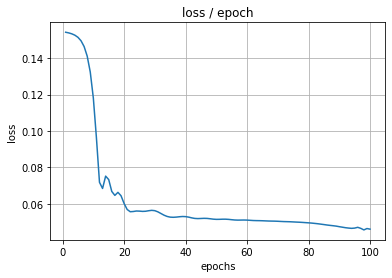

Classification algorithms: svm, Cluster Number: 4, Encoding Algorithm: sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 10 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 1, 'estimator__kernel': 'rbf'}




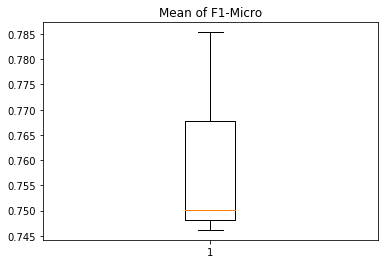

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 288us/step - loss: 0.1542 - categorical_accuracy: 0.9508
Epoch 3/100
61/61 [==============================] - 0s 257us/step - loss: 0.1541 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 252us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 250us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 250us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 249us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 250us/step - loss: 0.1538 - categorical_accuracy: 0.9508
Epoch 9/100
61/61 [==============================] - 0s 253us/step - loss: 0.1538 - categorica

<Figure size 432x288 with 0 Axes>

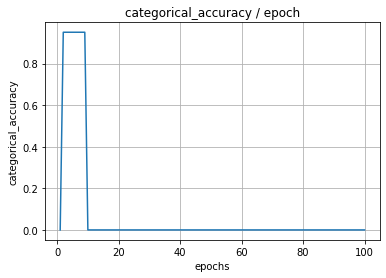

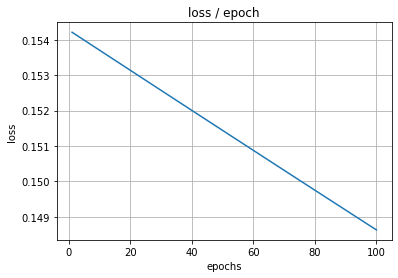

Classification algorithms: svm, Cluster Number: 5, Encoding Algorithm: basic_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 19 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-pa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 4, 'estimator__kernel': 'rbf'}




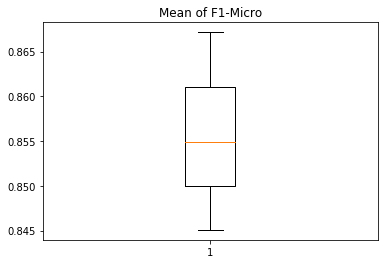

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 766us/step - loss: 0.1550 - categorical_accuracy: 0.0000e+00
Epoch 2/100
319/319 [==============================] - 0s 219us/step - loss: 0.1064 - categorical_accuracy: 0.3386
Epoch 3/100
319/319 [==============================] - 0s 210us/step - loss: 0.0964 - categorical_accuracy: 0.0000e+00
Epoch 4/100
319/319 [==============================] - 0s 208us/step - loss: 0.0872 - categorical_accuracy: 0.0000e+00
Epoch 5/100
319/319 [==============================] - 0s 205us/step - loss: 0.0842 - categorical_accuracy: 0.6928
Epoch 6/100
319/319 [==============================] - 0s 225us/step - loss: 0.0830 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 203us/step - loss: 0.0814 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 209us/step - loss: 0.0811 - categorical_accuracy: 0.6928
Epoch 9/100
319/319 [==============================] - 0s 20

<Figure size 432x288 with 0 Axes>

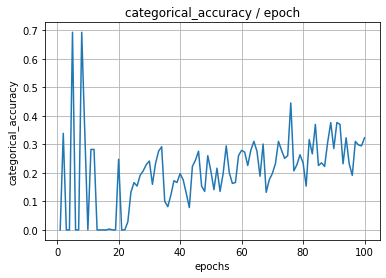

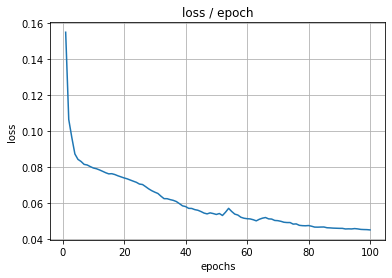

Classification algorithms: svm, Cluster Number: 5, Encoding Algorithm: relational_sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 19 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-pa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 2, 'estimator__kernel': 'rbf'}




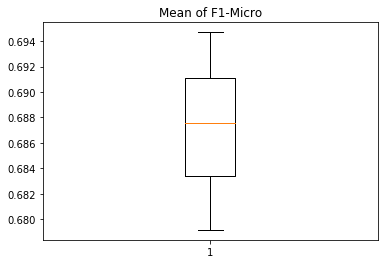

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 827us/step - loss: 0.1640 - categorical_accuracy: 0.5266
Epoch 2/100
319/319 [==============================] - 0s 213us/step - loss: 0.1587 - categorical_accuracy: 0.6928
Epoch 3/100
319/319 [==============================] - 0s 212us/step - loss: 0.1260 - categorical_accuracy: 0.6928
Epoch 4/100
319/319 [==============================] - 0s 206us/step - loss: 0.0995 - categorical_accuracy: 0.1724
Epoch 5/100
319/319 [==============================] - 0s 207us/step - loss: 0.0859 - categorical_accuracy: 0.0000e+00
Epoch 6/100
319/319 [==============================] - 0s 215us/step - loss: 0.0875 - categorical_accuracy: 0.3354
Epoch 7/100
319/319 [==============================] - 0s 207us/step - loss: 0.0836 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 214us/step - loss: 0.0828 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================] - 0s 211us/step

<Figure size 432x288 with 0 Axes>

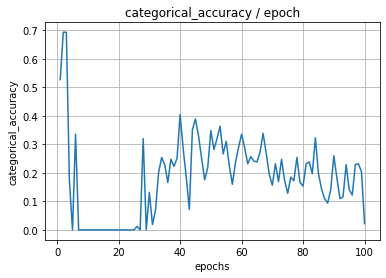

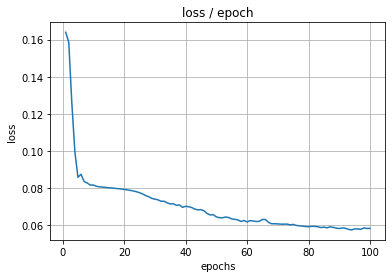

Classification algorithms: svm, Cluster Number: 5, Encoding Algorithm: sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 19 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-pa

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 1, 'estimator__kernel': 'rbf'}




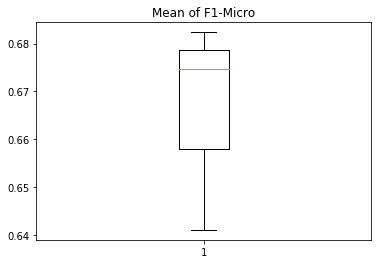

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 741us/step - loss: 0.1645 - categorical_accuracy: 0.3292
Epoch 2/100
319/319 [==============================] - 0s 206us/step - loss: 0.1643 - categorical_accuracy: 0.0000e+00
Epoch 3/100
319/319 [==============================] - 0s 209us/step - loss: 0.1641 - categorical_accuracy: 0.0000e+00
Epoch 4/100
319/319 [==============================] - 0s 225us/step - loss: 0.1639 - categorical_accuracy: 0.0000e+00
Epoch 5/100
319/319 [==============================] - 0s 204us/step - loss: 0.1637 - categorical_accuracy: 0.0000e+00
Epoch 6/100
319/319 [==============================] - 0s 209us/step - loss: 0.1634 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 210us/step - loss: 0.1632 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 210us/step - loss: 0.1630 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================]

<Figure size 432x288 with 0 Axes>

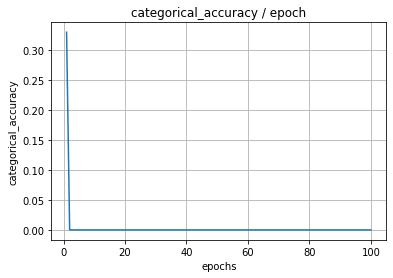

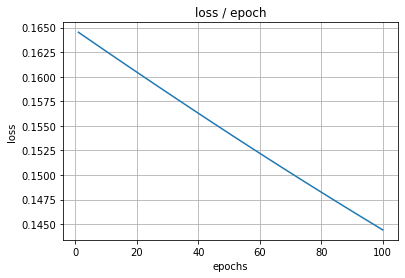

Classification algorithms: svm, Cluster Number: 6, Encoding Algorithm: basic_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 16 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 20 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 23 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 28 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 49 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 4, 'estimator__kernel': 'rbf'}




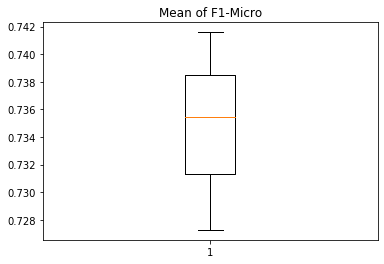

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 666us/step - loss: 0.1422 - categorical_accuracy: 0.2143
Epoch 2/100
420/420 [==============================] - 0s 261us/step - loss: 0.1114 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 242us/step - loss: 0.1067 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 240us/step - loss: 0.1048 - categorical_accuracy: 0.0000e+00
Epoch 5/100
420/420 [==============================] - 0s 233us/step - loss: 0.1031 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 230us/step - loss: 0.1015 - categorical_accuracy: 0.1571
Epoch 7/100
420/420 [==============================] - 0s 229us/step - loss: 0.0983 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 229us/step - loss: 0.0948 - categorical_accuracy: 0.0833
Epoch 9/100
420/420 [==============================] - 0s 23

<Figure size 432x288 with 0 Axes>

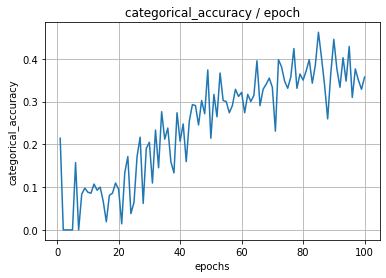

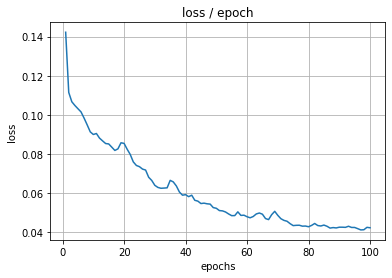

Classification algorithms: svm, Cluster Number: 6, Encoding Algorithm: relational_sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 16 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 20 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 23 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 28 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 49 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 8, 'estimator__kernel': 'rbf'}




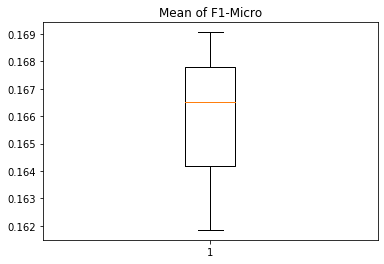

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 667us/step - loss: 0.1520 - categorical_accuracy: 0.0000e+00
Epoch 2/100
420/420 [==============================] - 0s 241us/step - loss: 0.1395 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 231us/step - loss: 0.1130 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 227us/step - loss: 0.1089 - categorical_accuracy: 0.0548
Epoch 5/100
420/420 [==============================] - 0s 231us/step - loss: 0.1068 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 232us/step - loss: 0.1065 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 231us/step - loss: 0.1057 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 227us/step - loss: 0.1057 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [==============================]

<Figure size 432x288 with 0 Axes>

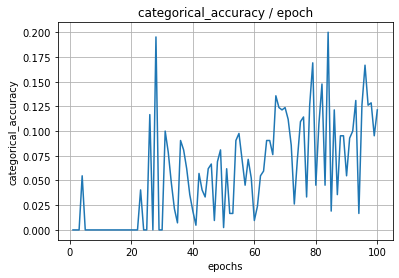

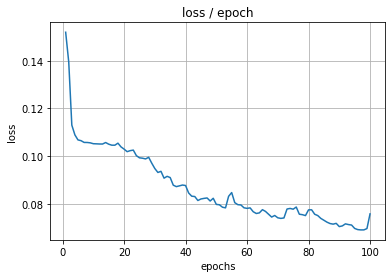

Classification algorithms: svm, Cluster Number: 6, Encoding Algorithm: sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 16 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 20 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 23 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 28 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 49 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 8, 'estimator__kernel': 'rbf'}




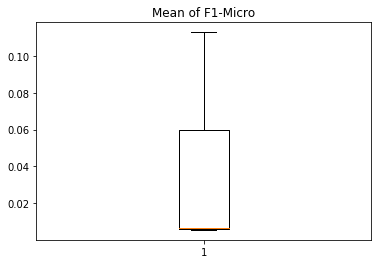

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 687us/step - loss: 0.1526 - categorical_accuracy: 0.0000e+00
Epoch 2/100
420/420 [==============================] - 0s 247us/step - loss: 0.1524 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 234us/step - loss: 0.1522 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 223us/step - loss: 0.1519 - categorical_accuracy: 0.0000e+00
Epoch 5/100
420/420 [==============================] - 0s 225us/step - loss: 0.1517 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 230us/step - loss: 0.1515 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 225us/step - loss: 0.1512 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 225us/step - loss: 0.1510 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [===========================

<Figure size 432x288 with 0 Axes>

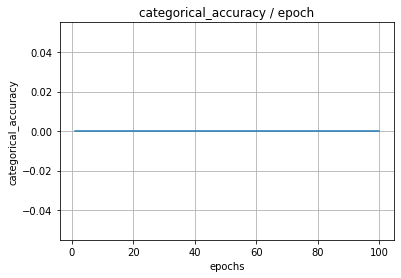

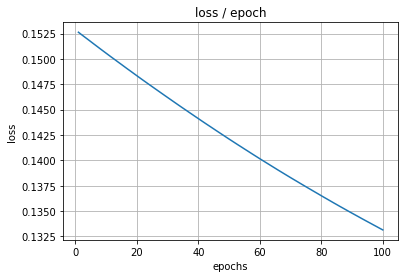

Classification algorithms: svm, Cluster Number: 7, Encoding Algorithm: basic_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 4 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 5 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packag

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 2, 'estimator__kernel': 'rbf'}




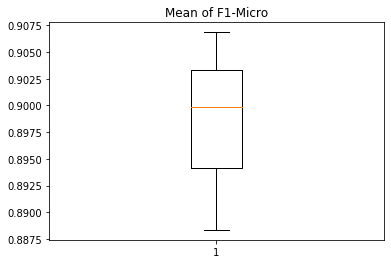

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1669 - categorical_accuracy: 0.0000e+00
Epoch 2/100
115/115 [==============================] - 0s 307us/step - loss: 0.1529 - categorical_accuracy: 0.0000e+00
Epoch 3/100
115/115 [==============================] - 0s 294us/step - loss: 0.1067 - categorical_accuracy: 0.0000e+00
Epoch 4/100
115/115 [==============================] - 0s 292us/step - loss: 0.1028 - categorical_accuracy: 0.6087
Epoch 5/100
115/115 [==============================] - 0s 280us/step - loss: 0.0831 - categorical_accuracy: 0.0000e+00
Epoch 6/100
115/115 [==============================] - 0s 304us/step - loss: 0.0881 - categorical_accuracy: 0.0000e+00
Epoch 7/100
115/115 [==============================] - 0s 269us/step - loss: 0.0861 - categorical_accuracy: 0.0000e+00
Epoch 8/100
115/115 [==============================] - 0s 275us/step - loss: 0.0810 - categorical_accuracy: 0.0000e+00
Epoch 9/100
115/115 [==============================] -

<Figure size 432x288 with 0 Axes>

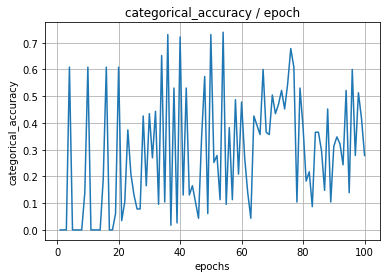

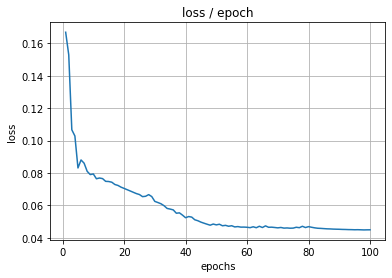

Classification algorithms: svm, Cluster Number: 7, Encoding Algorithm: relational_sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 4 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 5 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packag

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 8, 'estimator__kernel': 'rbf'}




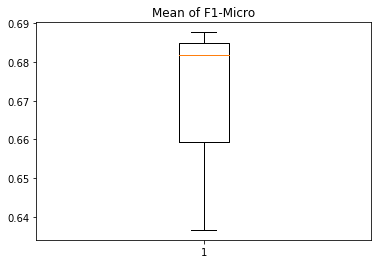

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1676 - categorical_accuracy: 0.1130
Epoch 2/100
115/115 [==============================] - 0s 289us/step - loss: 0.1666 - categorical_accuracy: 0.0000e+00
Epoch 3/100
115/115 [==============================] - 0s 281us/step - loss: 0.1643 - categorical_accuracy: 0.0000e+00
Epoch 4/100
115/115 [==============================] - 0s 284us/step - loss: 0.1576 - categorical_accuracy: 0.0000e+00
Epoch 5/100
115/115 [==============================] - 0s 275us/step - loss: 0.1391 - categorical_accuracy: 0.0000e+00
Epoch 6/100
115/115 [==============================] - 0s 268us/step - loss: 0.1005 - categorical_accuracy: 0.0000e+00
Epoch 7/100
115/115 [==============================] - 0s 278us/step - loss: 0.0996 - categorical_accuracy: 0.0000e+00
Epoch 8/100
115/115 [==============================] - 0s 278us/step - loss: 0.0936 - categorical_accuracy: 0.0000e+00
Epoch 9/100
115/115 [==============================] -

<Figure size 432x288 with 0 Axes>

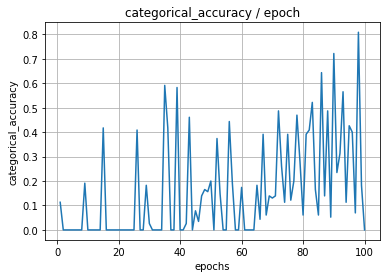

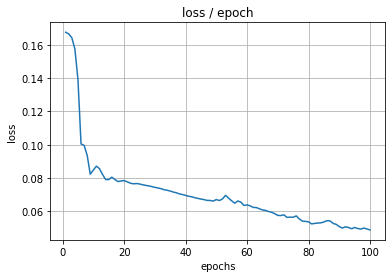

Classification algorithms: svm, Cluster Number: 7, Encoding Algorithm: sparse_AE
svm classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 4 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 5 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packag

svm Classifier best score for training data:
Best parameters for svm Classifier algorithms are: {'estimator__C': 1, 'estimator__kernel': 'linear'}




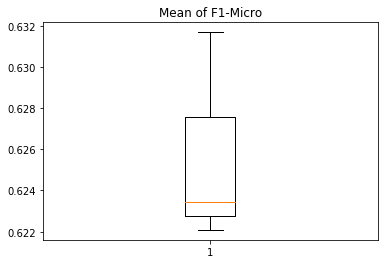

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1677 - categorical_accuracy: 0.2174
Epoch 2/100
115/115 [==============================] - 0s 284us/step - loss: 0.1676 - categorical_accuracy: 0.6087
Epoch 3/100
115/115 [==============================] - 0s 270us/step - loss: 0.1675 - categorical_accuracy: 0.6087
Epoch 4/100
115/115 [==============================] - 0s 273us/step - loss: 0.1674 - categorical_accuracy: 0.6087
Epoch 5/100
115/115 [==============================] - 0s 282us/step - loss: 0.1673 - categorical_accuracy: 0.6087
Epoch 6/100
115/115 [==============================] - 0s 271us/step - loss: 0.1672 - categorical_accuracy: 0.6087
Epoch 7/100
115/115 [==============================] - 0s 272us/step - loss: 0.1670 - categorical_accuracy: 0.6087
Epoch 8/100
115/115 [==============================] - 0s 275us/step - loss: 0.1669 - categorical_accuracy: 0.6087
Epoch 9/100
115/115 [==============================] - 0s 271us/step - loss: 0.166

<Figure size 432x288 with 0 Axes>

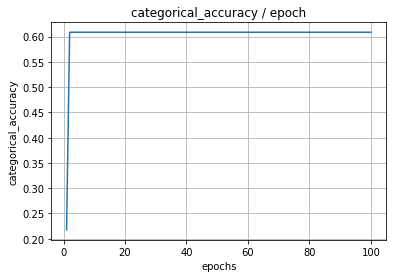

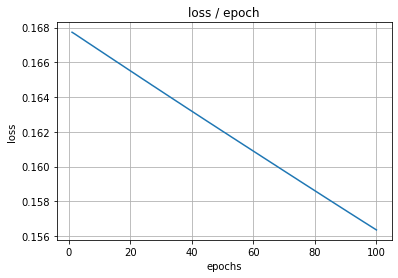

Classification algorithms: logistic_regression, Cluster Number: 0, Encoding Algorithm: basic_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all tr

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




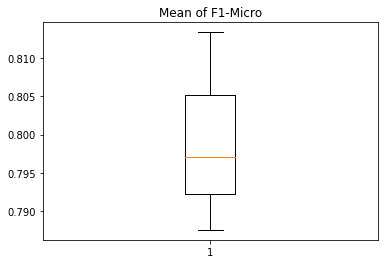

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 809us/step - loss: 0.1362 - categorical_accuracy: 0.0000e+00
Epoch 2/100
323/323 [==============================] - 0s 265us/step - loss: 0.0917 - categorical_accuracy: 0.0960
Epoch 3/100
323/323 [==============================] - 0s 258us/step - loss: 0.0842 - categorical_accuracy: 0.0000e+00
Epoch 4/100
323/323 [==============================] - 0s 241us/step - loss: 0.0803 - categorical_accuracy: 0.0805
Epoch 5/100
323/323 [==============================] - 0s 261us/step - loss: 0.0821 - categorical_accuracy: 0.3777
Epoch 6/100
323/323 [==============================] - 0s 229us/step - loss: 0.0783 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 243us/step - loss: 0.0784 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 249us/step - loss: 0.0773 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================] - 0s 23

<Figure size 432x288 with 0 Axes>

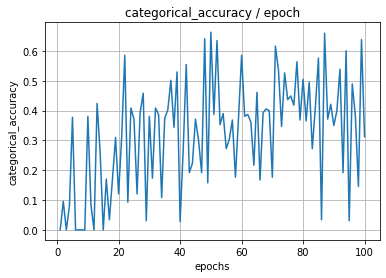

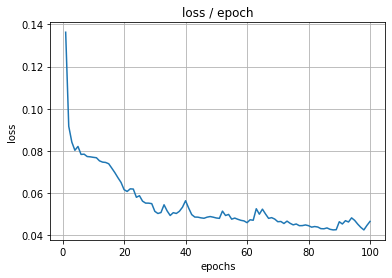

Classification algorithms: logistic_regression, Cluster Number: 0, Encoding Algorithm: relational_sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 20 is present in all training examples.
  str(classes[c]))
/storage/homefold

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 99 is present in all training examples.
  str(classes[c]))


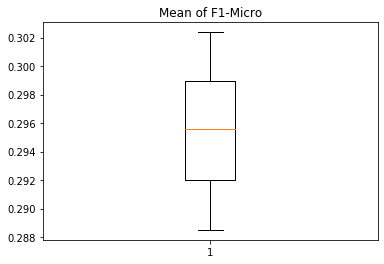

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 758us/step - loss: 0.1404 - categorical_accuracy: 0.2910
Epoch 2/100
323/323 [==============================] - 0s 232us/step - loss: 0.1336 - categorical_accuracy: 0.0000e+00
Epoch 3/100
323/323 [==============================] - 0s 240us/step - loss: 0.0940 - categorical_accuracy: 0.0000e+00
Epoch 4/100
323/323 [==============================] - 0s 236us/step - loss: 0.0835 - categorical_accuracy: 0.0712
Epoch 5/100
323/323 [==============================] - 0s 236us/step - loss: 0.0832 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 233us/step - loss: 0.0785 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 234us/step - loss: 0.0792 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 250us/step - loss: 0.0775 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================] - 0

<Figure size 432x288 with 0 Axes>

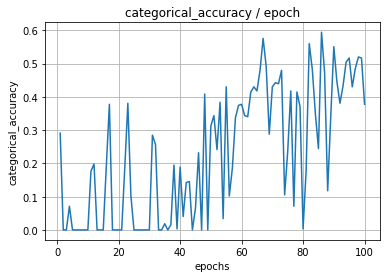

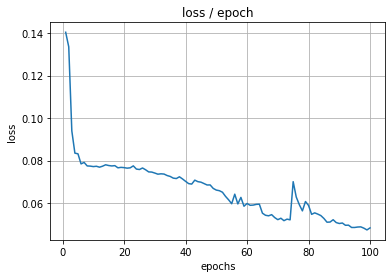

Classification algorithms: logistic_regression, Cluster Number: 0, Encoding Algorithm: sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 20 is present in all training examples.
  str(classes[c]))
/storage/homefold

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




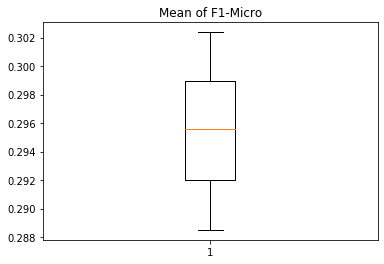

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
323/323 [==============================] - 0s 783us/step - loss: 0.1409 - categorical_accuracy: 0.1765
Epoch 2/100
323/323 [==============================] - 0s 241us/step - loss: 0.1406 - categorical_accuracy: 0.0000e+00
Epoch 3/100
323/323 [==============================] - 0s 234us/step - loss: 0.1404 - categorical_accuracy: 0.0000e+00
Epoch 4/100
323/323 [==============================] - 0s 235us/step - loss: 0.1402 - categorical_accuracy: 0.0000e+00
Epoch 5/100
323/323 [==============================] - 0s 231us/step - loss: 0.1400 - categorical_accuracy: 0.0000e+00
Epoch 6/100
323/323 [==============================] - 0s 230us/step - loss: 0.1398 - categorical_accuracy: 0.0000e+00
Epoch 7/100
323/323 [==============================] - 0s 236us/step - loss: 0.1396 - categorical_accuracy: 0.0000e+00
Epoch 8/100
323/323 [==============================] - 0s 233us/step - loss: 0.1393 - categorical_accuracy: 0.0000e+00
Epoch 9/100
323/323 [==============================]

<Figure size 432x288 with 0 Axes>

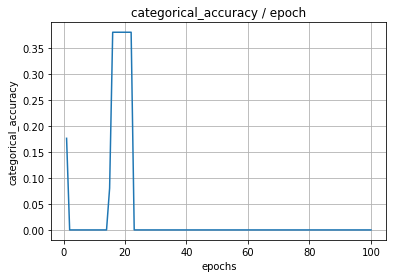

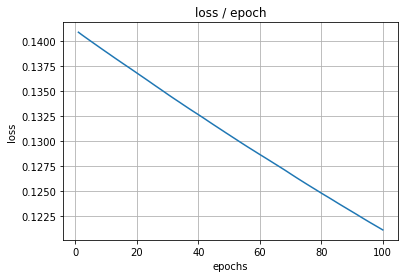

Classification algorithms: logistic_regression, Cluster Number: 1, Encoding Algorithm: basic_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 10 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/ho

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')


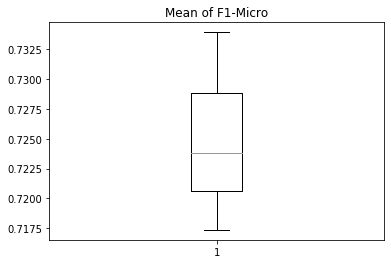

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 476us/step - loss: 0.1184 - categorical_accuracy: 0.6667
Epoch 2/100
801/801 [==============================] - 0s 227us/step - loss: 0.0996 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 222us/step - loss: 0.0962 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 217us/step - loss: 0.0932 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 215us/step - loss: 0.0922 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 220us/step - loss: 0.0917 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 213us/step - loss: 0.0913 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 212us/step - loss: 0.0905 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 211us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

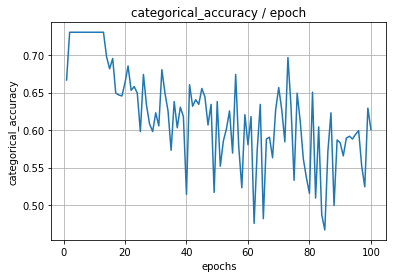

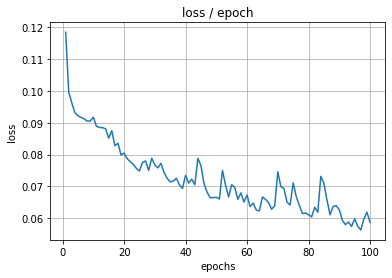

Classification algorithms: logistic_regression, Cluster Number: 1, Encoding Algorithm: relational_sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all tra

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




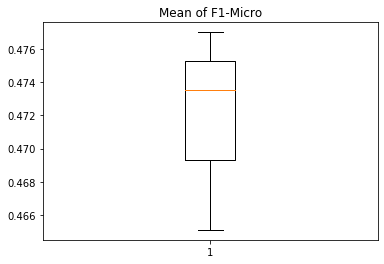

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 465us/step - loss: 0.1420 - categorical_accuracy: 0.6504
Epoch 2/100
801/801 [==============================] - 0s 233us/step - loss: 0.1041 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 225us/step - loss: 0.0952 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 227us/step - loss: 0.0933 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 222us/step - loss: 0.0927 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 228us/step - loss: 0.0930 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 221us/step - loss: 0.0927 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 220us/step - loss: 0.0926 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 225us/step - loss: 0.0

<Figure size 432x288 with 0 Axes>

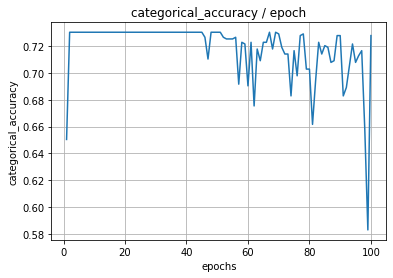

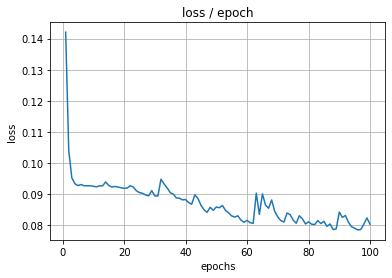

Classification algorithms: logistic_regression, Cluster Number: 1, Encoding Algorithm: sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all tra

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')


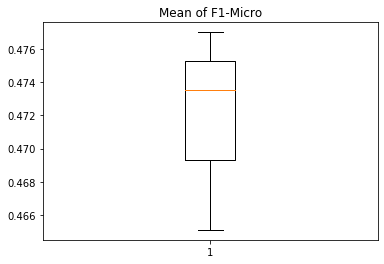

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 456us/step - loss: 0.1454 - categorical_accuracy: 0.1473
Epoch 2/100
801/801 [==============================] - 0s 233us/step - loss: 0.1450 - categorical_accuracy: 0.7303
Epoch 3/100
801/801 [==============================] - 0s 225us/step - loss: 0.1446 - categorical_accuracy: 0.7303
Epoch 4/100
801/801 [==============================] - 0s 222us/step - loss: 0.1442 - categorical_accuracy: 0.7303
Epoch 5/100
801/801 [==============================] - 0s 218us/step - loss: 0.1438 - categorical_accuracy: 0.7303
Epoch 6/100
801/801 [==============================] - 0s 223us/step - loss: 0.1435 - categorical_accuracy: 0.7303
Epoch 7/100
801/801 [==============================] - 0s 217us/step - loss: 0.1431 - categorical_accuracy: 0.7303
Epoch 8/100
801/801 [==============================] - 0s 219us/step - loss: 0.1427 - categorical_accuracy: 0.7303
Epoch 9/100
801/801 [==============================] - 0s 220us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

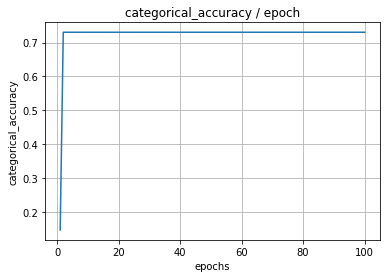

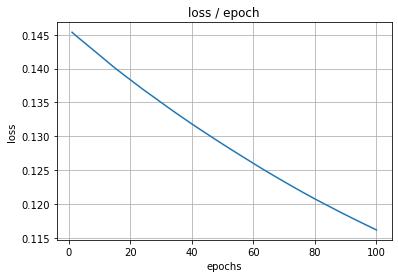

Classification algorithms: logistic_regression, Cluster Number: 2, Encoding Algorithm: basic_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 0 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 100 is present in all training examples.
  str(classes[c]))


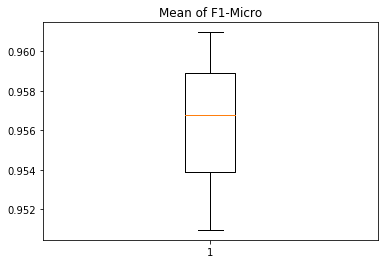

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1756 - categorical_accuracy: 0.0000e+00
Epoch 2/100
156/156 [==============================] - 0s 224us/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 3/100
156/156 [==============================] - 0s 225us/step - loss: 0.0839 - categorical_accuracy: 0.0000e+00
Epoch 4/100
156/156 [==============================] - 0s 230us/step - loss: 0.0682 - categorical_accuracy: 0.5128
Epoch 5/100
156/156 [==============================] - 0s 230us/step - loss: 0.0630 - categorical_accuracy: 0.1410
Epoch 6/100
156/156 [==============================] - 0s 226us/step - loss: 0.0667 - categorical_accuracy: 0.0192
Epoch 7/100
156/156 [==============================] - 0s 217us/step - loss: 0.0663 - categorical_accuracy: 0.9679
Epoch 8/100
156/156 [==============================] - 0s 224us/step - loss: 0.0595 - categorical_accuracy: 0.0192
Epoch 9/100
156/156 [==============================] - 0s 220us/step -

<Figure size 432x288 with 0 Axes>

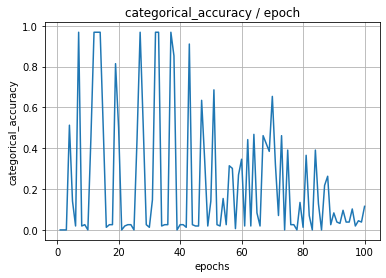

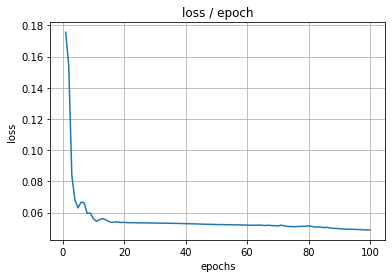

Classification algorithms: logistic_regression, Cluster Number: 2, Encoding Algorithm: relational_sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 0 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




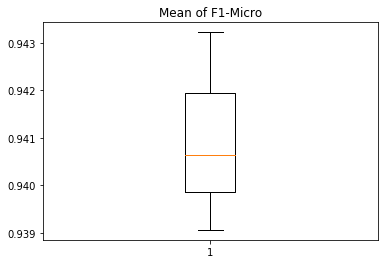

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1769 - categorical_accuracy: 0.5192
Epoch 2/100
156/156 [==============================] - 0s 204us/step - loss: 0.1753 - categorical_accuracy: 0.9679
Epoch 3/100
156/156 [==============================] - 0s 220us/step - loss: 0.1709 - categorical_accuracy: 0.9679
Epoch 4/100
156/156 [==============================] - 0s 209us/step - loss: 0.1579 - categorical_accuracy: 0.9679
Epoch 5/100
156/156 [==============================] - 0s 211us/step - loss: 0.1208 - categorical_accuracy: 0.9679
Epoch 6/100
156/156 [==============================] - 0s 217us/step - loss: 0.0648 - categorical_accuracy: 0.9679
Epoch 7/100
156/156 [==============================] - 0s 237us/step - loss: 0.0584 - categorical_accuracy: 0.4936
Epoch 8/100
156/156 [==============================] - 0s 233us/step - loss: 0.0605 - categorical_accuracy: 0.4615
Epoch 9/100
156/156 [==============================] - 0s 214us/step - loss: 0.061

<Figure size 432x288 with 0 Axes>

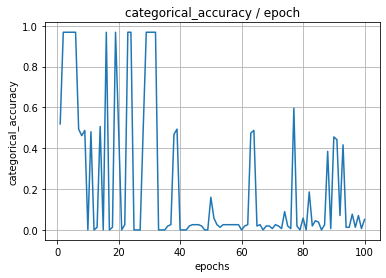

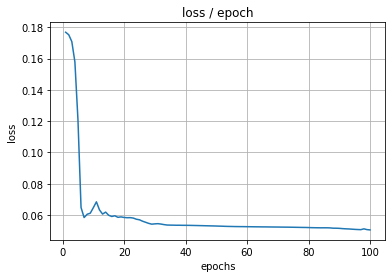

Classification algorithms: logistic_regression, Cluster Number: 2, Encoding Algorithm: sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 0 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packa

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 43 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 44 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 45 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 46 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 47 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

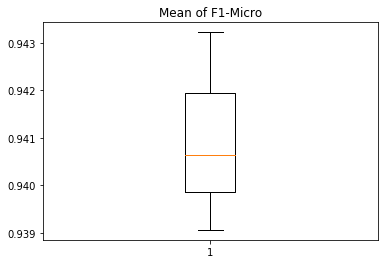

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
156/156 [==============================] - 0s 1ms/step - loss: 0.1771 - categorical_accuracy: 0.4615
Epoch 2/100
156/156 [==============================] - 0s 222us/step - loss: 0.1770 - categorical_accuracy: 0.0256
Epoch 3/100
156/156 [==============================] - 0s 222us/step - loss: 0.1768 - categorical_accuracy: 0.0256
Epoch 4/100
156/156 [==============================] - 0s 226us/step - loss: 0.1767 - categorical_accuracy: 0.0256
Epoch 5/100
156/156 [==============================] - 0s 222us/step - loss: 0.1765 - categorical_accuracy: 0.0256
Epoch 6/100
156/156 [==============================] - 0s 215us/step - loss: 0.1764 - categorical_accuracy: 0.0256
Epoch 7/100
156/156 [==============================] - 0s 221us/step - loss: 0.1763 - categorical_accuracy: 0.0256
Epoch 8/100
156/156 [==============================] - 0s 216us/step - loss: 0.1761 - categorical_accuracy: 0.0256
Epoch 9/100
156/156 [==============================] - 0s 224us/step - loss: 0.176

<Figure size 432x288 with 0 Axes>

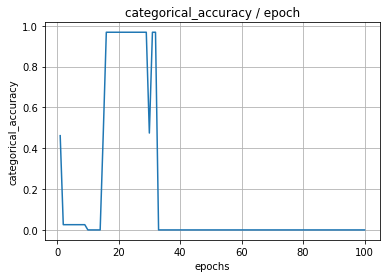

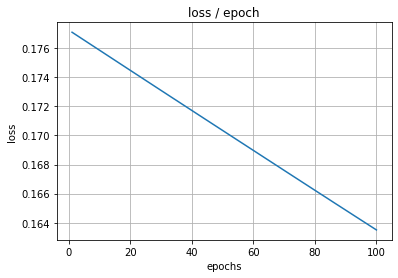

Classification algorithms: logistic_regression, Cluster Number: 3, Encoding Algorithm: basic_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search alg

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'sag'}




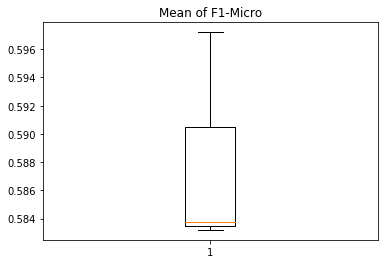

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 459us/step - loss: 0.1467 - categorical_accuracy: 0.0050
Epoch 2/100
801/801 [==============================] - 0s 218us/step - loss: 0.1282 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 223us/step - loss: 0.1257 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 224us/step - loss: 0.1260 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 216us/step - loss: 0.1330 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 215us/step - loss: 0.1258 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 211us/step - loss: 0.1250 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 215us/step - loss: 0.1246 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 216us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

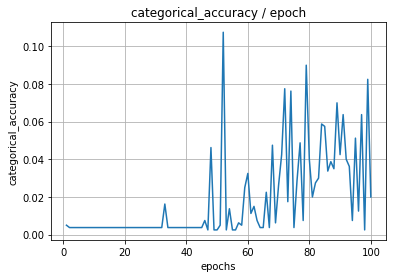

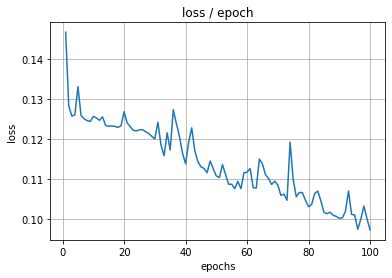

Classification algorithms: logistic_regression, Cluster Number: 3, Encoding Algorithm: relational_sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search alg

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




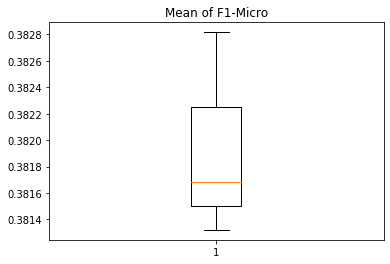

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 463us/step - loss: 0.1674 - categorical_accuracy: 0.0050
Epoch 2/100
801/801 [==============================] - 0s 220us/step - loss: 0.1320 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 219us/step - loss: 0.1255 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 236us/step - loss: 0.1253 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 236us/step - loss: 0.1252 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 223us/step - loss: 0.1258 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 223us/step - loss: 0.1254 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 214us/step - loss: 0.1248 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 214us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

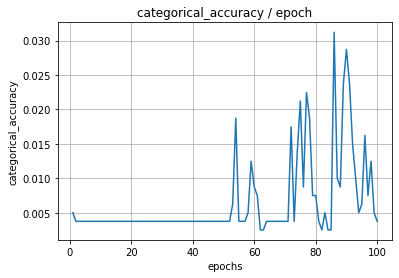

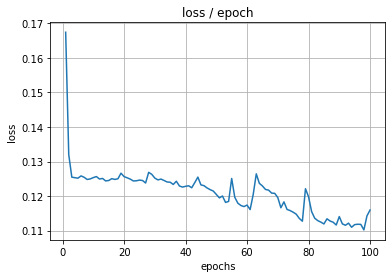

Classification algorithms: logistic_regression, Cluster Number: 3, Encoding Algorithm: sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search alg

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




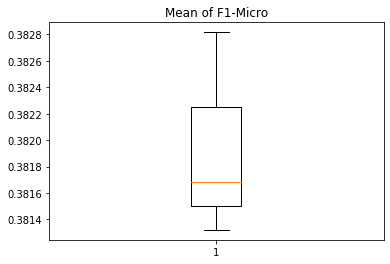

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
801/801 [==============================] - 0s 464us/step - loss: 0.1712 - categorical_accuracy: 0.0162
Epoch 2/100
801/801 [==============================] - 0s 232us/step - loss: 0.1708 - categorical_accuracy: 0.0037
Epoch 3/100
801/801 [==============================] - 0s 226us/step - loss: 0.1704 - categorical_accuracy: 0.0037
Epoch 4/100
801/801 [==============================] - 0s 220us/step - loss: 0.1699 - categorical_accuracy: 0.0037
Epoch 5/100
801/801 [==============================] - 0s 218us/step - loss: 0.1695 - categorical_accuracy: 0.0037
Epoch 6/100
801/801 [==============================] - 0s 214us/step - loss: 0.1691 - categorical_accuracy: 0.0037
Epoch 7/100
801/801 [==============================] - 0s 214us/step - loss: 0.1688 - categorical_accuracy: 0.0037
Epoch 8/100
801/801 [==============================] - 0s 217us/step - loss: 0.1684 - categorical_accuracy: 0.0037
Epoch 9/100
801/801 [==============================] - 0s 215us/step - loss: 0.1

<Figure size 432x288 with 0 Axes>

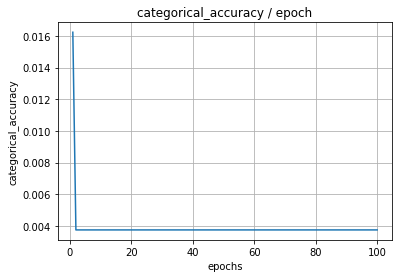

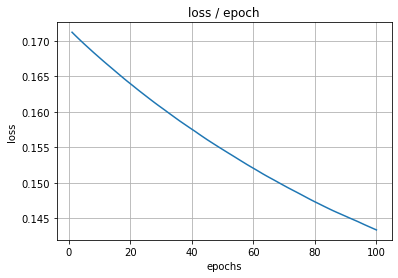

Classification algorithms: logistic_regression, Cluster Number: 4, Encoding Algorithm: basic_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




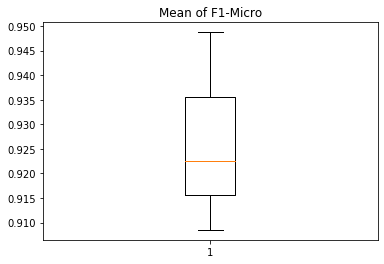

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 293us/step - loss: 0.1526 - categorical_accuracy: 0.0984
Epoch 3/100
61/61 [==============================] - 0s 270us/step - loss: 0.1484 - categorical_accuracy: 0.0000e+00
Epoch 4/100
61/61 [==============================] - 0s 258us/step - loss: 0.1378 - categorical_accuracy: 0.0000e+00
Epoch 5/100
61/61 [==============================] - 0s 262us/step - loss: 0.1137 - categorical_accuracy: 0.0000e+00
Epoch 6/100
61/61 [==============================] - 0s 271us/step - loss: 0.0761 - categorical_accuracy: 0.0000e+00
Epoch 7/100
61/61 [==============================] - 0s 249us/step - loss: 0.0862 - categorical_accuracy: 0.0000e+00
Epoch 8/100
61/61 [==============================] - 0s 253us/step - loss: 0.0822 - categorical_accuracy: 0.9508
Epoch 9/100
61/61 [==============================] - 0s 249us/step - loss:

<Figure size 432x288 with 0 Axes>

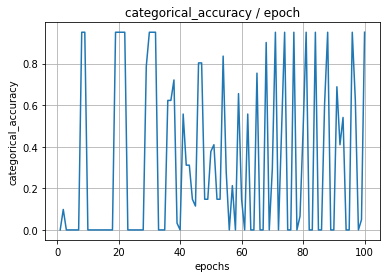

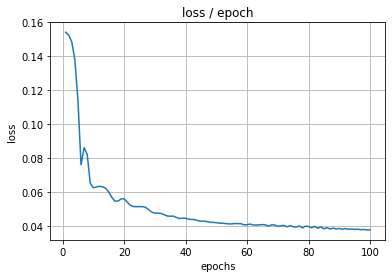

Classification algorithms: logistic_regression, Cluster Number: 4, Encoding Algorithm: relational_sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 10 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packa

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




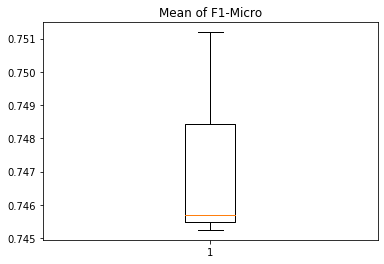

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 304us/step - loss: 0.1539 - categorical_accuracy: 0.0000e+00
Epoch 3/100
61/61 [==============================] - 0s 290us/step - loss: 0.1534 - categorical_accuracy: 0.0000e+00
Epoch 4/100
61/61 [==============================] - 0s 256us/step - loss: 0.1527 - categorical_accuracy: 0.0000e+00
Epoch 5/100
61/61 [==============================] - 0s 258us/step - loss: 0.1516 - categorical_accuracy: 0.0000e+00
Epoch 6/100
61/61 [==============================] - 0s 258us/step - loss: 0.1500 - categorical_accuracy: 0.0000e+00
Epoch 7/100
61/61 [==============================] - 0s 240us/step - loss: 0.1473 - categorical_accuracy: 0.0000e+00
Epoch 8/100
61/61 [==============================] - 0s 243us/step - loss: 0.1429 - categorical_accuracy: 0.0000e+00
Epoch 9/100
61/61 [==============================] - 0s 243us/step

<Figure size 432x288 with 0 Axes>

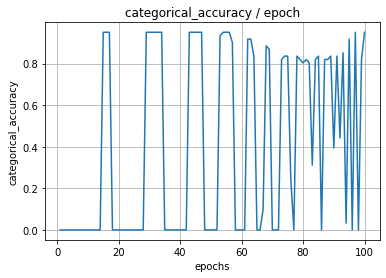

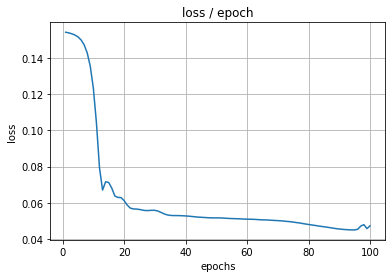

Classification algorithms: logistic_regression, Cluster Number: 4, Encoding Algorithm: sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 2 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 10 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packa

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




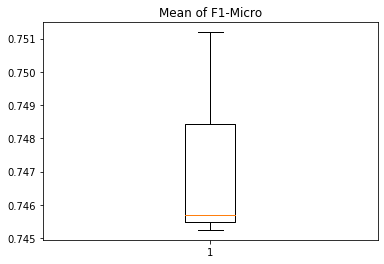

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
61/61 [==============================] - 0s 3ms/step - loss: 0.1542 - categorical_accuracy: 0.0000e+00
Epoch 2/100
61/61 [==============================] - 0s 277us/step - loss: 0.1542 - categorical_accuracy: 0.9508
Epoch 3/100
61/61 [==============================] - 0s 290us/step - loss: 0.1541 - categorical_accuracy: 0.9508
Epoch 4/100
61/61 [==============================] - 0s 264us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 5/100
61/61 [==============================] - 0s 262us/step - loss: 0.1540 - categorical_accuracy: 0.9508
Epoch 6/100
61/61 [==============================] - 0s 254us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 7/100
61/61 [==============================] - 0s 248us/step - loss: 0.1539 - categorical_accuracy: 0.9508
Epoch 8/100
61/61 [==============================] - 0s 260us/step - loss: 0.1538 - categorical_accuracy: 0.9508
Epoch 9/100
61/61 [==============================] - 0s 252us/step - loss: 0.1538 - categorica

<Figure size 432x288 with 0 Axes>

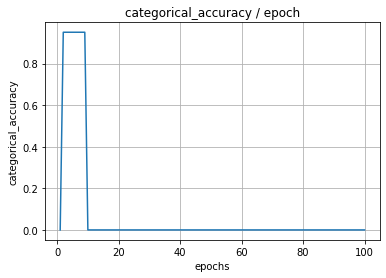

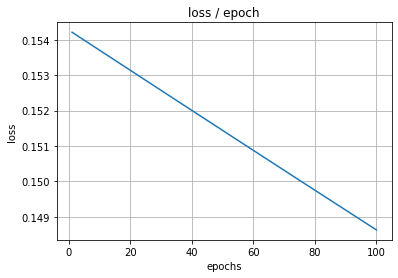

Classification algorithms: logistic_regression, Cluster Number: 5, Encoding Algorithm: basic_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolde

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')


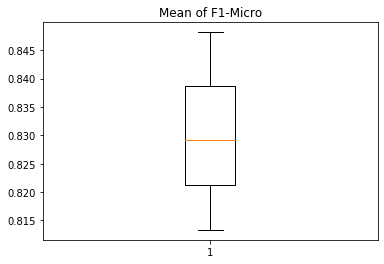

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 825us/step - loss: 0.1511 - categorical_accuracy: 0.0219
Epoch 2/100
319/319 [==============================] - 0s 223us/step - loss: 0.0980 - categorical_accuracy: 0.1787
Epoch 3/100
319/319 [==============================] - 0s 215us/step - loss: 0.0908 - categorical_accuracy: 0.0000e+00
Epoch 4/100
319/319 [==============================] - 0s 217us/step - loss: 0.0863 - categorical_accuracy: 0.3323
Epoch 5/100
319/319 [==============================] - 0s 212us/step - loss: 0.0845 - categorical_accuracy: 0.1599
Epoch 6/100
319/319 [==============================] - 0s 217us/step - loss: 0.0827 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 219us/step - loss: 0.0826 - categorical_accuracy: 0.5110
Epoch 8/100
319/319 [==============================] - 0s 204us/step - loss: 0.0805 - categorical_accuracy: 0.1787
Epoch 9/100
319/319 [==============================] - 0s 208us/step - l

<Figure size 432x288 with 0 Axes>

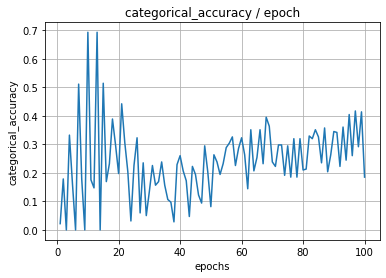

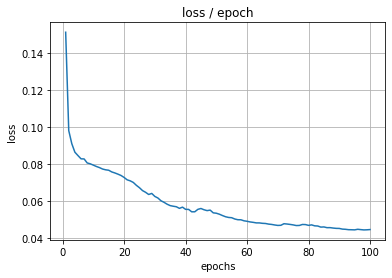

Classification algorithms: logistic_regression, Cluster Number: 5, Encoding Algorithm: relational_sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 19 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-pa

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




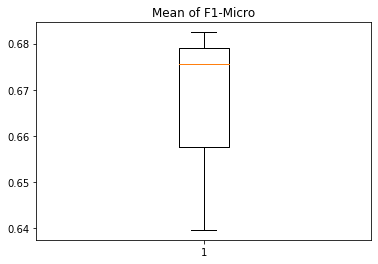

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 798us/step - loss: 0.1640 - categorical_accuracy: 0.0000e+00
Epoch 2/100
319/319 [==============================] - 0s 213us/step - loss: 0.1583 - categorical_accuracy: 0.0000e+00
Epoch 3/100
319/319 [==============================] - 0s 201us/step - loss: 0.1215 - categorical_accuracy: 0.0000e+00
Epoch 4/100
319/319 [==============================] - 0s 201us/step - loss: 0.0951 - categorical_accuracy: 0.3511
Epoch 5/100
319/319 [==============================] - 0s 206us/step - loss: 0.0880 - categorical_accuracy: 0.1661
Epoch 6/100
319/319 [==============================] - 0s 199us/step - loss: 0.0861 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 211us/step - loss: 0.0835 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 206us/step - loss: 0.0817 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================] - 0

<Figure size 432x288 with 0 Axes>

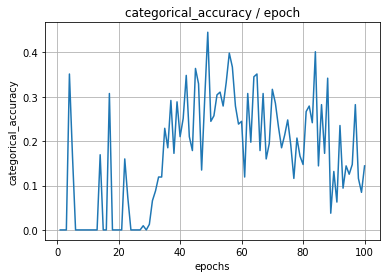

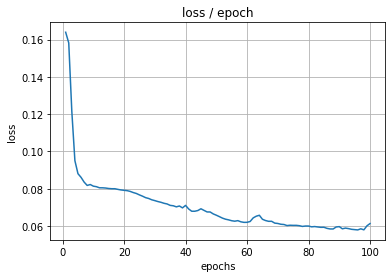

Classification algorithms: logistic_regression, Cluster Number: 5, Encoding Algorithm: sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 8 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 11 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 12 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 13 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 19 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-pa

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




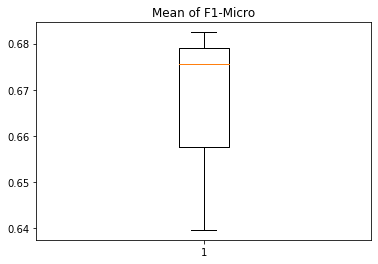

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
319/319 [==============================] - 0s 738us/step - loss: 0.1645 - categorical_accuracy: 0.1881
Epoch 2/100
319/319 [==============================] - 0s 205us/step - loss: 0.1643 - categorical_accuracy: 0.0000e+00
Epoch 3/100
319/319 [==============================] - 0s 202us/step - loss: 0.1641 - categorical_accuracy: 0.0000e+00
Epoch 4/100
319/319 [==============================] - 0s 202us/step - loss: 0.1639 - categorical_accuracy: 0.0000e+00
Epoch 5/100
319/319 [==============================] - 0s 200us/step - loss: 0.1637 - categorical_accuracy: 0.0000e+00
Epoch 6/100
319/319 [==============================] - 0s 200us/step - loss: 0.1635 - categorical_accuracy: 0.0000e+00
Epoch 7/100
319/319 [==============================] - 0s 203us/step - loss: 0.1632 - categorical_accuracy: 0.0000e+00
Epoch 8/100
319/319 [==============================] - 0s 202us/step - loss: 0.1630 - categorical_accuracy: 0.0000e+00
Epoch 9/100
319/319 [==============================]

<Figure size 432x288 with 0 Axes>

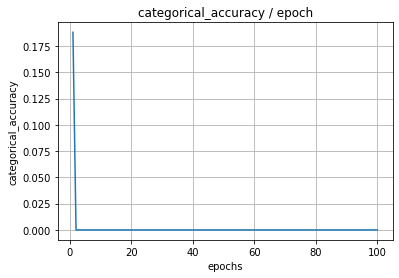

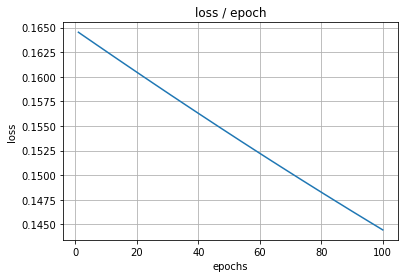

Classification algorithms: logistic_regression, Cluster Number: 6, Encoding Algorithm: basic_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search alg

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'saga'}




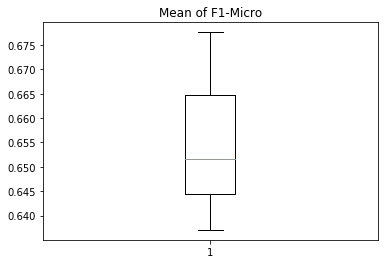

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 688us/step - loss: 0.1431 - categorical_accuracy: 0.0000e+00
Epoch 2/100
420/420 [==============================] - 0s 237us/step - loss: 0.1130 - categorical_accuracy: 0.2643
Epoch 3/100
420/420 [==============================] - ETA: 0s - loss: 0.1077 - categorical_accuracy: 0.0000e+ - 0s 235us/step - loss: 0.1074 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 233us/step - loss: 0.1051 - categorical_accuracy: 0.0548
Epoch 5/100
420/420 [==============================] - 0s 230us/step - loss: 0.1034 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 225us/step - loss: 0.1025 - categorical_accuracy: 0.2095
Epoch 7/100
420/420 [==============================] - 0s 224us/step - loss: 0.1009 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 230us/step - loss: 0.0985 - categorical_accuracy: 0.0000e+00
Ep

<Figure size 432x288 with 0 Axes>

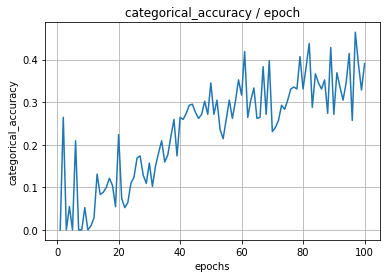

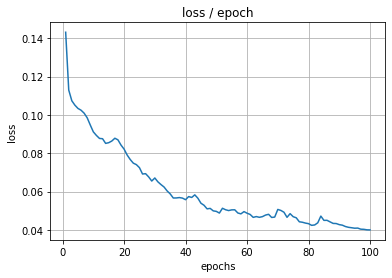

Classification algorithms: logistic_regression, Cluster Number: 6, Encoding Algorithm: relational_sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search alg

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




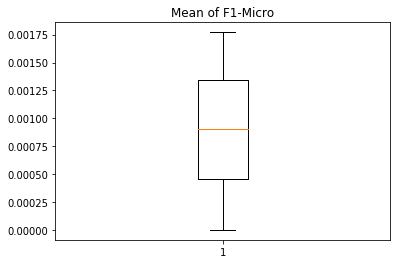

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 653us/step - loss: 0.1520 - categorical_accuracy: 0.0000e+00
Epoch 2/100
420/420 [==============================] - 0s 229us/step - loss: 0.1378 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 225us/step - loss: 0.1125 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 224us/step - loss: 0.1097 - categorical_accuracy: 0.0000e+00
Epoch 5/100
420/420 [==============================] - 0s 227us/step - loss: 0.1070 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 226us/step - loss: 0.1057 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 226us/step - loss: 0.1057 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 224us/step - loss: 0.1057 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [===========================

<Figure size 432x288 with 0 Axes>

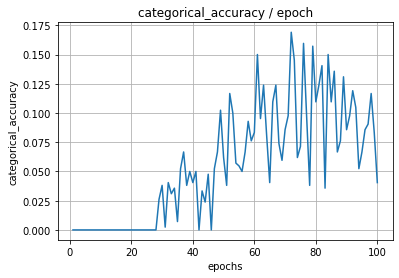

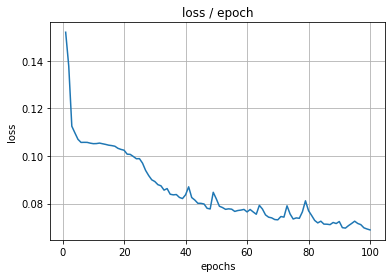

Classification algorithms: logistic_regression, Cluster Number: 6, Encoding Algorithm: sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 16 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 20 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 23 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 28 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 49 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-p

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




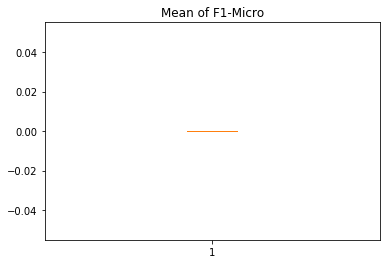

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
420/420 [==============================] - 0s 608us/step - loss: 0.1526 - categorical_accuracy: 0.0048
Epoch 2/100
420/420 [==============================] - 0s 219us/step - loss: 0.1524 - categorical_accuracy: 0.0000e+00
Epoch 3/100
420/420 [==============================] - 0s 223us/step - loss: 0.1522 - categorical_accuracy: 0.0000e+00
Epoch 4/100
420/420 [==============================] - 0s 224us/step - loss: 0.1519 - categorical_accuracy: 0.0000e+00
Epoch 5/100
420/420 [==============================] - 0s 218us/step - loss: 0.1517 - categorical_accuracy: 0.0000e+00
Epoch 6/100
420/420 [==============================] - 0s 231us/step - loss: 0.1515 - categorical_accuracy: 0.0000e+00
Epoch 7/100
420/420 [==============================] - 0s 225us/step - loss: 0.1512 - categorical_accuracy: 0.0000e+00
Epoch 8/100
420/420 [==============================] - 0s 225us/step - loss: 0.1510 - categorical_accuracy: 0.0000e+00
Epoch 9/100
420/420 [==============================]

<Figure size 432x288 with 0 Axes>

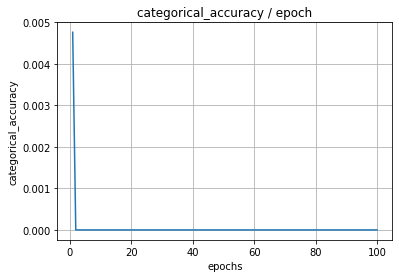

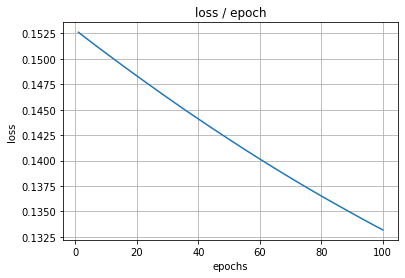

Classification algorithms: logistic_regression, Cluster Number: 7, Encoding Algorithm: basic_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 4 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 5 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packag

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/scipy/optimize/linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn('Line Search failed')


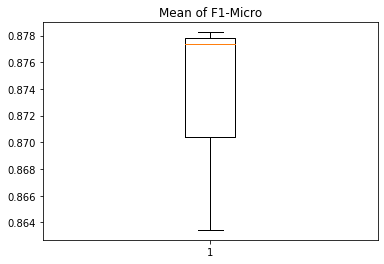

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1672 - categorical_accuracy: 0.0522
Epoch 2/100
115/115 [==============================] - 0s 283us/step - loss: 0.1572 - categorical_accuracy: 0.0000e+00
Epoch 3/100
115/115 [==============================] - 0s 281us/step - loss: 0.1105 - categorical_accuracy: 0.0000e+00
Epoch 4/100
115/115 [==============================] - 0s 312us/step - loss: 0.1016 - categorical_accuracy: 0.4261
Epoch 5/100
115/115 [==============================] - 0s 302us/step - loss: 0.0843 - categorical_accuracy: 0.0000e+00
Epoch 6/100
115/115 [==============================] - 0s 300us/step - loss: 0.0858 - categorical_accuracy: 0.0000e+00
Epoch 7/100
115/115 [==============================] - 0s 287us/step - loss: 0.0848 - categorical_accuracy: 0.0000e+00
Epoch 8/100
115/115 [==============================] - 0s 324us/step - loss: 0.0800 - categorical_accuracy: 0.0000e+00
Epoch 9/100
115/115 [==============================] - 0s 

<Figure size 432x288 with 0 Axes>

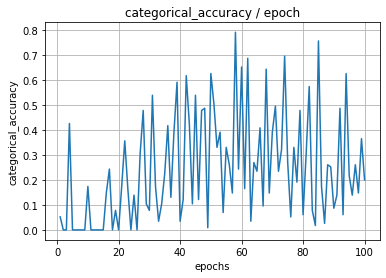

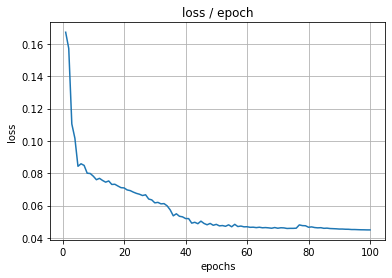

Classification algorithms: logistic_regression, Cluster Number: 7, Encoding Algorithm: relational_sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 4 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 5 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packag

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




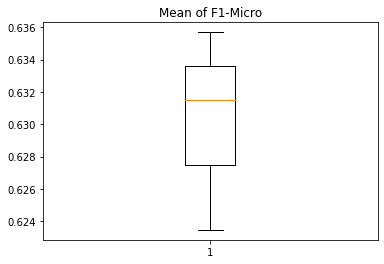

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1676 - categorical_accuracy: 0.0000e+00
Epoch 2/100
115/115 [==============================] - 0s 276us/step - loss: 0.1663 - categorical_accuracy: 0.0000e+00
Epoch 3/100
115/115 [==============================] - 0s 257us/step - loss: 0.1630 - categorical_accuracy: 0.0000e+00
Epoch 4/100
115/115 [==============================] - 0s 263us/step - loss: 0.1534 - categorical_accuracy: 0.0000e+00
Epoch 5/100
115/115 [==============================] - 0s 256us/step - loss: 0.1259 - categorical_accuracy: 0.0000e+00
Epoch 6/100
115/115 [==============================] - 0s 264us/step - loss: 0.0929 - categorical_accuracy: 0.0000e+00
Epoch 7/100
115/115 [==============================] - 0s 261us/step - loss: 0.1046 - categorical_accuracy: 0.6087
Epoch 8/100
115/115 [==============================] - 0s 267us/step - loss: 0.0888 - categorical_accuracy: 0.6087
Epoch 9/100
115/115 [==============================] - 0s 

<Figure size 432x288 with 0 Axes>

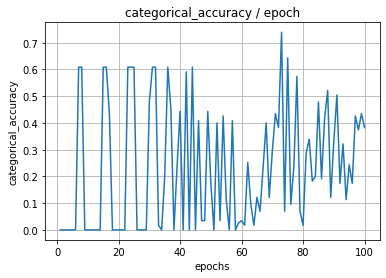

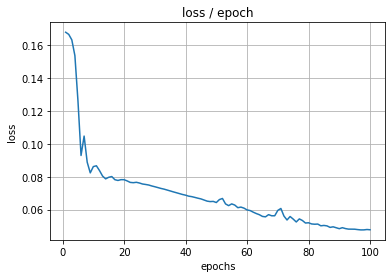

Classification algorithms: logistic_regression, Cluster Number: 7, Encoding Algorithm: sparse_AE
logistic_regression classification algorithm and parameter tuning based on 5-fold cross validation


/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 1 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 3 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 4 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 5 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/sklearn/multiclass.py:75: UserWarning: Label not 6 is present in all training examples.
  str(classes[c]))
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packag

logistic_regression Classifier best score for training data:
Best parameters for logistic_regression Classifier algorithms are: {'estimator__penalty': 'l2', 'estimator__solver': 'newton-cg'}




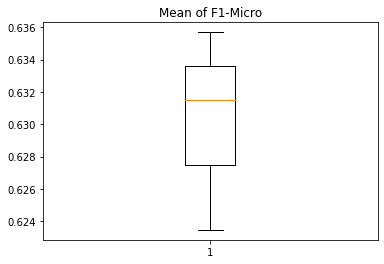

/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=1000, units=550)`
  if __name__ == '__main__':
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # Remove the CWD from sys.path while we load stuff.
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  # This is added back by InteractiveShellApp.init_path()
/storage/homefolders/nader/workspace/projects/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=550)`
  if sys.path[0] == '':
/storage/homefolders

Epoch 1/100
115/115 [==============================] - 0s 2ms/step - loss: 0.1677 - categorical_accuracy: 0.2000
Epoch 2/100
115/115 [==============================] - 0s 255us/step - loss: 0.1676 - categorical_accuracy: 0.6087
Epoch 3/100
115/115 [==============================] - 0s 256us/step - loss: 0.1675 - categorical_accuracy: 0.6087
Epoch 4/100
115/115 [==============================] - 0s 263us/step - loss: 0.1674 - categorical_accuracy: 0.6087
Epoch 5/100
115/115 [==============================] - 0s 263us/step - loss: 0.1673 - categorical_accuracy: 0.6087
Epoch 6/100
115/115 [==============================] - 0s 251us/step - loss: 0.1671 - categorical_accuracy: 0.6087
Epoch 7/100
115/115 [==============================] - 0s 262us/step - loss: 0.1670 - categorical_accuracy: 0.6087
Epoch 8/100
115/115 [==============================] - 0s 258us/step - loss: 0.1669 - categorical_accuracy: 0.6087
Epoch 9/100
115/115 [==============================] - 0s 254us/step - loss: 0.166

<Figure size 432x288 with 0 Axes>

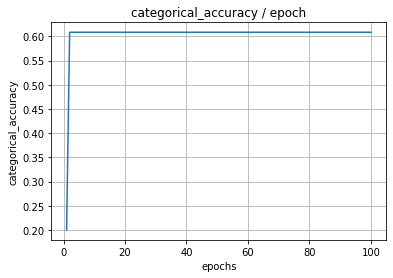

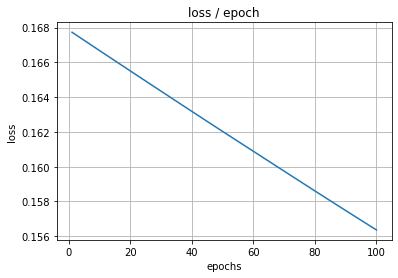

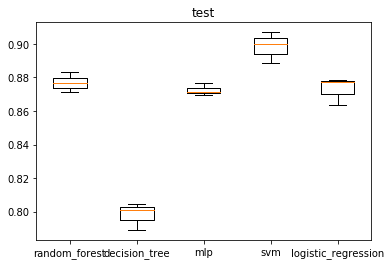

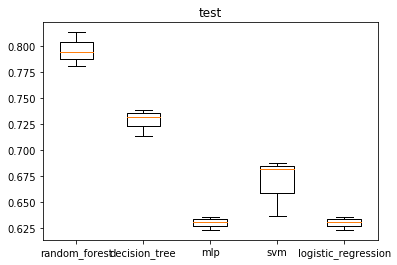

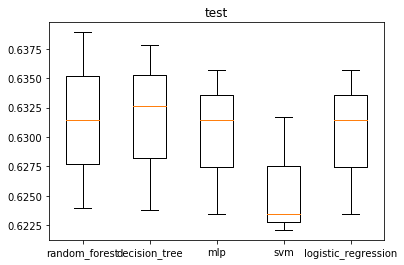

In [29]:
clustered_data, indicies, encoded_data = {},{},{}
for i in range(num_clusters):
    indicies[i] = [j for j,value in enumerate(clustering_algorithm.labels_) if value==i]
    clustered_data[i] = pd.DataFrame(tf_idf[indicies[i]])
    encoded_data[i] = data_encoder(tf_idf[indicies[i]],i)
classification_evaluation(num_clusters, encoded_data, data['labels'], indicies)

## Explanation of our approach 
We read the Text and labels from each file in dataset, after which we preprocessed the text by removing digits, removing special characters, converting other cases to lower cases and lemmatization of the words. Then saved it in the data frame. We also extracted the labels and saved it in the data frame then we returned the data frame. After this we converted the features to TF-IDF vectors then plotted a scatter plot of the features with the tsne dimensionality reduction then evaluated the cluster algorithms of k-means, dbscan and optics with SSE, Silhouette and David-Bouldin after which we discovered that the best algorithm for our problem is the k-means algorithm with the best number of clusters being 8 . Then we clustered with the k – means algorithms assigned the cluster ids. We passed the data with each cluster to the data encoder function which used 3 different types of autoencoders the autoencoder are designed to encode and decode the data, but the functions return the code lowest dimension (hidden layer) which are the extracted features where the encoder stores the most important features. The following autoencoders are implemented the Basic autoencoder from the “Text feature extraction based on deep learning: a review” and the sparse and relational sparse autoencoders from the “Relational autoencoder for feature extraction” these methods were chosen because they produced good results in the papers and were applicable to the project goals. Then the extracted features are passed to for classification, we binarize the labels to perform multi-label classification and we trained the models with the extracted features and evaluate those models. The models we trained were the random forest, decision trees, Multi-layer Perceptron, Support Vector Machines, Logistic Regression and a deep neural network.

## Changes From Assignment 1 for Classification 
We performed feature extraction with autoencoders, and we used the encoded version of data extracted from the hidden layer to perform our classification. This approach helped us encoding data into the lower dimension with preserving its concept to improve classification performance. In order to increase the prediction performance of classification algorithms and earning better classification accuracy, we clustered similar data together using clustering algorithms (K-MEANS, DBSCAN, OPTICS) and then we feed each cluster to the classification algorithm. We decided to take advantage of the label-binarizer to prepare our label set for training. We also attempted to use a deep Artificial neural network with Keras to perform classification. This network predicts the categorial label data and we attempted to see if we could get model performance with this method by tuning the number of layers, neurons and activation functions for the different layers.
